# CITE-seq analysis with totalVI

With totalVI, we can produce a joint latent representation of cells, denoised data for both protein and RNA, integrate datasets, and compute differential expression of RNA and protein. Here we demonstrate this functionality with an integrated analysis of PBMC10k and PBMC5k, datasets of peripheral blood mononuclear cells publicly available from 10X Genomics subset to the 14 shared proteins between them. The same pipeline would generally be used to analyze a single CITE-seq dataset.

If you use totalVI, please consider citing:

- Gayoso, A., Steier, Z., Lopez, R., Regier, J., Nazor, K. L., Streets, A., & Yosef, N. (2021). Joint probabilistic modeling of single-cell multi-omic data with totalVI. Nature Methods, 18(3), 272-282.

```{note}
Running the following cell will install tutorial dependencies on Google Colab only. It will have no effect on environments other than Google Colab.
```

In [1]:
!pip install --quiet scvi-colab
from scvi_colab import install

install()

/env/lib/python3.11/site-packages/scvi_colab/_core.py:41: UserWarning: 
                Not currently in Google Colab environment.

                Please run with `run_outside_colab=True` to override.

                Returning with no further action.
                
  warn(


In [2]:
import tempfile

import anndata as ad
import matplotlib.pyplot as plt
import mudata as md
import muon
import scanpy as sc
import scvi
import seaborn as sns
import torch

## Imports and data loading

In [3]:
scvi.settings.seed = 0
print("Last run with scvi-tools version:", scvi.__version__)

Seed set to 0


Last run with scvi-tools version: 1.1.0


```{note}
You can modify `save_dir` below to change where the data files for this tutorial are saved.
```

In [4]:
sc.set_figure_params(figsize=(6, 6), frameon=False)
sns.set_theme()
torch.set_float32_matmul_precision("high")
save_dir = tempfile.TemporaryDirectory()

%config InlineBackend.print_figure_kwargs={"facecolor": "w"}
%config InlineBackend.figure_format="retina"

This dataset was filtered as described in the totalVI manuscript (low quality cells, doublets, lowly expressed genes, etc.).

We run the standard workflow for keeping count and normalized data together.

In [5]:
adata = scvi.data.pbmcs_10x_cite_seq(save_path=save_dir.name)
adata

INFO     Downloading file at /tmp/tmpf7863_f4/pbmc_10k_protein_v3.h5ad                                             


Downloading...:   0%|          | 0/24937.0 [00:00<?, ?it/s]

Downloading...:  17%|█▋        | 4352/24937.0 [00:00<00:00, 43514.23it/s]

Downloading...:  66%|██████▌   | 16345/24937.0 [00:00<00:00, 88458.81it/s]

Downloading...: 24938it [00:00, 87475.97it/s]                             

INFO     Downloading file at /tmp/tmpf7863_f4/pbmc_5k_protein_v3.h5ad                                              


Downloading...:   0%|          | 0/18295.0 [00:00<?, ?it/s]

Downloading...:  38%|███▊      | 7015/18295.0 [00:00<00:00, 70049.36it/s]

Downloading...:  88%|████████▊ | 16018/18295.0 [00:00<00:00, 81767.58it/s]

Downloading...: 100%|██████████| 18295/18295.0 [00:00<00:00, 81284.01it/s]

/env/lib/python3.11/site-packages/scvi/data/_built_in_data/_cite_seq.py:47: ImplicitModificationWarning: Setting element `.obsm['protein_expression']` of view, initializing view as actual.
  dataset1.obsm["protein_expression"] = pd.DataFrame(


/env/lib/python3.11/site-packages/scvi/data/_built_in_data/_cite_seq.py:52: ImplicitModificationWarning: Setting element `.obsm['protein_expression']` of view, initializing view as actual.
  dataset2.obsm["protein_expression"] = pd.DataFrame(


/env/lib/python3.11/site-packages/anndata/_core/anndata.py:1906: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


AnnData object with n_obs × n_vars = 10849 × 15792
    obs: 'n_genes', 'percent_mito', 'n_counts', 'batch'
    obsm: 'protein_expression'

In [6]:
adata.layers["counts"] = adata.X.copy()
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)
adata.obs_names_make_unique()

```{important}
In this tutorial we will show totalVI's compatibility with the [MuData](https://mudata.readthedocs.io/en/latest/api/generated/mudata.MuData.html#mudata.MuData) format, which is a container for multiple AnnData objects. MuData objects can be read from the outputs of CellRanger using `muon.read_10x_h5`.

Furthermore, AnnData alone can also be used by storing the protein count data in `.obsm`, which is how it already is. For the AnnData-only workflow, see the documentation for `setup_anndata` in `scvi.model.TOTALVI`.
```

In [7]:
protein_adata = ad.AnnData(adata.obsm["protein_expression"])
protein_adata.obs_names = adata.obs_names
del adata.obsm["protein_expression"]
mdata = md.MuData({"rna": adata, "protein": protein_adata})
mdata

MuData object with n_obs × n_vars = 10849 × 15806
  2 modalities
    rna:	10849 x 15792
      obs:	'n_genes', 'percent_mito', 'n_counts', 'batch'
      uns:	'log1p'
      layers:	'counts'
    protein:	10849 x 14

In [8]:
sc.pp.highly_variable_genes(
    mdata.mod["rna"],
    n_top_genes=4000,
    flavor="seurat_v3",
    batch_key="batch",
    layer="counts",
)
# Place subsetted counts in a new modality
mdata.mod["rna_subset"] = mdata.mod["rna"][
    :, mdata.mod["rna"].var["highly_variable"]
].copy()

In [9]:
mdata.update()

/env/lib/python3.11/site-packages/mudata/_core/mudata.py:491: UserWarning: Cannot join columns with the same name because var_names are intersecting.
  warnings.warn(


### Setup mudata

Now we run `setup_mudata`, which is the MuData analog to `setup_anndata`. The caveat of this workflow is that we need to provide this function which modality of the `mdata` object contains each piece of data. So for example, the batch information is in `mdata.mod["rna"].obs["batch"]`. Therefore, in the `modalities` argument below we specify that the `batch_key` can be found in the `"rna_subset"` modality of the MuData object.

Notably, we provide `protein_layer=None`. This means scvi-tools will pull information from `.X` from the modality specified in `modalities` (`"protein"` in this case). In the case of RNA, we want to use the counts, which we stored in `mdata.mod["rna"].layers["counts"]`.

In [10]:
scvi.model.TOTALVI.setup_mudata(
    mdata,
    rna_layer="counts",
    protein_layer=None,
    batch_key="batch",
    modalities={
        "rna_layer": "rna_subset",
        "protein_layer": "protein",
        "batch_key": "rna_subset",
    },
)

<frozen abc>:119: FutureWarning: SparseDataset is deprecated and will be removed in late 2024. It has been replaced by the public classes CSRDataset and CSCDataset.

For instance checks, use `isinstance(X, (anndata.experimental.CSRDataset, anndata.experimental.CSCDataset))` instead.

For creation, use `anndata.experimental.sparse_dataset(X)` instead.



```{note}
Specify the modality of each argument via the `modalities` dictionary, which maps layer/key arguments to MuData modalities.
```

## Prepare and run model

In [11]:
model = scvi.model.TOTALVI(mdata)

INFO     Computing empirical prior initialization for protein background.                                          


In [12]:
model.train()

GPU available: True (cuda), used: True


TPU available: False, using: 0 TPU cores


IPU available: False, using: 0 IPUs


HPU available: False, using: 0 HPUs


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


/env/lib/python3.11/site-packages/lightning/pytorch/core/optimizer.py:314: The lr scheduler dict contains the key(s) ['monitor'], but the keys will be ignored. You need to call `lr_scheduler.step()` manually in manual optimization.
/env/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.
/env/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:441: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Training:   0%|          | 0/400 [00:00<?, ?it/s]

Epoch 1/400:   0%|          | 0/400 [00:00<?, ?it/s]

Epoch 1/400:   0%|          | 1/400 [00:01<07:13,  1.09s/it]

Epoch 1/400:   0%|          | 1/400 [00:01<07:13,  1.09s/it, v_num=1, train_loss_step=1.58e+3, train_loss_epoch=2.06e+3]

Epoch 2/400:   0%|          | 1/400 [00:01<07:13,  1.09s/it, v_num=1, train_loss_step=1.58e+3, train_loss_epoch=2.06e+3]

Epoch 2/400:   0%|          | 2/400 [00:01<04:31,  1.46it/s, v_num=1, train_loss_step=1.58e+3, train_loss_epoch=2.06e+3]

Epoch 2/400:   0%|          | 2/400 [00:01<04:31,  1.46it/s, v_num=1, train_loss_step=1.33e+3, train_loss_epoch=1.38e+3]

Epoch 3/400:   0%|          | 2/400 [00:01<04:31,  1.46it/s, v_num=1, train_loss_step=1.33e+3, train_loss_epoch=1.38e+3]

Epoch 3/400:   1%|          | 3/400 [00:01<03:39,  1.81it/s, v_num=1, train_loss_step=1.33e+3, train_loss_epoch=1.38e+3]

Epoch 3/400:   1%|          | 3/400 [00:01<03:39,  1.81it/s, v_num=1, train_loss_step=1.28e+3, train_loss_epoch=1.34e+3]

Epoch 4/400:   1%|          | 3/400 [00:01<03:39,  1.81it/s, v_num=1, train_loss_step=1.28e+3, train_loss_epoch=1.34e+3]

Epoch 4/400:   1%|          | 4/400 [00:02<03:15,  2.03it/s, v_num=1, train_loss_step=1.28e+3, train_loss_epoch=1.34e+3]

Epoch 4/400:   1%|          | 4/400 [00:02<03:15,  2.03it/s, v_num=1, train_loss_step=1.45e+3, train_loss_epoch=1.33e+3]

Epoch 5/400:   1%|          | 4/400 [00:02<03:15,  2.03it/s, v_num=1, train_loss_step=1.45e+3, train_loss_epoch=1.33e+3]

Epoch 5/400:   1%|▏         | 5/400 [00:02<03:01,  2.18it/s, v_num=1, train_loss_step=1.45e+3, train_loss_epoch=1.33e+3]

Epoch 5/400:   1%|▏         | 5/400 [00:02<03:01,  2.18it/s, v_num=1, train_loss_step=1.21e+3, train_loss_epoch=1.32e+3]

Epoch 6/400:   1%|▏         | 5/400 [00:02<03:01,  2.18it/s, v_num=1, train_loss_step=1.21e+3, train_loss_epoch=1.32e+3]

Epoch 6/400:   2%|▏         | 6/400 [00:03<02:52,  2.28it/s, v_num=1, train_loss_step=1.21e+3, train_loss_epoch=1.32e+3]

Epoch 6/400:   2%|▏         | 6/400 [00:03<02:52,  2.28it/s, v_num=1, train_loss_step=1.18e+3, train_loss_epoch=1.31e+3]

Epoch 7/400:   2%|▏         | 6/400 [00:03<02:52,  2.28it/s, v_num=1, train_loss_step=1.18e+3, train_loss_epoch=1.31e+3]

Epoch 7/400:   2%|▏         | 7/400 [00:03<02:47,  2.35it/s, v_num=1, train_loss_step=1.18e+3, train_loss_epoch=1.31e+3]

Epoch 7/400:   2%|▏         | 7/400 [00:03<02:47,  2.35it/s, v_num=1, train_loss_step=1.29e+3, train_loss_epoch=1.3e+3] 

Epoch 8/400:   2%|▏         | 7/400 [00:03<02:47,  2.35it/s, v_num=1, train_loss_step=1.29e+3, train_loss_epoch=1.3e+3]

Epoch 8/400:   2%|▏         | 8/400 [00:03<02:43,  2.40it/s, v_num=1, train_loss_step=1.29e+3, train_loss_epoch=1.3e+3]

Epoch 8/400:   2%|▏         | 8/400 [00:03<02:43,  2.40it/s, v_num=1, train_loss_step=1.38e+3, train_loss_epoch=1.29e+3]

Epoch 9/400:   2%|▏         | 8/400 [00:03<02:43,  2.40it/s, v_num=1, train_loss_step=1.38e+3, train_loss_epoch=1.29e+3]

Epoch 9/400:   2%|▏         | 9/400 [00:04<02:40,  2.43it/s, v_num=1, train_loss_step=1.38e+3, train_loss_epoch=1.29e+3]

Epoch 9/400:   2%|▏         | 9/400 [00:04<02:40,  2.43it/s, v_num=1, train_loss_step=1.2e+3, train_loss_epoch=1.29e+3] 

Epoch 10/400:   2%|▏         | 9/400 [00:04<02:40,  2.43it/s, v_num=1, train_loss_step=1.2e+3, train_loss_epoch=1.29e+3]

Epoch 10/400:   2%|▎         | 10/400 [00:04<02:38,  2.46it/s, v_num=1, train_loss_step=1.2e+3, train_loss_epoch=1.29e+3]

Epoch 10/400:   2%|▎         | 10/400 [00:04<02:38,  2.46it/s, v_num=1, train_loss_step=1.13e+3, train_loss_epoch=1.28e+3]

Epoch 11/400:   2%|▎         | 10/400 [00:04<02:38,  2.46it/s, v_num=1, train_loss_step=1.13e+3, train_loss_epoch=1.28e+3]

Epoch 11/400:   3%|▎         | 11/400 [00:05<02:37,  2.47it/s, v_num=1, train_loss_step=1.13e+3, train_loss_epoch=1.28e+3]

Epoch 11/400:   3%|▎         | 11/400 [00:05<02:37,  2.47it/s, v_num=1, train_loss_step=1.27e+3, train_loss_epoch=1.28e+3]

Epoch 12/400:   3%|▎         | 11/400 [00:05<02:37,  2.47it/s, v_num=1, train_loss_step=1.27e+3, train_loss_epoch=1.28e+3]

Epoch 12/400:   3%|▎         | 12/400 [00:05<02:36,  2.48it/s, v_num=1, train_loss_step=1.27e+3, train_loss_epoch=1.28e+3]

Epoch 12/400:   3%|▎         | 12/400 [00:05<02:36,  2.48it/s, v_num=1, train_loss_step=1.37e+3, train_loss_epoch=1.27e+3]

Epoch 13/400:   3%|▎         | 12/400 [00:05<02:36,  2.48it/s, v_num=1, train_loss_step=1.37e+3, train_loss_epoch=1.27e+3]

Epoch 13/400:   3%|▎         | 13/400 [00:05<02:35,  2.49it/s, v_num=1, train_loss_step=1.37e+3, train_loss_epoch=1.27e+3]

Epoch 13/400:   3%|▎         | 13/400 [00:05<02:35,  2.49it/s, v_num=1, train_loss_step=1.3e+3, train_loss_epoch=1.27e+3] 

Epoch 14/400:   3%|▎         | 13/400 [00:05<02:35,  2.49it/s, v_num=1, train_loss_step=1.3e+3, train_loss_epoch=1.27e+3]

Epoch 14/400:   4%|▎         | 14/400 [00:06<02:34,  2.49it/s, v_num=1, train_loss_step=1.3e+3, train_loss_epoch=1.27e+3]

Epoch 14/400:   4%|▎         | 14/400 [00:06<02:34,  2.49it/s, v_num=1, train_loss_step=1.25e+3, train_loss_epoch=1.27e+3]

Epoch 15/400:   4%|▎         | 14/400 [00:06<02:34,  2.49it/s, v_num=1, train_loss_step=1.25e+3, train_loss_epoch=1.27e+3]

Epoch 15/400:   4%|▍         | 15/400 [00:06<02:34,  2.50it/s, v_num=1, train_loss_step=1.25e+3, train_loss_epoch=1.27e+3]

Epoch 15/400:   4%|▍         | 15/400 [00:06<02:34,  2.50it/s, v_num=1, train_loss_step=1.2e+3, train_loss_epoch=1.26e+3] 

Epoch 16/400:   4%|▍         | 15/400 [00:06<02:34,  2.50it/s, v_num=1, train_loss_step=1.2e+3, train_loss_epoch=1.26e+3]

Epoch 16/400:   4%|▍         | 16/400 [00:07<02:33,  2.50it/s, v_num=1, train_loss_step=1.2e+3, train_loss_epoch=1.26e+3]

Epoch 16/400:   4%|▍         | 16/400 [00:07<02:33,  2.50it/s, v_num=1, train_loss_step=1.24e+3, train_loss_epoch=1.26e+3]

Epoch 17/400:   4%|▍         | 16/400 [00:07<02:33,  2.50it/s, v_num=1, train_loss_step=1.24e+3, train_loss_epoch=1.26e+3]

Epoch 17/400:   4%|▍         | 17/400 [00:07<02:33,  2.50it/s, v_num=1, train_loss_step=1.24e+3, train_loss_epoch=1.26e+3]

Epoch 17/400:   4%|▍         | 17/400 [00:07<02:33,  2.50it/s, v_num=1, train_loss_step=1.24e+3, train_loss_epoch=1.26e+3]

Epoch 18/400:   4%|▍         | 17/400 [00:07<02:33,  2.50it/s, v_num=1, train_loss_step=1.24e+3, train_loss_epoch=1.26e+3]

Epoch 18/400:   4%|▍         | 18/400 [00:07<02:32,  2.50it/s, v_num=1, train_loss_step=1.24e+3, train_loss_epoch=1.26e+3]

Epoch 18/400:   4%|▍         | 18/400 [00:07<02:32,  2.50it/s, v_num=1, train_loss_step=1.19e+3, train_loss_epoch=1.26e+3]

Epoch 19/400:   4%|▍         | 18/400 [00:07<02:32,  2.50it/s, v_num=1, train_loss_step=1.19e+3, train_loss_epoch=1.26e+3]

Epoch 19/400:   5%|▍         | 19/400 [00:08<02:32,  2.51it/s, v_num=1, train_loss_step=1.19e+3, train_loss_epoch=1.26e+3]

Epoch 19/400:   5%|▍         | 19/400 [00:08<02:32,  2.51it/s, v_num=1, train_loss_step=1.14e+3, train_loss_epoch=1.26e+3]

Epoch 20/400:   5%|▍         | 19/400 [00:08<02:32,  2.51it/s, v_num=1, train_loss_step=1.14e+3, train_loss_epoch=1.26e+3]

Epoch 20/400:   5%|▌         | 20/400 [00:08<02:31,  2.51it/s, v_num=1, train_loss_step=1.14e+3, train_loss_epoch=1.26e+3]

Epoch 20/400:   5%|▌         | 20/400 [00:08<02:31,  2.51it/s, v_num=1, train_loss_step=1.12e+3, train_loss_epoch=1.25e+3]

Epoch 21/400:   5%|▌         | 20/400 [00:08<02:31,  2.51it/s, v_num=1, train_loss_step=1.12e+3, train_loss_epoch=1.25e+3]

Epoch 21/400:   5%|▌         | 21/400 [00:09<02:31,  2.51it/s, v_num=1, train_loss_step=1.12e+3, train_loss_epoch=1.25e+3]

Epoch 21/400:   5%|▌         | 21/400 [00:09<02:31,  2.51it/s, v_num=1, train_loss_step=1.27e+3, train_loss_epoch=1.25e+3]

Epoch 22/400:   5%|▌         | 21/400 [00:09<02:31,  2.51it/s, v_num=1, train_loss_step=1.27e+3, train_loss_epoch=1.25e+3]

Epoch 22/400:   6%|▌         | 22/400 [00:09<02:30,  2.51it/s, v_num=1, train_loss_step=1.27e+3, train_loss_epoch=1.25e+3]

Epoch 22/400:   6%|▌         | 22/400 [00:09<02:30,  2.51it/s, v_num=1, train_loss_step=1.12e+3, train_loss_epoch=1.25e+3]

Epoch 23/400:   6%|▌         | 22/400 [00:09<02:30,  2.51it/s, v_num=1, train_loss_step=1.12e+3, train_loss_epoch=1.25e+3]

Epoch 23/400:   6%|▌         | 23/400 [00:09<02:29,  2.51it/s, v_num=1, train_loss_step=1.12e+3, train_loss_epoch=1.25e+3]

Epoch 23/400:   6%|▌         | 23/400 [00:09<02:29,  2.51it/s, v_num=1, train_loss_step=1.28e+3, train_loss_epoch=1.25e+3]

Epoch 24/400:   6%|▌         | 23/400 [00:09<02:29,  2.51it/s, v_num=1, train_loss_step=1.28e+3, train_loss_epoch=1.25e+3]

Epoch 24/400:   6%|▌         | 24/400 [00:10<02:29,  2.52it/s, v_num=1, train_loss_step=1.28e+3, train_loss_epoch=1.25e+3]

Epoch 24/400:   6%|▌         | 24/400 [00:10<02:29,  2.52it/s, v_num=1, train_loss_step=1.06e+3, train_loss_epoch=1.25e+3]

Epoch 25/400:   6%|▌         | 24/400 [00:10<02:29,  2.52it/s, v_num=1, train_loss_step=1.06e+3, train_loss_epoch=1.25e+3]

Epoch 25/400:   6%|▋         | 25/400 [00:10<02:28,  2.52it/s, v_num=1, train_loss_step=1.06e+3, train_loss_epoch=1.25e+3]

Epoch 25/400:   6%|▋         | 25/400 [00:10<02:28,  2.52it/s, v_num=1, train_loss_step=1.16e+3, train_loss_epoch=1.25e+3]

Epoch 26/400:   6%|▋         | 25/400 [00:10<02:28,  2.52it/s, v_num=1, train_loss_step=1.16e+3, train_loss_epoch=1.25e+3]

Epoch 26/400:   6%|▋         | 26/400 [00:11<02:28,  2.52it/s, v_num=1, train_loss_step=1.16e+3, train_loss_epoch=1.25e+3]

Epoch 26/400:   6%|▋         | 26/400 [00:11<02:28,  2.52it/s, v_num=1, train_loss_step=1.3e+3, train_loss_epoch=1.24e+3] 

Epoch 27/400:   6%|▋         | 26/400 [00:11<02:28,  2.52it/s, v_num=1, train_loss_step=1.3e+3, train_loss_epoch=1.24e+3]

Epoch 27/400:   7%|▋         | 27/400 [00:11<02:27,  2.52it/s, v_num=1, train_loss_step=1.3e+3, train_loss_epoch=1.24e+3]

Epoch 27/400:   7%|▋         | 27/400 [00:11<02:27,  2.52it/s, v_num=1, train_loss_step=1.25e+3, train_loss_epoch=1.24e+3]

Epoch 28/400:   7%|▋         | 27/400 [00:11<02:27,  2.52it/s, v_num=1, train_loss_step=1.25e+3, train_loss_epoch=1.24e+3]

Epoch 28/400:   7%|▋         | 28/400 [00:11<02:27,  2.52it/s, v_num=1, train_loss_step=1.25e+3, train_loss_epoch=1.24e+3]

Epoch 28/400:   7%|▋         | 28/400 [00:11<02:27,  2.52it/s, v_num=1, train_loss_step=1.28e+3, train_loss_epoch=1.24e+3]

Epoch 29/400:   7%|▋         | 28/400 [00:11<02:27,  2.52it/s, v_num=1, train_loss_step=1.28e+3, train_loss_epoch=1.24e+3]

Epoch 29/400:   7%|▋         | 29/400 [00:12<02:27,  2.52it/s, v_num=1, train_loss_step=1.28e+3, train_loss_epoch=1.24e+3]

Epoch 29/400:   7%|▋         | 29/400 [00:12<02:27,  2.52it/s, v_num=1, train_loss_step=1.32e+3, train_loss_epoch=1.24e+3]

Epoch 30/400:   7%|▋         | 29/400 [00:12<02:27,  2.52it/s, v_num=1, train_loss_step=1.32e+3, train_loss_epoch=1.24e+3]

Epoch 30/400:   8%|▊         | 30/400 [00:12<02:26,  2.52it/s, v_num=1, train_loss_step=1.32e+3, train_loss_epoch=1.24e+3]

Epoch 30/400:   8%|▊         | 30/400 [00:12<02:26,  2.52it/s, v_num=1, train_loss_step=1.05e+3, train_loss_epoch=1.24e+3]

Epoch 31/400:   8%|▊         | 30/400 [00:12<02:26,  2.52it/s, v_num=1, train_loss_step=1.05e+3, train_loss_epoch=1.24e+3]

Epoch 31/400:   8%|▊         | 31/400 [00:13<02:26,  2.52it/s, v_num=1, train_loss_step=1.05e+3, train_loss_epoch=1.24e+3]

Epoch 31/400:   8%|▊         | 31/400 [00:13<02:26,  2.52it/s, v_num=1, train_loss_step=1.28e+3, train_loss_epoch=1.24e+3]

Epoch 32/400:   8%|▊         | 31/400 [00:13<02:26,  2.52it/s, v_num=1, train_loss_step=1.28e+3, train_loss_epoch=1.24e+3]

Epoch 32/400:   8%|▊         | 32/400 [00:13<02:25,  2.52it/s, v_num=1, train_loss_step=1.28e+3, train_loss_epoch=1.24e+3]

Epoch 32/400:   8%|▊         | 32/400 [00:13<02:25,  2.52it/s, v_num=1, train_loss_step=1.23e+3, train_loss_epoch=1.24e+3]

Epoch 33/400:   8%|▊         | 32/400 [00:13<02:25,  2.52it/s, v_num=1, train_loss_step=1.23e+3, train_loss_epoch=1.24e+3]

Epoch 33/400:   8%|▊         | 33/400 [00:13<02:25,  2.52it/s, v_num=1, train_loss_step=1.23e+3, train_loss_epoch=1.24e+3]

Epoch 33/400:   8%|▊         | 33/400 [00:13<02:25,  2.52it/s, v_num=1, train_loss_step=1.25e+3, train_loss_epoch=1.24e+3]

Epoch 34/400:   8%|▊         | 33/400 [00:13<02:25,  2.52it/s, v_num=1, train_loss_step=1.25e+3, train_loss_epoch=1.24e+3]

Epoch 34/400:   8%|▊         | 34/400 [00:14<02:25,  2.52it/s, v_num=1, train_loss_step=1.25e+3, train_loss_epoch=1.24e+3]

Epoch 34/400:   8%|▊         | 34/400 [00:14<02:25,  2.52it/s, v_num=1, train_loss_step=1.34e+3, train_loss_epoch=1.24e+3]

Epoch 35/400:   8%|▊         | 34/400 [00:14<02:25,  2.52it/s, v_num=1, train_loss_step=1.34e+3, train_loss_epoch=1.24e+3]

Epoch 35/400:   9%|▉         | 35/400 [00:14<02:24,  2.52it/s, v_num=1, train_loss_step=1.34e+3, train_loss_epoch=1.24e+3]

Epoch 35/400:   9%|▉         | 35/400 [00:14<02:24,  2.52it/s, v_num=1, train_loss_step=1.25e+3, train_loss_epoch=1.24e+3]

Epoch 36/400:   9%|▉         | 35/400 [00:14<02:24,  2.52it/s, v_num=1, train_loss_step=1.25e+3, train_loss_epoch=1.24e+3]

Epoch 36/400:   9%|▉         | 36/400 [00:15<02:24,  2.52it/s, v_num=1, train_loss_step=1.25e+3, train_loss_epoch=1.24e+3]

Epoch 36/400:   9%|▉         | 36/400 [00:15<02:24,  2.52it/s, v_num=1, train_loss_step=1.26e+3, train_loss_epoch=1.23e+3]

Epoch 37/400:   9%|▉         | 36/400 [00:15<02:24,  2.52it/s, v_num=1, train_loss_step=1.26e+3, train_loss_epoch=1.23e+3]

Epoch 37/400:   9%|▉         | 37/400 [00:15<02:23,  2.52it/s, v_num=1, train_loss_step=1.26e+3, train_loss_epoch=1.23e+3]

Epoch 37/400:   9%|▉         | 37/400 [00:15<02:23,  2.52it/s, v_num=1, train_loss_step=1.28e+3, train_loss_epoch=1.24e+3]

Epoch 38/400:   9%|▉         | 37/400 [00:15<02:23,  2.52it/s, v_num=1, train_loss_step=1.28e+3, train_loss_epoch=1.24e+3]

Epoch 38/400:  10%|▉         | 38/400 [00:15<02:23,  2.52it/s, v_num=1, train_loss_step=1.28e+3, train_loss_epoch=1.24e+3]

Epoch 38/400:  10%|▉         | 38/400 [00:15<02:23,  2.52it/s, v_num=1, train_loss_step=1.33e+3, train_loss_epoch=1.23e+3]

Epoch 39/400:  10%|▉         | 38/400 [00:15<02:23,  2.52it/s, v_num=1, train_loss_step=1.33e+3, train_loss_epoch=1.23e+3]

Epoch 39/400:  10%|▉         | 39/400 [00:16<02:23,  2.52it/s, v_num=1, train_loss_step=1.33e+3, train_loss_epoch=1.23e+3]

Epoch 39/400:  10%|▉         | 39/400 [00:16<02:23,  2.52it/s, v_num=1, train_loss_step=1.27e+3, train_loss_epoch=1.23e+3]

Epoch 40/400:  10%|▉         | 39/400 [00:16<02:23,  2.52it/s, v_num=1, train_loss_step=1.27e+3, train_loss_epoch=1.23e+3]

Epoch 40/400:  10%|█         | 40/400 [00:16<02:22,  2.52it/s, v_num=1, train_loss_step=1.27e+3, train_loss_epoch=1.23e+3]

Epoch 40/400:  10%|█         | 40/400 [00:16<02:22,  2.52it/s, v_num=1, train_loss_step=1.17e+3, train_loss_epoch=1.23e+3]

Epoch 41/400:  10%|█         | 40/400 [00:16<02:22,  2.52it/s, v_num=1, train_loss_step=1.17e+3, train_loss_epoch=1.23e+3]

Epoch 41/400:  10%|█         | 41/400 [00:16<02:22,  2.52it/s, v_num=1, train_loss_step=1.17e+3, train_loss_epoch=1.23e+3]

Epoch 41/400:  10%|█         | 41/400 [00:16<02:22,  2.52it/s, v_num=1, train_loss_step=1.28e+3, train_loss_epoch=1.23e+3]

Epoch 42/400:  10%|█         | 41/400 [00:16<02:22,  2.52it/s, v_num=1, train_loss_step=1.28e+3, train_loss_epoch=1.23e+3]

Epoch 42/400:  10%|█         | 42/400 [00:17<02:21,  2.52it/s, v_num=1, train_loss_step=1.28e+3, train_loss_epoch=1.23e+3]

Epoch 42/400:  10%|█         | 42/400 [00:17<02:21,  2.52it/s, v_num=1, train_loss_step=1.11e+3, train_loss_epoch=1.23e+3]

Epoch 43/400:  10%|█         | 42/400 [00:17<02:21,  2.52it/s, v_num=1, train_loss_step=1.11e+3, train_loss_epoch=1.23e+3]

Epoch 43/400:  11%|█         | 43/400 [00:17<02:21,  2.52it/s, v_num=1, train_loss_step=1.11e+3, train_loss_epoch=1.23e+3]

Epoch 43/400:  11%|█         | 43/400 [00:17<02:21,  2.52it/s, v_num=1, train_loss_step=1.05e+3, train_loss_epoch=1.23e+3]

Epoch 44/400:  11%|█         | 43/400 [00:17<02:21,  2.52it/s, v_num=1, train_loss_step=1.05e+3, train_loss_epoch=1.23e+3]

Epoch 44/400:  11%|█         | 44/400 [00:18<02:21,  2.52it/s, v_num=1, train_loss_step=1.05e+3, train_loss_epoch=1.23e+3]

Epoch 44/400:  11%|█         | 44/400 [00:18<02:21,  2.52it/s, v_num=1, train_loss_step=1.38e+3, train_loss_epoch=1.23e+3]

Epoch 45/400:  11%|█         | 44/400 [00:18<02:21,  2.52it/s, v_num=1, train_loss_step=1.38e+3, train_loss_epoch=1.23e+3]

Epoch 45/400:  11%|█▏        | 45/400 [00:18<02:20,  2.52it/s, v_num=1, train_loss_step=1.38e+3, train_loss_epoch=1.23e+3]

Epoch 45/400:  11%|█▏        | 45/400 [00:18<02:20,  2.52it/s, v_num=1, train_loss_step=1.23e+3, train_loss_epoch=1.23e+3]

Epoch 46/400:  11%|█▏        | 45/400 [00:18<02:20,  2.52it/s, v_num=1, train_loss_step=1.23e+3, train_loss_epoch=1.23e+3]

Epoch 46/400:  12%|█▏        | 46/400 [00:18<02:20,  2.52it/s, v_num=1, train_loss_step=1.23e+3, train_loss_epoch=1.23e+3]

Epoch 46/400:  12%|█▏        | 46/400 [00:18<02:20,  2.52it/s, v_num=1, train_loss_step=1.09e+3, train_loss_epoch=1.23e+3]

Epoch 47/400:  12%|█▏        | 46/400 [00:18<02:20,  2.52it/s, v_num=1, train_loss_step=1.09e+3, train_loss_epoch=1.23e+3]

Epoch 47/400:  12%|█▏        | 47/400 [00:19<02:19,  2.53it/s, v_num=1, train_loss_step=1.09e+3, train_loss_epoch=1.23e+3]

Epoch 47/400:  12%|█▏        | 47/400 [00:19<02:19,  2.53it/s, v_num=1, train_loss_step=1.29e+3, train_loss_epoch=1.23e+3]

Epoch 48/400:  12%|█▏        | 47/400 [00:19<02:19,  2.53it/s, v_num=1, train_loss_step=1.29e+3, train_loss_epoch=1.23e+3]

Epoch 48/400:  12%|█▏        | 48/400 [00:19<02:19,  2.53it/s, v_num=1, train_loss_step=1.29e+3, train_loss_epoch=1.23e+3]

Epoch 48/400:  12%|█▏        | 48/400 [00:19<02:19,  2.53it/s, v_num=1, train_loss_step=1.16e+3, train_loss_epoch=1.23e+3]

Epoch 49/400:  12%|█▏        | 48/400 [00:19<02:19,  2.53it/s, v_num=1, train_loss_step=1.16e+3, train_loss_epoch=1.23e+3]

Epoch 49/400:  12%|█▏        | 49/400 [00:20<02:18,  2.53it/s, v_num=1, train_loss_step=1.16e+3, train_loss_epoch=1.23e+3]

Epoch 49/400:  12%|█▏        | 49/400 [00:20<02:18,  2.53it/s, v_num=1, train_loss_step=1.25e+3, train_loss_epoch=1.23e+3]

Epoch 50/400:  12%|█▏        | 49/400 [00:20<02:18,  2.53it/s, v_num=1, train_loss_step=1.25e+3, train_loss_epoch=1.23e+3]

Epoch 50/400:  12%|█▎        | 50/400 [00:20<02:18,  2.53it/s, v_num=1, train_loss_step=1.25e+3, train_loss_epoch=1.23e+3]

Epoch 50/400:  12%|█▎        | 50/400 [00:20<02:18,  2.53it/s, v_num=1, train_loss_step=1.08e+3, train_loss_epoch=1.23e+3]

Epoch 51/400:  12%|█▎        | 50/400 [00:20<02:18,  2.53it/s, v_num=1, train_loss_step=1.08e+3, train_loss_epoch=1.23e+3]

Epoch 51/400:  13%|█▎        | 51/400 [00:20<02:17,  2.53it/s, v_num=1, train_loss_step=1.08e+3, train_loss_epoch=1.23e+3]

Epoch 51/400:  13%|█▎        | 51/400 [00:20<02:17,  2.53it/s, v_num=1, train_loss_step=1.28e+3, train_loss_epoch=1.23e+3]

Epoch 52/400:  13%|█▎        | 51/400 [00:20<02:17,  2.53it/s, v_num=1, train_loss_step=1.28e+3, train_loss_epoch=1.23e+3]

Epoch 52/400:  13%|█▎        | 52/400 [00:21<02:17,  2.53it/s, v_num=1, train_loss_step=1.28e+3, train_loss_epoch=1.23e+3]

Epoch 52/400:  13%|█▎        | 52/400 [00:21<02:17,  2.53it/s, v_num=1, train_loss_step=1.42e+3, train_loss_epoch=1.23e+3]

Epoch 53/400:  13%|█▎        | 52/400 [00:21<02:17,  2.53it/s, v_num=1, train_loss_step=1.42e+3, train_loss_epoch=1.23e+3]

Epoch 53/400:  13%|█▎        | 53/400 [00:21<02:17,  2.53it/s, v_num=1, train_loss_step=1.42e+3, train_loss_epoch=1.23e+3]

Epoch 53/400:  13%|█▎        | 53/400 [00:21<02:17,  2.53it/s, v_num=1, train_loss_step=1.22e+3, train_loss_epoch=1.23e+3]

Epoch 54/400:  13%|█▎        | 53/400 [00:21<02:17,  2.53it/s, v_num=1, train_loss_step=1.22e+3, train_loss_epoch=1.23e+3]

Epoch 54/400:  14%|█▎        | 54/400 [00:22<02:16,  2.53it/s, v_num=1, train_loss_step=1.22e+3, train_loss_epoch=1.23e+3]

Epoch 54/400:  14%|█▎        | 54/400 [00:22<02:16,  2.53it/s, v_num=1, train_loss_step=1.2e+3, train_loss_epoch=1.23e+3] 

Epoch 55/400:  14%|█▎        | 54/400 [00:22<02:16,  2.53it/s, v_num=1, train_loss_step=1.2e+3, train_loss_epoch=1.23e+3]

Epoch 55/400:  14%|█▍        | 55/400 [00:22<02:16,  2.53it/s, v_num=1, train_loss_step=1.2e+3, train_loss_epoch=1.23e+3]

Epoch 55/400:  14%|█▍        | 55/400 [00:22<02:16,  2.53it/s, v_num=1, train_loss_step=1.27e+3, train_loss_epoch=1.23e+3]

Epoch 56/400:  14%|█▍        | 55/400 [00:22<02:16,  2.53it/s, v_num=1, train_loss_step=1.27e+3, train_loss_epoch=1.23e+3]

Epoch 56/400:  14%|█▍        | 56/400 [00:22<02:16,  2.53it/s, v_num=1, train_loss_step=1.27e+3, train_loss_epoch=1.23e+3]

Epoch 56/400:  14%|█▍        | 56/400 [00:22<02:16,  2.53it/s, v_num=1, train_loss_step=1.12e+3, train_loss_epoch=1.23e+3]

Epoch 57/400:  14%|█▍        | 56/400 [00:22<02:16,  2.53it/s, v_num=1, train_loss_step=1.12e+3, train_loss_epoch=1.23e+3]

Epoch 57/400:  14%|█▍        | 57/400 [00:23<02:15,  2.53it/s, v_num=1, train_loss_step=1.12e+3, train_loss_epoch=1.23e+3]

Epoch 57/400:  14%|█▍        | 57/400 [00:23<02:15,  2.53it/s, v_num=1, train_loss_step=1.1e+3, train_loss_epoch=1.23e+3] 

Epoch 58/400:  14%|█▍        | 57/400 [00:23<02:15,  2.53it/s, v_num=1, train_loss_step=1.1e+3, train_loss_epoch=1.23e+3]

Epoch 58/400:  14%|█▍        | 58/400 [00:23<02:15,  2.53it/s, v_num=1, train_loss_step=1.1e+3, train_loss_epoch=1.23e+3]

Epoch 58/400:  14%|█▍        | 58/400 [00:23<02:15,  2.53it/s, v_num=1, train_loss_step=1.11e+3, train_loss_epoch=1.23e+3]

Epoch 59/400:  14%|█▍        | 58/400 [00:23<02:15,  2.53it/s, v_num=1, train_loss_step=1.11e+3, train_loss_epoch=1.23e+3]

Epoch 59/400:  15%|█▍        | 59/400 [00:24<02:14,  2.53it/s, v_num=1, train_loss_step=1.11e+3, train_loss_epoch=1.23e+3]

Epoch 59/400:  15%|█▍        | 59/400 [00:24<02:14,  2.53it/s, v_num=1, train_loss_step=1.32e+3, train_loss_epoch=1.23e+3]

Epoch 60/400:  15%|█▍        | 59/400 [00:24<02:14,  2.53it/s, v_num=1, train_loss_step=1.32e+3, train_loss_epoch=1.23e+3]

Epoch 60/400:  15%|█▌        | 60/400 [00:24<02:14,  2.53it/s, v_num=1, train_loss_step=1.32e+3, train_loss_epoch=1.23e+3]

Epoch 60/400:  15%|█▌        | 60/400 [00:24<02:14,  2.53it/s, v_num=1, train_loss_step=1.41e+3, train_loss_epoch=1.23e+3]

Epoch 61/400:  15%|█▌        | 60/400 [00:24<02:14,  2.53it/s, v_num=1, train_loss_step=1.41e+3, train_loss_epoch=1.23e+3]

Epoch 61/400:  15%|█▌        | 61/400 [00:24<02:14,  2.53it/s, v_num=1, train_loss_step=1.41e+3, train_loss_epoch=1.23e+3]

Epoch 61/400:  15%|█▌        | 61/400 [00:24<02:14,  2.53it/s, v_num=1, train_loss_step=1.26e+3, train_loss_epoch=1.23e+3]

Epoch 62/400:  15%|█▌        | 61/400 [00:24<02:14,  2.53it/s, v_num=1, train_loss_step=1.26e+3, train_loss_epoch=1.23e+3]

Epoch 62/400:  16%|█▌        | 62/400 [00:25<02:13,  2.53it/s, v_num=1, train_loss_step=1.26e+3, train_loss_epoch=1.23e+3]

Epoch 62/400:  16%|█▌        | 62/400 [00:25<02:13,  2.53it/s, v_num=1, train_loss_step=1.31e+3, train_loss_epoch=1.22e+3]

Epoch 63/400:  16%|█▌        | 62/400 [00:25<02:13,  2.53it/s, v_num=1, train_loss_step=1.31e+3, train_loss_epoch=1.22e+3]

Epoch 63/400:  16%|█▌        | 63/400 [00:25<02:13,  2.53it/s, v_num=1, train_loss_step=1.31e+3, train_loss_epoch=1.22e+3]

Epoch 63/400:  16%|█▌        | 63/400 [00:25<02:13,  2.53it/s, v_num=1, train_loss_step=1.16e+3, train_loss_epoch=1.22e+3]

Epoch 64/400:  16%|█▌        | 63/400 [00:25<02:13,  2.53it/s, v_num=1, train_loss_step=1.16e+3, train_loss_epoch=1.22e+3]

Epoch 64/400:  16%|█▌        | 64/400 [00:26<02:12,  2.53it/s, v_num=1, train_loss_step=1.16e+3, train_loss_epoch=1.22e+3]

Epoch 64/400:  16%|█▌        | 64/400 [00:26<02:12,  2.53it/s, v_num=1, train_loss_step=1.3e+3, train_loss_epoch=1.22e+3] 

Epoch 65/400:  16%|█▌        | 64/400 [00:26<02:12,  2.53it/s, v_num=1, train_loss_step=1.3e+3, train_loss_epoch=1.22e+3]

Epoch 65/400:  16%|█▋        | 65/400 [00:26<02:12,  2.53it/s, v_num=1, train_loss_step=1.3e+3, train_loss_epoch=1.22e+3]

Epoch 65/400:  16%|█▋        | 65/400 [00:26<02:12,  2.53it/s, v_num=1, train_loss_step=1.2e+3, train_loss_epoch=1.22e+3]

Epoch 66/400:  16%|█▋        | 65/400 [00:26<02:12,  2.53it/s, v_num=1, train_loss_step=1.2e+3, train_loss_epoch=1.22e+3]

Epoch 66/400:  16%|█▋        | 66/400 [00:26<02:11,  2.53it/s, v_num=1, train_loss_step=1.2e+3, train_loss_epoch=1.22e+3]

Epoch 66/400:  16%|█▋        | 66/400 [00:26<02:11,  2.53it/s, v_num=1, train_loss_step=1.19e+3, train_loss_epoch=1.22e+3]

Epoch 67/400:  16%|█▋        | 66/400 [00:26<02:11,  2.53it/s, v_num=1, train_loss_step=1.19e+3, train_loss_epoch=1.22e+3]

Epoch 67/400:  17%|█▋        | 67/400 [00:27<02:11,  2.53it/s, v_num=1, train_loss_step=1.19e+3, train_loss_epoch=1.22e+3]

Epoch 67/400:  17%|█▋        | 67/400 [00:27<02:11,  2.53it/s, v_num=1, train_loss_step=1.23e+3, train_loss_epoch=1.22e+3]

Epoch 68/400:  17%|█▋        | 67/400 [00:27<02:11,  2.53it/s, v_num=1, train_loss_step=1.23e+3, train_loss_epoch=1.22e+3]

Epoch 68/400:  17%|█▋        | 68/400 [00:27<02:11,  2.53it/s, v_num=1, train_loss_step=1.23e+3, train_loss_epoch=1.22e+3]

Epoch 68/400:  17%|█▋        | 68/400 [00:27<02:11,  2.53it/s, v_num=1, train_loss_step=1.19e+3, train_loss_epoch=1.22e+3]

Epoch 69/400:  17%|█▋        | 68/400 [00:27<02:11,  2.53it/s, v_num=1, train_loss_step=1.19e+3, train_loss_epoch=1.22e+3]

Epoch 69/400:  17%|█▋        | 69/400 [00:28<02:10,  2.53it/s, v_num=1, train_loss_step=1.19e+3, train_loss_epoch=1.22e+3]

Epoch 69/400:  17%|█▋        | 69/400 [00:28<02:10,  2.53it/s, v_num=1, train_loss_step=1.22e+3, train_loss_epoch=1.22e+3]

Epoch 70/400:  17%|█▋        | 69/400 [00:28<02:10,  2.53it/s, v_num=1, train_loss_step=1.22e+3, train_loss_epoch=1.22e+3]

Epoch 70/400:  18%|█▊        | 70/400 [00:28<02:10,  2.53it/s, v_num=1, train_loss_step=1.22e+3, train_loss_epoch=1.22e+3]

Epoch 70/400:  18%|█▊        | 70/400 [00:28<02:10,  2.53it/s, v_num=1, train_loss_step=1.23e+3, train_loss_epoch=1.22e+3]

Epoch 71/400:  18%|█▊        | 70/400 [00:28<02:10,  2.53it/s, v_num=1, train_loss_step=1.23e+3, train_loss_epoch=1.22e+3]

Epoch 71/400:  18%|█▊        | 71/400 [00:28<02:10,  2.53it/s, v_num=1, train_loss_step=1.23e+3, train_loss_epoch=1.22e+3]

Epoch 71/400:  18%|█▊        | 71/400 [00:28<02:10,  2.53it/s, v_num=1, train_loss_step=1.12e+3, train_loss_epoch=1.22e+3]

Epoch 72/400:  18%|█▊        | 71/400 [00:28<02:10,  2.53it/s, v_num=1, train_loss_step=1.12e+3, train_loss_epoch=1.22e+3]

Epoch 72/400:  18%|█▊        | 72/400 [00:29<02:09,  2.53it/s, v_num=1, train_loss_step=1.12e+3, train_loss_epoch=1.22e+3]

Epoch 72/400:  18%|█▊        | 72/400 [00:29<02:09,  2.53it/s, v_num=1, train_loss_step=1.33e+3, train_loss_epoch=1.22e+3]

Epoch 73/400:  18%|█▊        | 72/400 [00:29<02:09,  2.53it/s, v_num=1, train_loss_step=1.33e+3, train_loss_epoch=1.22e+3]

Epoch 73/400:  18%|█▊        | 73/400 [00:29<02:09,  2.53it/s, v_num=1, train_loss_step=1.33e+3, train_loss_epoch=1.22e+3]

Epoch 73/400:  18%|█▊        | 73/400 [00:29<02:09,  2.53it/s, v_num=1, train_loss_step=1.19e+3, train_loss_epoch=1.22e+3]

Epoch 74/400:  18%|█▊        | 73/400 [00:29<02:09,  2.53it/s, v_num=1, train_loss_step=1.19e+3, train_loss_epoch=1.22e+3]

Epoch 74/400:  18%|█▊        | 74/400 [00:30<02:08,  2.53it/s, v_num=1, train_loss_step=1.19e+3, train_loss_epoch=1.22e+3]

Epoch 74/400:  18%|█▊        | 74/400 [00:30<02:08,  2.53it/s, v_num=1, train_loss_step=1.21e+3, train_loss_epoch=1.22e+3]

Epoch 75/400:  18%|█▊        | 74/400 [00:30<02:08,  2.53it/s, v_num=1, train_loss_step=1.21e+3, train_loss_epoch=1.22e+3]

Epoch 75/400:  19%|█▉        | 75/400 [00:30<02:08,  2.53it/s, v_num=1, train_loss_step=1.21e+3, train_loss_epoch=1.22e+3]

Epoch 75/400:  19%|█▉        | 75/400 [00:30<02:08,  2.53it/s, v_num=1, train_loss_step=1.22e+3, train_loss_epoch=1.22e+3]

Epoch 76/400:  19%|█▉        | 75/400 [00:30<02:08,  2.53it/s, v_num=1, train_loss_step=1.22e+3, train_loss_epoch=1.22e+3]

Epoch 76/400:  19%|█▉        | 76/400 [00:30<02:08,  2.53it/s, v_num=1, train_loss_step=1.22e+3, train_loss_epoch=1.22e+3]

Epoch 76/400:  19%|█▉        | 76/400 [00:30<02:08,  2.53it/s, v_num=1, train_loss_step=1.21e+3, train_loss_epoch=1.22e+3]

Epoch 77/400:  19%|█▉        | 76/400 [00:30<02:08,  2.53it/s, v_num=1, train_loss_step=1.21e+3, train_loss_epoch=1.22e+3]

Epoch 77/400:  19%|█▉        | 77/400 [00:31<02:07,  2.53it/s, v_num=1, train_loss_step=1.21e+3, train_loss_epoch=1.22e+3]

Epoch 77/400:  19%|█▉        | 77/400 [00:31<02:07,  2.53it/s, v_num=1, train_loss_step=1.16e+3, train_loss_epoch=1.22e+3]

Epoch 78/400:  19%|█▉        | 77/400 [00:31<02:07,  2.53it/s, v_num=1, train_loss_step=1.16e+3, train_loss_epoch=1.22e+3]

Epoch 78/400:  20%|█▉        | 78/400 [00:31<02:07,  2.53it/s, v_num=1, train_loss_step=1.16e+3, train_loss_epoch=1.22e+3]

Epoch 78/400:  20%|█▉        | 78/400 [00:31<02:07,  2.53it/s, v_num=1, train_loss_step=1.15e+3, train_loss_epoch=1.22e+3]

Epoch 79/400:  20%|█▉        | 78/400 [00:31<02:07,  2.53it/s, v_num=1, train_loss_step=1.15e+3, train_loss_epoch=1.22e+3]

Epoch 79/400:  20%|█▉        | 79/400 [00:32<02:06,  2.53it/s, v_num=1, train_loss_step=1.15e+3, train_loss_epoch=1.22e+3]

Epoch 79/400:  20%|█▉        | 79/400 [00:32<02:06,  2.53it/s, v_num=1, train_loss_step=1.25e+3, train_loss_epoch=1.22e+3]

Epoch 80/400:  20%|█▉        | 79/400 [00:32<02:06,  2.53it/s, v_num=1, train_loss_step=1.25e+3, train_loss_epoch=1.22e+3]

Epoch 80/400:  20%|██        | 80/400 [00:32<02:06,  2.53it/s, v_num=1, train_loss_step=1.25e+3, train_loss_epoch=1.22e+3]

Epoch 80/400:  20%|██        | 80/400 [00:32<02:06,  2.53it/s, v_num=1, train_loss_step=1.19e+3, train_loss_epoch=1.22e+3]

Epoch 81/400:  20%|██        | 80/400 [00:32<02:06,  2.53it/s, v_num=1, train_loss_step=1.19e+3, train_loss_epoch=1.22e+3]

Epoch 81/400:  20%|██        | 81/400 [00:32<02:06,  2.53it/s, v_num=1, train_loss_step=1.19e+3, train_loss_epoch=1.22e+3]

Epoch 81/400:  20%|██        | 81/400 [00:32<02:06,  2.53it/s, v_num=1, train_loss_step=1.15e+3, train_loss_epoch=1.22e+3]

Epoch 82/400:  20%|██        | 81/400 [00:32<02:06,  2.53it/s, v_num=1, train_loss_step=1.15e+3, train_loss_epoch=1.22e+3]

Epoch 82/400:  20%|██        | 82/400 [00:33<02:05,  2.53it/s, v_num=1, train_loss_step=1.15e+3, train_loss_epoch=1.22e+3]

Epoch 82/400:  20%|██        | 82/400 [00:33<02:05,  2.53it/s, v_num=1, train_loss_step=1.3e+3, train_loss_epoch=1.22e+3] 

Epoch 83/400:  20%|██        | 82/400 [00:33<02:05,  2.53it/s, v_num=1, train_loss_step=1.3e+3, train_loss_epoch=1.22e+3]

Epoch 83/400:  21%|██        | 83/400 [00:33<02:05,  2.53it/s, v_num=1, train_loss_step=1.3e+3, train_loss_epoch=1.22e+3]

Epoch 83/400:  21%|██        | 83/400 [00:33<02:05,  2.53it/s, v_num=1, train_loss_step=1.28e+3, train_loss_epoch=1.22e+3]

Epoch 84/400:  21%|██        | 83/400 [00:33<02:05,  2.53it/s, v_num=1, train_loss_step=1.28e+3, train_loss_epoch=1.22e+3]

Epoch 84/400:  21%|██        | 84/400 [00:33<02:04,  2.53it/s, v_num=1, train_loss_step=1.28e+3, train_loss_epoch=1.22e+3]

Epoch 84/400:  21%|██        | 84/400 [00:33<02:04,  2.53it/s, v_num=1, train_loss_step=1.29e+3, train_loss_epoch=1.22e+3]

Epoch 85/400:  21%|██        | 84/400 [00:34<02:04,  2.53it/s, v_num=1, train_loss_step=1.29e+3, train_loss_epoch=1.22e+3]

Epoch 85/400:  21%|██▏       | 85/400 [00:34<02:04,  2.53it/s, v_num=1, train_loss_step=1.29e+3, train_loss_epoch=1.22e+3]

Epoch 85/400:  21%|██▏       | 85/400 [00:34<02:04,  2.53it/s, v_num=1, train_loss_step=1.36e+3, train_loss_epoch=1.22e+3]

Epoch 86/400:  21%|██▏       | 85/400 [00:34<02:04,  2.53it/s, v_num=1, train_loss_step=1.36e+3, train_loss_epoch=1.22e+3]

Epoch 86/400:  22%|██▏       | 86/400 [00:34<02:04,  2.53it/s, v_num=1, train_loss_step=1.36e+3, train_loss_epoch=1.22e+3]

Epoch 86/400:  22%|██▏       | 86/400 [00:34<02:04,  2.53it/s, v_num=1, train_loss_step=1.15e+3, train_loss_epoch=1.22e+3]

Epoch 87/400:  22%|██▏       | 86/400 [00:34<02:04,  2.53it/s, v_num=1, train_loss_step=1.15e+3, train_loss_epoch=1.22e+3]

Epoch 87/400:  22%|██▏       | 87/400 [00:35<02:03,  2.53it/s, v_num=1, train_loss_step=1.15e+3, train_loss_epoch=1.22e+3]

Epoch 87/400:  22%|██▏       | 87/400 [00:35<02:03,  2.53it/s, v_num=1, train_loss_step=1.21e+3, train_loss_epoch=1.22e+3]

Epoch 88/400:  22%|██▏       | 87/400 [00:35<02:03,  2.53it/s, v_num=1, train_loss_step=1.21e+3, train_loss_epoch=1.22e+3]

Epoch 88/400:  22%|██▏       | 88/400 [00:35<02:03,  2.53it/s, v_num=1, train_loss_step=1.21e+3, train_loss_epoch=1.22e+3]

Epoch 88/400:  22%|██▏       | 88/400 [00:35<02:03,  2.53it/s, v_num=1, train_loss_step=1.25e+3, train_loss_epoch=1.22e+3]

Epoch 89/400:  22%|██▏       | 88/400 [00:35<02:03,  2.53it/s, v_num=1, train_loss_step=1.25e+3, train_loss_epoch=1.22e+3]

Epoch 89/400:  22%|██▏       | 89/400 [00:35<02:03,  2.53it/s, v_num=1, train_loss_step=1.25e+3, train_loss_epoch=1.22e+3]

Epoch 89/400:  22%|██▏       | 89/400 [00:35<02:03,  2.53it/s, v_num=1, train_loss_step=1.33e+3, train_loss_epoch=1.22e+3]

Epoch 90/400:  22%|██▏       | 89/400 [00:35<02:03,  2.53it/s, v_num=1, train_loss_step=1.33e+3, train_loss_epoch=1.22e+3]

Epoch 90/400:  22%|██▎       | 90/400 [00:36<02:02,  2.53it/s, v_num=1, train_loss_step=1.33e+3, train_loss_epoch=1.22e+3]

Epoch 90/400:  22%|██▎       | 90/400 [00:36<02:02,  2.53it/s, v_num=1, train_loss_step=1.12e+3, train_loss_epoch=1.22e+3]

Epoch 91/400:  22%|██▎       | 90/400 [00:36<02:02,  2.53it/s, v_num=1, train_loss_step=1.12e+3, train_loss_epoch=1.22e+3]

Epoch 91/400:  23%|██▎       | 91/400 [00:36<02:02,  2.53it/s, v_num=1, train_loss_step=1.12e+3, train_loss_epoch=1.22e+3]

Epoch 91/400:  23%|██▎       | 91/400 [00:36<02:02,  2.53it/s, v_num=1, train_loss_step=1.27e+3, train_loss_epoch=1.22e+3]

Epoch 92/400:  23%|██▎       | 91/400 [00:36<02:02,  2.53it/s, v_num=1, train_loss_step=1.27e+3, train_loss_epoch=1.22e+3]

Epoch 92/400:  23%|██▎       | 92/400 [00:37<02:01,  2.53it/s, v_num=1, train_loss_step=1.27e+3, train_loss_epoch=1.22e+3]

Epoch 92/400:  23%|██▎       | 92/400 [00:37<02:01,  2.53it/s, v_num=1, train_loss_step=1.36e+3, train_loss_epoch=1.22e+3]

Epoch 93/400:  23%|██▎       | 92/400 [00:37<02:01,  2.53it/s, v_num=1, train_loss_step=1.36e+3, train_loss_epoch=1.22e+3]

Epoch 93/400:  23%|██▎       | 93/400 [00:37<02:01,  2.53it/s, v_num=1, train_loss_step=1.36e+3, train_loss_epoch=1.22e+3]

Epoch 93/400:  23%|██▎       | 93/400 [00:37<02:01,  2.53it/s, v_num=1, train_loss_step=1.34e+3, train_loss_epoch=1.22e+3]

Epoch 94/400:  23%|██▎       | 93/400 [00:37<02:01,  2.53it/s, v_num=1, train_loss_step=1.34e+3, train_loss_epoch=1.22e+3]

Epoch 94/400:  24%|██▎       | 94/400 [00:37<02:00,  2.53it/s, v_num=1, train_loss_step=1.34e+3, train_loss_epoch=1.22e+3]

Epoch 94/400:  24%|██▎       | 94/400 [00:37<02:00,  2.53it/s, v_num=1, train_loss_step=1.47e+3, train_loss_epoch=1.22e+3]

Epoch 95/400:  24%|██▎       | 94/400 [00:37<02:00,  2.53it/s, v_num=1, train_loss_step=1.47e+3, train_loss_epoch=1.22e+3]

Epoch 95/400:  24%|██▍       | 95/400 [00:38<02:00,  2.53it/s, v_num=1, train_loss_step=1.47e+3, train_loss_epoch=1.22e+3]

Epoch 95/400:  24%|██▍       | 95/400 [00:38<02:00,  2.53it/s, v_num=1, train_loss_step=1.37e+3, train_loss_epoch=1.22e+3]

Epoch 96/400:  24%|██▍       | 95/400 [00:38<02:00,  2.53it/s, v_num=1, train_loss_step=1.37e+3, train_loss_epoch=1.22e+3]

Epoch 96/400:  24%|██▍       | 96/400 [00:38<02:00,  2.53it/s, v_num=1, train_loss_step=1.37e+3, train_loss_epoch=1.22e+3]

Epoch 96/400:  24%|██▍       | 96/400 [00:38<02:00,  2.53it/s, v_num=1, train_loss_step=1.23e+3, train_loss_epoch=1.22e+3]

Epoch 97/400:  24%|██▍       | 96/400 [00:38<02:00,  2.53it/s, v_num=1, train_loss_step=1.23e+3, train_loss_epoch=1.22e+3]

Epoch 97/400:  24%|██▍       | 97/400 [00:39<01:59,  2.53it/s, v_num=1, train_loss_step=1.23e+3, train_loss_epoch=1.22e+3]

Epoch 97/400:  24%|██▍       | 97/400 [00:39<01:59,  2.53it/s, v_num=1, train_loss_step=1.42e+3, train_loss_epoch=1.22e+3]

Epoch 98/400:  24%|██▍       | 97/400 [00:39<01:59,  2.53it/s, v_num=1, train_loss_step=1.42e+3, train_loss_epoch=1.22e+3]

Epoch 98/400:  24%|██▍       | 98/400 [00:39<01:59,  2.53it/s, v_num=1, train_loss_step=1.42e+3, train_loss_epoch=1.22e+3]

Epoch 98/400:  24%|██▍       | 98/400 [00:39<01:59,  2.53it/s, v_num=1, train_loss_step=1.2e+3, train_loss_epoch=1.22e+3] 

Epoch 99/400:  24%|██▍       | 98/400 [00:39<01:59,  2.53it/s, v_num=1, train_loss_step=1.2e+3, train_loss_epoch=1.22e+3]

Epoch 99/400:  25%|██▍       | 99/400 [00:39<01:59,  2.53it/s, v_num=1, train_loss_step=1.2e+3, train_loss_epoch=1.22e+3]

Epoch 99/400:  25%|██▍       | 99/400 [00:39<01:59,  2.53it/s, v_num=1, train_loss_step=1.37e+3, train_loss_epoch=1.22e+3]

Epoch 100/400:  25%|██▍       | 99/400 [00:39<01:59,  2.53it/s, v_num=1, train_loss_step=1.37e+3, train_loss_epoch=1.22e+3]

Epoch 100/400:  25%|██▌       | 100/400 [00:40<01:58,  2.53it/s, v_num=1, train_loss_step=1.37e+3, train_loss_epoch=1.22e+3]

Epoch 100/400:  25%|██▌       | 100/400 [00:40<01:58,  2.53it/s, v_num=1, train_loss_step=1.21e+3, train_loss_epoch=1.22e+3]

Epoch 101/400:  25%|██▌       | 100/400 [00:40<01:58,  2.53it/s, v_num=1, train_loss_step=1.21e+3, train_loss_epoch=1.22e+3]

Epoch 101/400:  25%|██▌       | 101/400 [00:40<01:58,  2.53it/s, v_num=1, train_loss_step=1.21e+3, train_loss_epoch=1.22e+3]

Epoch 101/400:  25%|██▌       | 101/400 [00:40<01:58,  2.53it/s, v_num=1, train_loss_step=1.17e+3, train_loss_epoch=1.22e+3]

Epoch 102/400:  25%|██▌       | 101/400 [00:40<01:58,  2.53it/s, v_num=1, train_loss_step=1.17e+3, train_loss_epoch=1.22e+3]

Epoch 102/400:  26%|██▌       | 102/400 [00:41<01:57,  2.53it/s, v_num=1, train_loss_step=1.17e+3, train_loss_epoch=1.22e+3]

Epoch 102/400:  26%|██▌       | 102/400 [00:41<01:57,  2.53it/s, v_num=1, train_loss_step=1.27e+3, train_loss_epoch=1.22e+3]

Epoch 103/400:  26%|██▌       | 102/400 [00:41<01:57,  2.53it/s, v_num=1, train_loss_step=1.27e+3, train_loss_epoch=1.22e+3]

Epoch 103/400:  26%|██▌       | 103/400 [00:41<01:57,  2.53it/s, v_num=1, train_loss_step=1.27e+3, train_loss_epoch=1.22e+3]

Epoch 103/400:  26%|██▌       | 103/400 [00:41<01:57,  2.53it/s, v_num=1, train_loss_step=1.36e+3, train_loss_epoch=1.22e+3]

Epoch 104/400:  26%|██▌       | 103/400 [00:41<01:57,  2.53it/s, v_num=1, train_loss_step=1.36e+3, train_loss_epoch=1.22e+3]

Epoch 104/400:  26%|██▌       | 104/400 [00:41<01:57,  2.52it/s, v_num=1, train_loss_step=1.36e+3, train_loss_epoch=1.22e+3]

Epoch 104/400:  26%|██▌       | 104/400 [00:41<01:57,  2.52it/s, v_num=1, train_loss_step=1.12e+3, train_loss_epoch=1.22e+3]

Epoch 105/400:  26%|██▌       | 104/400 [00:41<01:57,  2.52it/s, v_num=1, train_loss_step=1.12e+3, train_loss_epoch=1.22e+3]

Epoch 105/400:  26%|██▋       | 105/400 [00:42<01:56,  2.52it/s, v_num=1, train_loss_step=1.12e+3, train_loss_epoch=1.22e+3]

Epoch 105/400:  26%|██▋       | 105/400 [00:42<01:56,  2.52it/s, v_num=1, train_loss_step=1.14e+3, train_loss_epoch=1.22e+3]

Epoch 106/400:  26%|██▋       | 105/400 [00:42<01:56,  2.52it/s, v_num=1, train_loss_step=1.14e+3, train_loss_epoch=1.22e+3]

Epoch 106/400:  26%|██▋       | 106/400 [00:42<01:56,  2.52it/s, v_num=1, train_loss_step=1.14e+3, train_loss_epoch=1.22e+3]

Epoch 106/400:  26%|██▋       | 106/400 [00:42<01:56,  2.52it/s, v_num=1, train_loss_step=1.22e+3, train_loss_epoch=1.22e+3]

Epoch 107/400:  26%|██▋       | 106/400 [00:42<01:56,  2.52it/s, v_num=1, train_loss_step=1.22e+3, train_loss_epoch=1.22e+3]

Epoch 107/400:  27%|██▋       | 107/400 [00:43<01:56,  2.52it/s, v_num=1, train_loss_step=1.22e+3, train_loss_epoch=1.22e+3]

Epoch 107/400:  27%|██▋       | 107/400 [00:43<01:56,  2.52it/s, v_num=1, train_loss_step=1.1e+3, train_loss_epoch=1.22e+3] 

Epoch 108/400:  27%|██▋       | 107/400 [00:43<01:56,  2.52it/s, v_num=1, train_loss_step=1.1e+3, train_loss_epoch=1.22e+3]

Epoch 108/400:  27%|██▋       | 108/400 [00:43<01:55,  2.52it/s, v_num=1, train_loss_step=1.1e+3, train_loss_epoch=1.22e+3]

Epoch 108/400:  27%|██▋       | 108/400 [00:43<01:55,  2.52it/s, v_num=1, train_loss_step=1.36e+3, train_loss_epoch=1.22e+3]

Epoch 109/400:  27%|██▋       | 108/400 [00:43<01:55,  2.52it/s, v_num=1, train_loss_step=1.36e+3, train_loss_epoch=1.22e+3]

Epoch 109/400:  27%|██▋       | 109/400 [00:43<01:55,  2.52it/s, v_num=1, train_loss_step=1.36e+3, train_loss_epoch=1.22e+3]

Epoch 109/400:  27%|██▋       | 109/400 [00:43<01:55,  2.52it/s, v_num=1, train_loss_step=1.13e+3, train_loss_epoch=1.22e+3]

Epoch 110/400:  27%|██▋       | 109/400 [00:43<01:55,  2.52it/s, v_num=1, train_loss_step=1.13e+3, train_loss_epoch=1.22e+3]

Epoch 110/400:  28%|██▊       | 110/400 [00:44<01:54,  2.52it/s, v_num=1, train_loss_step=1.13e+3, train_loss_epoch=1.22e+3]

Epoch 110/400:  28%|██▊       | 110/400 [00:44<01:54,  2.52it/s, v_num=1, train_loss_step=1.32e+3, train_loss_epoch=1.22e+3]

Epoch 111/400:  28%|██▊       | 110/400 [00:44<01:54,  2.52it/s, v_num=1, train_loss_step=1.32e+3, train_loss_epoch=1.22e+3]

Epoch 111/400:  28%|██▊       | 111/400 [00:44<01:54,  2.52it/s, v_num=1, train_loss_step=1.32e+3, train_loss_epoch=1.22e+3]

Epoch 111/400:  28%|██▊       | 111/400 [00:44<01:54,  2.52it/s, v_num=1, train_loss_step=1.3e+3, train_loss_epoch=1.22e+3] 

Epoch 112/400:  28%|██▊       | 111/400 [00:44<01:54,  2.52it/s, v_num=1, train_loss_step=1.3e+3, train_loss_epoch=1.22e+3]

Epoch 112/400:  28%|██▊       | 112/400 [00:45<01:54,  2.52it/s, v_num=1, train_loss_step=1.3e+3, train_loss_epoch=1.22e+3]

Epoch 112/400:  28%|██▊       | 112/400 [00:45<01:54,  2.52it/s, v_num=1, train_loss_step=1.26e+3, train_loss_epoch=1.22e+3]

Epoch 113/400:  28%|██▊       | 112/400 [00:45<01:54,  2.52it/s, v_num=1, train_loss_step=1.26e+3, train_loss_epoch=1.22e+3]

Epoch 113/400:  28%|██▊       | 113/400 [00:45<01:53,  2.52it/s, v_num=1, train_loss_step=1.26e+3, train_loss_epoch=1.22e+3]

Epoch 113/400:  28%|██▊       | 113/400 [00:45<01:53,  2.52it/s, v_num=1, train_loss_step=1.35e+3, train_loss_epoch=1.22e+3]

Epoch 114/400:  28%|██▊       | 113/400 [00:45<01:53,  2.52it/s, v_num=1, train_loss_step=1.35e+3, train_loss_epoch=1.22e+3]

Epoch 114/400:  28%|██▊       | 114/400 [00:45<01:53,  2.52it/s, v_num=1, train_loss_step=1.35e+3, train_loss_epoch=1.22e+3]

Epoch 114/400:  28%|██▊       | 114/400 [00:45<01:53,  2.52it/s, v_num=1, train_loss_step=1.25e+3, train_loss_epoch=1.22e+3]

Epoch 115/400:  28%|██▊       | 114/400 [00:45<01:53,  2.52it/s, v_num=1, train_loss_step=1.25e+3, train_loss_epoch=1.22e+3]

Epoch 115/400:  29%|██▉       | 115/400 [00:46<01:52,  2.52it/s, v_num=1, train_loss_step=1.25e+3, train_loss_epoch=1.22e+3]

Epoch 115/400:  29%|██▉       | 115/400 [00:46<01:52,  2.52it/s, v_num=1, train_loss_step=1.03e+3, train_loss_epoch=1.22e+3]

Epoch 116/400:  29%|██▉       | 115/400 [00:46<01:52,  2.52it/s, v_num=1, train_loss_step=1.03e+3, train_loss_epoch=1.22e+3]

Epoch 116/400:  29%|██▉       | 116/400 [00:46<01:52,  2.52it/s, v_num=1, train_loss_step=1.03e+3, train_loss_epoch=1.22e+3]

Epoch 116/400:  29%|██▉       | 116/400 [00:46<01:52,  2.52it/s, v_num=1, train_loss_step=1.19e+3, train_loss_epoch=1.22e+3]

Epoch 117/400:  29%|██▉       | 116/400 [00:46<01:52,  2.52it/s, v_num=1, train_loss_step=1.19e+3, train_loss_epoch=1.22e+3]

Epoch 117/400:  29%|██▉       | 117/400 [00:47<01:52,  2.52it/s, v_num=1, train_loss_step=1.19e+3, train_loss_epoch=1.22e+3]

Epoch 117/400:  29%|██▉       | 117/400 [00:47<01:52,  2.52it/s, v_num=1, train_loss_step=1.21e+3, train_loss_epoch=1.22e+3]

Epoch 118/400:  29%|██▉       | 117/400 [00:47<01:52,  2.52it/s, v_num=1, train_loss_step=1.21e+3, train_loss_epoch=1.22e+3]

Epoch 118/400:  30%|██▉       | 118/400 [00:47<01:51,  2.52it/s, v_num=1, train_loss_step=1.21e+3, train_loss_epoch=1.22e+3]

Epoch 118/400:  30%|██▉       | 118/400 [00:47<01:51,  2.52it/s, v_num=1, train_loss_step=1.26e+3, train_loss_epoch=1.22e+3]

Epoch 119/400:  30%|██▉       | 118/400 [00:47<01:51,  2.52it/s, v_num=1, train_loss_step=1.26e+3, train_loss_epoch=1.22e+3]

Epoch 119/400:  30%|██▉       | 119/400 [00:47<01:51,  2.52it/s, v_num=1, train_loss_step=1.26e+3, train_loss_epoch=1.22e+3]

Epoch 119/400:  30%|██▉       | 119/400 [00:47<01:51,  2.52it/s, v_num=1, train_loss_step=1.17e+3, train_loss_epoch=1.22e+3]

Epoch 120/400:  30%|██▉       | 119/400 [00:47<01:51,  2.52it/s, v_num=1, train_loss_step=1.17e+3, train_loss_epoch=1.22e+3]

Epoch 120/400:  30%|███       | 120/400 [00:48<01:50,  2.52it/s, v_num=1, train_loss_step=1.17e+3, train_loss_epoch=1.22e+3]

Epoch 120/400:  30%|███       | 120/400 [00:48<01:50,  2.52it/s, v_num=1, train_loss_step=1.16e+3, train_loss_epoch=1.22e+3]

Epoch 121/400:  30%|███       | 120/400 [00:48<01:50,  2.52it/s, v_num=1, train_loss_step=1.16e+3, train_loss_epoch=1.22e+3]

Epoch 121/400:  30%|███       | 121/400 [00:48<01:50,  2.52it/s, v_num=1, train_loss_step=1.16e+3, train_loss_epoch=1.22e+3]

Epoch 121/400:  30%|███       | 121/400 [00:48<01:50,  2.52it/s, v_num=1, train_loss_step=1.19e+3, train_loss_epoch=1.22e+3]

Epoch 122/400:  30%|███       | 121/400 [00:48<01:50,  2.52it/s, v_num=1, train_loss_step=1.19e+3, train_loss_epoch=1.22e+3]

Epoch 122/400:  30%|███       | 122/400 [00:49<01:50,  2.52it/s, v_num=1, train_loss_step=1.19e+3, train_loss_epoch=1.22e+3]

Epoch 122/400:  30%|███       | 122/400 [00:49<01:50,  2.52it/s, v_num=1, train_loss_step=1.08e+3, train_loss_epoch=1.22e+3]

Epoch 123/400:  30%|███       | 122/400 [00:49<01:50,  2.52it/s, v_num=1, train_loss_step=1.08e+3, train_loss_epoch=1.22e+3]

Epoch 123/400:  31%|███       | 123/400 [00:49<01:49,  2.52it/s, v_num=1, train_loss_step=1.08e+3, train_loss_epoch=1.22e+3]

Epoch 123/400:  31%|███       | 123/400 [00:49<01:49,  2.52it/s, v_num=1, train_loss_step=1.06e+3, train_loss_epoch=1.22e+3]

Epoch 124/400:  31%|███       | 123/400 [00:49<01:49,  2.52it/s, v_num=1, train_loss_step=1.06e+3, train_loss_epoch=1.22e+3]

Epoch 124/400:  31%|███       | 124/400 [00:49<01:49,  2.52it/s, v_num=1, train_loss_step=1.06e+3, train_loss_epoch=1.22e+3]

Epoch 124/400:  31%|███       | 124/400 [00:49<01:49,  2.52it/s, v_num=1, train_loss_step=1.23e+3, train_loss_epoch=1.22e+3]

Epoch 125/400:  31%|███       | 124/400 [00:49<01:49,  2.52it/s, v_num=1, train_loss_step=1.23e+3, train_loss_epoch=1.22e+3]

Epoch 125/400:  31%|███▏      | 125/400 [00:50<01:48,  2.52it/s, v_num=1, train_loss_step=1.23e+3, train_loss_epoch=1.22e+3]

Epoch 125/400:  31%|███▏      | 125/400 [00:50<01:48,  2.52it/s, v_num=1, train_loss_step=1.38e+3, train_loss_epoch=1.22e+3]

Epoch 126/400:  31%|███▏      | 125/400 [00:50<01:48,  2.52it/s, v_num=1, train_loss_step=1.38e+3, train_loss_epoch=1.22e+3]

Epoch 126/400:  32%|███▏      | 126/400 [00:50<01:48,  2.52it/s, v_num=1, train_loss_step=1.38e+3, train_loss_epoch=1.22e+3]

Epoch 126/400:  32%|███▏      | 126/400 [00:50<01:48,  2.52it/s, v_num=1, train_loss_step=1.39e+3, train_loss_epoch=1.22e+3]

Epoch 127/400:  32%|███▏      | 126/400 [00:50<01:48,  2.52it/s, v_num=1, train_loss_step=1.39e+3, train_loss_epoch=1.22e+3]

Epoch 127/400:  32%|███▏      | 127/400 [00:51<01:48,  2.52it/s, v_num=1, train_loss_step=1.39e+3, train_loss_epoch=1.22e+3]

Epoch 127/400:  32%|███▏      | 127/400 [00:51<01:48,  2.52it/s, v_num=1, train_loss_step=1.16e+3, train_loss_epoch=1.22e+3]

Epoch 128/400:  32%|███▏      | 127/400 [00:51<01:48,  2.52it/s, v_num=1, train_loss_step=1.16e+3, train_loss_epoch=1.22e+3]

Epoch 128/400:  32%|███▏      | 128/400 [00:51<01:47,  2.52it/s, v_num=1, train_loss_step=1.16e+3, train_loss_epoch=1.22e+3]

Epoch 128/400:  32%|███▏      | 128/400 [00:51<01:47,  2.52it/s, v_num=1, train_loss_step=1.33e+3, train_loss_epoch=1.22e+3]

Epoch 129/400:  32%|███▏      | 128/400 [00:51<01:47,  2.52it/s, v_num=1, train_loss_step=1.33e+3, train_loss_epoch=1.22e+3]

Epoch 129/400:  32%|███▏      | 129/400 [00:51<01:47,  2.52it/s, v_num=1, train_loss_step=1.33e+3, train_loss_epoch=1.22e+3]

Epoch 129/400:  32%|███▏      | 129/400 [00:51<01:47,  2.52it/s, v_num=1, train_loss_step=1.31e+3, train_loss_epoch=1.22e+3]

Epoch 130/400:  32%|███▏      | 129/400 [00:51<01:47,  2.52it/s, v_num=1, train_loss_step=1.31e+3, train_loss_epoch=1.22e+3]

Epoch 130/400:  32%|███▎      | 130/400 [00:52<01:47,  2.52it/s, v_num=1, train_loss_step=1.31e+3, train_loss_epoch=1.22e+3]

Epoch 130/400:  32%|███▎      | 130/400 [00:52<01:47,  2.52it/s, v_num=1, train_loss_step=1.15e+3, train_loss_epoch=1.22e+3]

Epoch 131/400:  32%|███▎      | 130/400 [00:52<01:47,  2.52it/s, v_num=1, train_loss_step=1.15e+3, train_loss_epoch=1.22e+3]

Epoch 131/400:  33%|███▎      | 131/400 [00:52<01:46,  2.52it/s, v_num=1, train_loss_step=1.15e+3, train_loss_epoch=1.22e+3]

Epoch 131/400:  33%|███▎      | 131/400 [00:52<01:46,  2.52it/s, v_num=1, train_loss_step=1.33e+3, train_loss_epoch=1.22e+3]

Epoch 132/400:  33%|███▎      | 131/400 [00:52<01:46,  2.52it/s, v_num=1, train_loss_step=1.33e+3, train_loss_epoch=1.22e+3]

Epoch 132/400:  33%|███▎      | 132/400 [00:53<01:46,  2.52it/s, v_num=1, train_loss_step=1.33e+3, train_loss_epoch=1.22e+3]

Epoch 132/400:  33%|███▎      | 132/400 [00:53<01:46,  2.52it/s, v_num=1, train_loss_step=1.32e+3, train_loss_epoch=1.22e+3]

Epoch 133/400:  33%|███▎      | 132/400 [00:53<01:46,  2.52it/s, v_num=1, train_loss_step=1.32e+3, train_loss_epoch=1.22e+3]

Epoch 133/400:  33%|███▎      | 133/400 [00:53<01:45,  2.52it/s, v_num=1, train_loss_step=1.32e+3, train_loss_epoch=1.22e+3]

Epoch 133/400:  33%|███▎      | 133/400 [00:53<01:45,  2.52it/s, v_num=1, train_loss_step=1.41e+3, train_loss_epoch=1.22e+3]

Epoch 134/400:  33%|███▎      | 133/400 [00:53<01:45,  2.52it/s, v_num=1, train_loss_step=1.41e+3, train_loss_epoch=1.22e+3]

Epoch 134/400:  34%|███▎      | 134/400 [00:53<01:45,  2.52it/s, v_num=1, train_loss_step=1.41e+3, train_loss_epoch=1.22e+3]

Epoch 134/400:  34%|███▎      | 134/400 [00:53<01:45,  2.52it/s, v_num=1, train_loss_step=1.28e+3, train_loss_epoch=1.22e+3]

Epoch 135/400:  34%|███▎      | 134/400 [00:53<01:45,  2.52it/s, v_num=1, train_loss_step=1.28e+3, train_loss_epoch=1.22e+3]

Epoch 135/400:  34%|███▍      | 135/400 [00:54<01:45,  2.52it/s, v_num=1, train_loss_step=1.28e+3, train_loss_epoch=1.22e+3]

Epoch 135/400:  34%|███▍      | 135/400 [00:54<01:45,  2.52it/s, v_num=1, train_loss_step=1.22e+3, train_loss_epoch=1.22e+3]

Epoch 136/400:  34%|███▍      | 135/400 [00:54<01:45,  2.52it/s, v_num=1, train_loss_step=1.22e+3, train_loss_epoch=1.22e+3]

Epoch 136/400:  34%|███▍      | 136/400 [00:54<01:44,  2.52it/s, v_num=1, train_loss_step=1.22e+3, train_loss_epoch=1.22e+3]

Epoch 136/400:  34%|███▍      | 136/400 [00:54<01:44,  2.52it/s, v_num=1, train_loss_step=1.25e+3, train_loss_epoch=1.22e+3]

Epoch 137/400:  34%|███▍      | 136/400 [00:54<01:44,  2.52it/s, v_num=1, train_loss_step=1.25e+3, train_loss_epoch=1.22e+3]

Epoch 137/400:  34%|███▍      | 137/400 [00:54<01:44,  2.52it/s, v_num=1, train_loss_step=1.25e+3, train_loss_epoch=1.22e+3]

Epoch 137/400:  34%|███▍      | 137/400 [00:54<01:44,  2.52it/s, v_num=1, train_loss_step=1.23e+3, train_loss_epoch=1.22e+3]

Epoch 138/400:  34%|███▍      | 137/400 [00:54<01:44,  2.52it/s, v_num=1, train_loss_step=1.23e+3, train_loss_epoch=1.22e+3]

Epoch 138/400:  34%|███▍      | 138/400 [00:55<01:43,  2.52it/s, v_num=1, train_loss_step=1.23e+3, train_loss_epoch=1.22e+3]

Epoch 138/400:  34%|███▍      | 138/400 [00:55<01:43,  2.52it/s, v_num=1, train_loss_step=1.21e+3, train_loss_epoch=1.22e+3]

Epoch 139/400:  34%|███▍      | 138/400 [00:55<01:43,  2.52it/s, v_num=1, train_loss_step=1.21e+3, train_loss_epoch=1.22e+3]

Epoch 139/400:  35%|███▍      | 139/400 [00:55<01:43,  2.52it/s, v_num=1, train_loss_step=1.21e+3, train_loss_epoch=1.22e+3]

Epoch 139/400:  35%|███▍      | 139/400 [00:55<01:43,  2.52it/s, v_num=1, train_loss_step=1.12e+3, train_loss_epoch=1.22e+3]

Epoch 140/400:  35%|███▍      | 139/400 [00:55<01:43,  2.52it/s, v_num=1, train_loss_step=1.12e+3, train_loss_epoch=1.22e+3]

Epoch 140/400:  35%|███▌      | 140/400 [00:56<01:43,  2.52it/s, v_num=1, train_loss_step=1.12e+3, train_loss_epoch=1.22e+3]

Epoch 140/400:  35%|███▌      | 140/400 [00:56<01:43,  2.52it/s, v_num=1, train_loss_step=1.17e+3, train_loss_epoch=1.22e+3]

Epoch 141/400:  35%|███▌      | 140/400 [00:56<01:43,  2.52it/s, v_num=1, train_loss_step=1.17e+3, train_loss_epoch=1.22e+3]

Epoch 141/400:  35%|███▌      | 141/400 [00:56<01:42,  2.52it/s, v_num=1, train_loss_step=1.17e+3, train_loss_epoch=1.22e+3]

Epoch 141/400:  35%|███▌      | 141/400 [00:56<01:42,  2.52it/s, v_num=1, train_loss_step=1.19e+3, train_loss_epoch=1.22e+3]

Epoch 142/400:  35%|███▌      | 141/400 [00:56<01:42,  2.52it/s, v_num=1, train_loss_step=1.19e+3, train_loss_epoch=1.22e+3]

Epoch 142/400:  36%|███▌      | 142/400 [00:56<01:42,  2.52it/s, v_num=1, train_loss_step=1.19e+3, train_loss_epoch=1.22e+3]

Epoch 142/400:  36%|███▌      | 142/400 [00:56<01:42,  2.52it/s, v_num=1, train_loss_step=1.35e+3, train_loss_epoch=1.22e+3]

Epoch 143/400:  36%|███▌      | 142/400 [00:56<01:42,  2.52it/s, v_num=1, train_loss_step=1.35e+3, train_loss_epoch=1.22e+3]

Epoch 143/400:  36%|███▌      | 143/400 [00:57<01:41,  2.52it/s, v_num=1, train_loss_step=1.35e+3, train_loss_epoch=1.22e+3]

Epoch 143/400:  36%|███▌      | 143/400 [00:57<01:41,  2.52it/s, v_num=1, train_loss_step=1.17e+3, train_loss_epoch=1.22e+3]

Epoch 144/400:  36%|███▌      | 143/400 [00:57<01:41,  2.52it/s, v_num=1, train_loss_step=1.17e+3, train_loss_epoch=1.22e+3]

Epoch 144/400:  36%|███▌      | 144/400 [00:57<01:41,  2.52it/s, v_num=1, train_loss_step=1.17e+3, train_loss_epoch=1.22e+3]

Epoch 144/400:  36%|███▌      | 144/400 [00:57<01:41,  2.52it/s, v_num=1, train_loss_step=1.24e+3, train_loss_epoch=1.22e+3]

Epoch 145/400:  36%|███▌      | 144/400 [00:57<01:41,  2.52it/s, v_num=1, train_loss_step=1.24e+3, train_loss_epoch=1.22e+3]

Epoch 145/400:  36%|███▋      | 145/400 [00:58<01:41,  2.52it/s, v_num=1, train_loss_step=1.24e+3, train_loss_epoch=1.22e+3]

Epoch 145/400:  36%|███▋      | 145/400 [00:58<01:41,  2.52it/s, v_num=1, train_loss_step=1.28e+3, train_loss_epoch=1.22e+3]

Epoch 146/400:  36%|███▋      | 145/400 [00:58<01:41,  2.52it/s, v_num=1, train_loss_step=1.28e+3, train_loss_epoch=1.22e+3]

Epoch 146/400:  36%|███▋      | 146/400 [00:58<01:40,  2.52it/s, v_num=1, train_loss_step=1.28e+3, train_loss_epoch=1.22e+3]

Epoch 146/400:  36%|███▋      | 146/400 [00:58<01:40,  2.52it/s, v_num=1, train_loss_step=1.25e+3, train_loss_epoch=1.22e+3]

Epoch 147/400:  36%|███▋      | 146/400 [00:58<01:40,  2.52it/s, v_num=1, train_loss_step=1.25e+3, train_loss_epoch=1.22e+3]

Epoch 147/400:  37%|███▋      | 147/400 [00:58<01:40,  2.52it/s, v_num=1, train_loss_step=1.25e+3, train_loss_epoch=1.22e+3]

Epoch 147/400:  37%|███▋      | 147/400 [00:58<01:40,  2.52it/s, v_num=1, train_loss_step=1.1e+3, train_loss_epoch=1.22e+3] 

Epoch 148/400:  37%|███▋      | 147/400 [00:58<01:40,  2.52it/s, v_num=1, train_loss_step=1.1e+3, train_loss_epoch=1.22e+3]

Epoch 148/400:  37%|███▋      | 148/400 [00:59<01:39,  2.52it/s, v_num=1, train_loss_step=1.1e+3, train_loss_epoch=1.22e+3]

Epoch 148/400:  37%|███▋      | 148/400 [00:59<01:39,  2.52it/s, v_num=1, train_loss_step=1.17e+3, train_loss_epoch=1.22e+3]

Epoch 149/400:  37%|███▋      | 148/400 [00:59<01:39,  2.52it/s, v_num=1, train_loss_step=1.17e+3, train_loss_epoch=1.22e+3]

Epoch 149/400:  37%|███▋      | 149/400 [00:59<01:39,  2.52it/s, v_num=1, train_loss_step=1.17e+3, train_loss_epoch=1.22e+3]

Epoch 149/400:  37%|███▋      | 149/400 [00:59<01:39,  2.52it/s, v_num=1, train_loss_step=1.17e+3, train_loss_epoch=1.22e+3]

Epoch 150/400:  37%|███▋      | 149/400 [00:59<01:39,  2.52it/s, v_num=1, train_loss_step=1.17e+3, train_loss_epoch=1.22e+3]

Epoch 150/400:  38%|███▊      | 150/400 [01:00<01:39,  2.52it/s, v_num=1, train_loss_step=1.17e+3, train_loss_epoch=1.22e+3]

Epoch 150/400:  38%|███▊      | 150/400 [01:00<01:39,  2.52it/s, v_num=1, train_loss_step=1.3e+3, train_loss_epoch=1.22e+3] 

Epoch 151/400:  38%|███▊      | 150/400 [01:00<01:39,  2.52it/s, v_num=1, train_loss_step=1.3e+3, train_loss_epoch=1.22e+3]

Epoch 151/400:  38%|███▊      | 151/400 [01:00<01:38,  2.52it/s, v_num=1, train_loss_step=1.3e+3, train_loss_epoch=1.22e+3]

Epoch 151/400:  38%|███▊      | 151/400 [01:00<01:38,  2.52it/s, v_num=1, train_loss_step=1.25e+3, train_loss_epoch=1.22e+3]

Epoch 152/400:  38%|███▊      | 151/400 [01:00<01:38,  2.52it/s, v_num=1, train_loss_step=1.25e+3, train_loss_epoch=1.22e+3]

Epoch 152/400:  38%|███▊      | 152/400 [01:00<01:38,  2.52it/s, v_num=1, train_loss_step=1.25e+3, train_loss_epoch=1.22e+3]

Epoch 152/400:  38%|███▊      | 152/400 [01:00<01:38,  2.52it/s, v_num=1, train_loss_step=1.17e+3, train_loss_epoch=1.22e+3]

Epoch 153/400:  38%|███▊      | 152/400 [01:00<01:38,  2.52it/s, v_num=1, train_loss_step=1.17e+3, train_loss_epoch=1.22e+3]

Epoch 153/400:  38%|███▊      | 153/400 [01:01<01:37,  2.52it/s, v_num=1, train_loss_step=1.17e+3, train_loss_epoch=1.22e+3]

Epoch 153/400:  38%|███▊      | 153/400 [01:01<01:37,  2.52it/s, v_num=1, train_loss_step=1.23e+3, train_loss_epoch=1.22e+3]

Epoch 154/400:  38%|███▊      | 153/400 [01:01<01:37,  2.52it/s, v_num=1, train_loss_step=1.23e+3, train_loss_epoch=1.22e+3]

Epoch 154/400:  38%|███▊      | 154/400 [01:01<01:37,  2.52it/s, v_num=1, train_loss_step=1.23e+3, train_loss_epoch=1.22e+3]

Epoch 154/400:  38%|███▊      | 154/400 [01:01<01:37,  2.52it/s, v_num=1, train_loss_step=1.18e+3, train_loss_epoch=1.22e+3]

Epoch 155/400:  38%|███▊      | 154/400 [01:01<01:37,  2.52it/s, v_num=1, train_loss_step=1.18e+3, train_loss_epoch=1.22e+3]

Epoch 155/400:  39%|███▉      | 155/400 [01:02<01:37,  2.52it/s, v_num=1, train_loss_step=1.18e+3, train_loss_epoch=1.22e+3]

Epoch 155/400:  39%|███▉      | 155/400 [01:02<01:37,  2.52it/s, v_num=1, train_loss_step=1.45e+3, train_loss_epoch=1.22e+3]

Epoch 156/400:  39%|███▉      | 155/400 [01:02<01:37,  2.52it/s, v_num=1, train_loss_step=1.45e+3, train_loss_epoch=1.22e+3]

Epoch 156/400:  39%|███▉      | 156/400 [01:02<01:36,  2.52it/s, v_num=1, train_loss_step=1.45e+3, train_loss_epoch=1.22e+3]

Epoch 156/400:  39%|███▉      | 156/400 [01:02<01:36,  2.52it/s, v_num=1, train_loss_step=1.41e+3, train_loss_epoch=1.22e+3]

Epoch 157/400:  39%|███▉      | 156/400 [01:02<01:36,  2.52it/s, v_num=1, train_loss_step=1.41e+3, train_loss_epoch=1.22e+3]

Epoch 157/400:  39%|███▉      | 157/400 [01:02<01:36,  2.52it/s, v_num=1, train_loss_step=1.41e+3, train_loss_epoch=1.22e+3]

Epoch 157/400:  39%|███▉      | 157/400 [01:02<01:36,  2.52it/s, v_num=1, train_loss_step=1.08e+3, train_loss_epoch=1.22e+3]

Epoch 158/400:  39%|███▉      | 157/400 [01:02<01:36,  2.52it/s, v_num=1, train_loss_step=1.08e+3, train_loss_epoch=1.22e+3]

Epoch 158/400:  40%|███▉      | 158/400 [01:03<01:35,  2.52it/s, v_num=1, train_loss_step=1.08e+3, train_loss_epoch=1.22e+3]

Epoch 158/400:  40%|███▉      | 158/400 [01:03<01:35,  2.52it/s, v_num=1, train_loss_step=1.2e+3, train_loss_epoch=1.22e+3] 

Epoch 159/400:  40%|███▉      | 158/400 [01:03<01:35,  2.52it/s, v_num=1, train_loss_step=1.2e+3, train_loss_epoch=1.22e+3]

Epoch 159/400:  40%|███▉      | 159/400 [01:03<01:35,  2.52it/s, v_num=1, train_loss_step=1.2e+3, train_loss_epoch=1.22e+3]

Epoch 159/400:  40%|███▉      | 159/400 [01:03<01:35,  2.52it/s, v_num=1, train_loss_step=1.22e+3, train_loss_epoch=1.22e+3]

Epoch 160/400:  40%|███▉      | 159/400 [01:03<01:35,  2.52it/s, v_num=1, train_loss_step=1.22e+3, train_loss_epoch=1.22e+3]

Epoch 160/400:  40%|████      | 160/400 [01:04<01:35,  2.52it/s, v_num=1, train_loss_step=1.22e+3, train_loss_epoch=1.22e+3]

Epoch 160/400:  40%|████      | 160/400 [01:04<01:35,  2.52it/s, v_num=1, train_loss_step=1.05e+3, train_loss_epoch=1.22e+3]

Epoch 161/400:  40%|████      | 160/400 [01:04<01:35,  2.52it/s, v_num=1, train_loss_step=1.05e+3, train_loss_epoch=1.22e+3]

Epoch 161/400:  40%|████      | 161/400 [01:04<01:34,  2.52it/s, v_num=1, train_loss_step=1.05e+3, train_loss_epoch=1.22e+3]

Epoch 161/400:  40%|████      | 161/400 [01:04<01:34,  2.52it/s, v_num=1, train_loss_step=1.16e+3, train_loss_epoch=1.22e+3]

Epoch 162/400:  40%|████      | 161/400 [01:04<01:34,  2.52it/s, v_num=1, train_loss_step=1.16e+3, train_loss_epoch=1.22e+3]

Epoch 162/400:  40%|████      | 162/400 [01:04<01:34,  2.52it/s, v_num=1, train_loss_step=1.16e+3, train_loss_epoch=1.22e+3]

Epoch 162/400:  40%|████      | 162/400 [01:04<01:34,  2.52it/s, v_num=1, train_loss_step=1.15e+3, train_loss_epoch=1.22e+3]

Epoch 163/400:  40%|████      | 162/400 [01:04<01:34,  2.52it/s, v_num=1, train_loss_step=1.15e+3, train_loss_epoch=1.22e+3]

Epoch 163/400:  41%|████      | 163/400 [01:05<01:33,  2.52it/s, v_num=1, train_loss_step=1.15e+3, train_loss_epoch=1.22e+3]

Epoch 163/400:  41%|████      | 163/400 [01:05<01:33,  2.52it/s, v_num=1, train_loss_step=1.14e+3, train_loss_epoch=1.22e+3]

Epoch 164/400:  41%|████      | 163/400 [01:05<01:33,  2.52it/s, v_num=1, train_loss_step=1.14e+3, train_loss_epoch=1.22e+3]

Epoch 164/400:  41%|████      | 164/400 [01:05<01:33,  2.52it/s, v_num=1, train_loss_step=1.14e+3, train_loss_epoch=1.22e+3]

Epoch 164/400:  41%|████      | 164/400 [01:05<01:33,  2.52it/s, v_num=1, train_loss_step=1.19e+3, train_loss_epoch=1.22e+3]

Epoch 165/400:  41%|████      | 164/400 [01:05<01:33,  2.52it/s, v_num=1, train_loss_step=1.19e+3, train_loss_epoch=1.22e+3]

Epoch 165/400:  41%|████▏     | 165/400 [01:06<01:33,  2.52it/s, v_num=1, train_loss_step=1.19e+3, train_loss_epoch=1.22e+3]

Epoch 165/400:  41%|████▏     | 165/400 [01:06<01:33,  2.52it/s, v_num=1, train_loss_step=1.23e+3, train_loss_epoch=1.22e+3]

Epoch 166/400:  41%|████▏     | 165/400 [01:06<01:33,  2.52it/s, v_num=1, train_loss_step=1.23e+3, train_loss_epoch=1.22e+3]

Epoch 166/400:  42%|████▏     | 166/400 [01:06<01:32,  2.52it/s, v_num=1, train_loss_step=1.23e+3, train_loss_epoch=1.22e+3]

Epoch 166/400:  42%|████▏     | 166/400 [01:06<01:32,  2.52it/s, v_num=1, train_loss_step=1.17e+3, train_loss_epoch=1.22e+3]

Epoch 167/400:  42%|████▏     | 166/400 [01:06<01:32,  2.52it/s, v_num=1, train_loss_step=1.17e+3, train_loss_epoch=1.22e+3]

Epoch 167/400:  42%|████▏     | 167/400 [01:06<01:32,  2.52it/s, v_num=1, train_loss_step=1.17e+3, train_loss_epoch=1.22e+3]

Epoch 167/400:  42%|████▏     | 167/400 [01:06<01:32,  2.52it/s, v_num=1, train_loss_step=1.26e+3, train_loss_epoch=1.22e+3]

Epoch 168/400:  42%|████▏     | 167/400 [01:06<01:32,  2.52it/s, v_num=1, train_loss_step=1.26e+3, train_loss_epoch=1.22e+3]

Epoch 168/400:  42%|████▏     | 168/400 [01:07<01:31,  2.52it/s, v_num=1, train_loss_step=1.26e+3, train_loss_epoch=1.22e+3]

Epoch 168/400:  42%|████▏     | 168/400 [01:07<01:31,  2.52it/s, v_num=1, train_loss_step=1.36e+3, train_loss_epoch=1.22e+3]

Epoch 169/400:  42%|████▏     | 168/400 [01:07<01:31,  2.52it/s, v_num=1, train_loss_step=1.36e+3, train_loss_epoch=1.22e+3]

Epoch 169/400:  42%|████▏     | 169/400 [01:07<01:31,  2.52it/s, v_num=1, train_loss_step=1.36e+3, train_loss_epoch=1.22e+3]

Epoch 169/400:  42%|████▏     | 169/400 [01:07<01:31,  2.52it/s, v_num=1, train_loss_step=1.21e+3, train_loss_epoch=1.22e+3]

Epoch 170/400:  42%|████▏     | 169/400 [01:07<01:31,  2.52it/s, v_num=1, train_loss_step=1.21e+3, train_loss_epoch=1.22e+3]

Epoch 170/400:  42%|████▎     | 170/400 [01:08<01:31,  2.52it/s, v_num=1, train_loss_step=1.21e+3, train_loss_epoch=1.22e+3]

Epoch 170/400:  42%|████▎     | 170/400 [01:08<01:31,  2.52it/s, v_num=1, train_loss_step=1.3e+3, train_loss_epoch=1.22e+3] 

Epoch 171/400:  42%|████▎     | 170/400 [01:08<01:31,  2.52it/s, v_num=1, train_loss_step=1.3e+3, train_loss_epoch=1.22e+3]

Epoch 171/400:  43%|████▎     | 171/400 [01:08<01:30,  2.53it/s, v_num=1, train_loss_step=1.3e+3, train_loss_epoch=1.22e+3]

Epoch 171/400:  43%|████▎     | 171/400 [01:08<01:30,  2.53it/s, v_num=1, train_loss_step=1.39e+3, train_loss_epoch=1.22e+3]

Epoch 172/400:  43%|████▎     | 171/400 [01:08<01:30,  2.53it/s, v_num=1, train_loss_step=1.39e+3, train_loss_epoch=1.22e+3]

Epoch 172/400:  43%|████▎     | 172/400 [01:08<01:30,  2.52it/s, v_num=1, train_loss_step=1.39e+3, train_loss_epoch=1.22e+3]

Epoch 172/400:  43%|████▎     | 172/400 [01:08<01:30,  2.52it/s, v_num=1, train_loss_step=1.22e+3, train_loss_epoch=1.22e+3]

Epoch 173/400:  43%|████▎     | 172/400 [01:08<01:30,  2.52it/s, v_num=1, train_loss_step=1.22e+3, train_loss_epoch=1.22e+3]

Epoch 173/400:  43%|████▎     | 173/400 [01:09<01:29,  2.52it/s, v_num=1, train_loss_step=1.22e+3, train_loss_epoch=1.22e+3]

Epoch 173/400:  43%|████▎     | 173/400 [01:09<01:29,  2.52it/s, v_num=1, train_loss_step=1.21e+3, train_loss_epoch=1.22e+3]

Epoch 174/400:  43%|████▎     | 173/400 [01:09<01:29,  2.52it/s, v_num=1, train_loss_step=1.21e+3, train_loss_epoch=1.22e+3]

Epoch 174/400:  44%|████▎     | 174/400 [01:09<01:29,  2.52it/s, v_num=1, train_loss_step=1.21e+3, train_loss_epoch=1.22e+3]

Epoch 174/400:  44%|████▎     | 174/400 [01:09<01:29,  2.52it/s, v_num=1, train_loss_step=1.21e+3, train_loss_epoch=1.22e+3]

Epoch 175/400:  44%|████▎     | 174/400 [01:09<01:29,  2.52it/s, v_num=1, train_loss_step=1.21e+3, train_loss_epoch=1.22e+3]

Epoch 175/400:  44%|████▍     | 175/400 [01:10<01:29,  2.52it/s, v_num=1, train_loss_step=1.21e+3, train_loss_epoch=1.22e+3]

Epoch 175/400:  44%|████▍     | 175/400 [01:10<01:29,  2.52it/s, v_num=1, train_loss_step=1.33e+3, train_loss_epoch=1.22e+3]

Epoch 176/400:  44%|████▍     | 175/400 [01:10<01:29,  2.52it/s, v_num=1, train_loss_step=1.33e+3, train_loss_epoch=1.22e+3]

Epoch 176/400:  44%|████▍     | 176/400 [01:10<01:28,  2.52it/s, v_num=1, train_loss_step=1.33e+3, train_loss_epoch=1.22e+3]

Epoch 176/400:  44%|████▍     | 176/400 [01:10<01:28,  2.52it/s, v_num=1, train_loss_step=1.44e+3, train_loss_epoch=1.22e+3]

Epoch 177/400:  44%|████▍     | 176/400 [01:10<01:28,  2.52it/s, v_num=1, train_loss_step=1.44e+3, train_loss_epoch=1.22e+3]

Epoch 177/400:  44%|████▍     | 177/400 [01:10<01:28,  2.52it/s, v_num=1, train_loss_step=1.44e+3, train_loss_epoch=1.22e+3]

Epoch 177/400:  44%|████▍     | 177/400 [01:10<01:28,  2.52it/s, v_num=1, train_loss_step=1.12e+3, train_loss_epoch=1.22e+3]

Epoch 178/400:  44%|████▍     | 177/400 [01:10<01:28,  2.52it/s, v_num=1, train_loss_step=1.12e+3, train_loss_epoch=1.22e+3]

Epoch 178/400:  44%|████▍     | 178/400 [01:11<01:28,  2.52it/s, v_num=1, train_loss_step=1.12e+3, train_loss_epoch=1.22e+3]

Epoch 178/400:  44%|████▍     | 178/400 [01:11<01:28,  2.52it/s, v_num=1, train_loss_step=1.16e+3, train_loss_epoch=1.22e+3]

Epoch 179/400:  44%|████▍     | 178/400 [01:11<01:28,  2.52it/s, v_num=1, train_loss_step=1.16e+3, train_loss_epoch=1.22e+3]

Epoch 179/400:  45%|████▍     | 179/400 [01:11<01:27,  2.52it/s, v_num=1, train_loss_step=1.16e+3, train_loss_epoch=1.22e+3]

Epoch 179/400:  45%|████▍     | 179/400 [01:11<01:27,  2.52it/s, v_num=1, train_loss_step=1.25e+3, train_loss_epoch=1.22e+3]

Epoch 180/400:  45%|████▍     | 179/400 [01:11<01:27,  2.52it/s, v_num=1, train_loss_step=1.25e+3, train_loss_epoch=1.22e+3]

Epoch 180/400:  45%|████▌     | 180/400 [01:12<01:27,  2.52it/s, v_num=1, train_loss_step=1.25e+3, train_loss_epoch=1.22e+3]

Epoch 180/400:  45%|████▌     | 180/400 [01:12<01:27,  2.52it/s, v_num=1, train_loss_step=1.17e+3, train_loss_epoch=1.22e+3]

Epoch 181/400:  45%|████▌     | 180/400 [01:12<01:27,  2.52it/s, v_num=1, train_loss_step=1.17e+3, train_loss_epoch=1.22e+3]

Epoch 181/400:  45%|████▌     | 181/400 [01:12<01:26,  2.52it/s, v_num=1, train_loss_step=1.17e+3, train_loss_epoch=1.22e+3]

Epoch 181/400:  45%|████▌     | 181/400 [01:12<01:26,  2.52it/s, v_num=1, train_loss_step=1.14e+3, train_loss_epoch=1.22e+3]

Epoch 182/400:  45%|████▌     | 181/400 [01:12<01:26,  2.52it/s, v_num=1, train_loss_step=1.14e+3, train_loss_epoch=1.22e+3]

Epoch 182/400:  46%|████▌     | 182/400 [01:12<01:26,  2.52it/s, v_num=1, train_loss_step=1.14e+3, train_loss_epoch=1.22e+3]

Epoch 182/400:  46%|████▌     | 182/400 [01:12<01:26,  2.52it/s, v_num=1, train_loss_step=1.08e+3, train_loss_epoch=1.22e+3]

Epoch 183/400:  46%|████▌     | 182/400 [01:12<01:26,  2.52it/s, v_num=1, train_loss_step=1.08e+3, train_loss_epoch=1.22e+3]

Epoch 183/400:  46%|████▌     | 183/400 [01:13<01:26,  2.52it/s, v_num=1, train_loss_step=1.08e+3, train_loss_epoch=1.22e+3]

Epoch 183/400:  46%|████▌     | 183/400 [01:13<01:26,  2.52it/s, v_num=1, train_loss_step=1.26e+3, train_loss_epoch=1.22e+3]

Epoch 184/400:  46%|████▌     | 183/400 [01:13<01:26,  2.52it/s, v_num=1, train_loss_step=1.26e+3, train_loss_epoch=1.22e+3]

Epoch 184/400:  46%|████▌     | 184/400 [01:13<01:25,  2.52it/s, v_num=1, train_loss_step=1.26e+3, train_loss_epoch=1.22e+3]

Epoch 184/400:  46%|████▌     | 184/400 [01:13<01:25,  2.52it/s, v_num=1, train_loss_step=1.32e+3, train_loss_epoch=1.22e+3]

Epoch 185/400:  46%|████▌     | 184/400 [01:13<01:25,  2.52it/s, v_num=1, train_loss_step=1.32e+3, train_loss_epoch=1.22e+3]

Epoch 185/400:  46%|████▋     | 185/400 [01:14<01:25,  2.52it/s, v_num=1, train_loss_step=1.32e+3, train_loss_epoch=1.22e+3]

Epoch 185/400:  46%|████▋     | 185/400 [01:14<01:25,  2.52it/s, v_num=1, train_loss_step=1.17e+3, train_loss_epoch=1.22e+3]

Epoch 186/400:  46%|████▋     | 185/400 [01:14<01:25,  2.52it/s, v_num=1, train_loss_step=1.17e+3, train_loss_epoch=1.22e+3]

Epoch 186/400:  46%|████▋     | 186/400 [01:14<01:24,  2.52it/s, v_num=1, train_loss_step=1.17e+3, train_loss_epoch=1.22e+3]

Epoch 186/400:  46%|████▋     | 186/400 [01:14<01:24,  2.52it/s, v_num=1, train_loss_step=1.14e+3, train_loss_epoch=1.22e+3]

Epoch 187/400:  46%|████▋     | 186/400 [01:14<01:24,  2.52it/s, v_num=1, train_loss_step=1.14e+3, train_loss_epoch=1.22e+3]

Epoch 187/400:  47%|████▋     | 187/400 [01:14<01:24,  2.52it/s, v_num=1, train_loss_step=1.14e+3, train_loss_epoch=1.22e+3]

Epoch 187/400:  47%|████▋     | 187/400 [01:14<01:24,  2.52it/s, v_num=1, train_loss_step=1.36e+3, train_loss_epoch=1.22e+3]

Epoch 188/400:  47%|████▋     | 187/400 [01:14<01:24,  2.52it/s, v_num=1, train_loss_step=1.36e+3, train_loss_epoch=1.22e+3]

Epoch 188/400:  47%|████▋     | 188/400 [01:15<01:24,  2.52it/s, v_num=1, train_loss_step=1.36e+3, train_loss_epoch=1.22e+3]

Epoch 188/400:  47%|████▋     | 188/400 [01:15<01:24,  2.52it/s, v_num=1, train_loss_step=1.27e+3, train_loss_epoch=1.22e+3]

Epoch 189/400:  47%|████▋     | 188/400 [01:15<01:24,  2.52it/s, v_num=1, train_loss_step=1.27e+3, train_loss_epoch=1.22e+3]

Epoch 189/400:  47%|████▋     | 189/400 [01:15<01:23,  2.52it/s, v_num=1, train_loss_step=1.27e+3, train_loss_epoch=1.22e+3]

Epoch 189/400:  47%|████▋     | 189/400 [01:15<01:23,  2.52it/s, v_num=1, train_loss_step=1.18e+3, train_loss_epoch=1.22e+3]

Epoch 190/400:  47%|████▋     | 189/400 [01:15<01:23,  2.52it/s, v_num=1, train_loss_step=1.18e+3, train_loss_epoch=1.22e+3]

Epoch 190/400:  48%|████▊     | 190/400 [01:15<01:23,  2.52it/s, v_num=1, train_loss_step=1.18e+3, train_loss_epoch=1.22e+3]

Epoch 190/400:  48%|████▊     | 190/400 [01:15<01:23,  2.52it/s, v_num=1, train_loss_step=1.11e+3, train_loss_epoch=1.22e+3]

Epoch 191/400:  48%|████▊     | 190/400 [01:15<01:23,  2.52it/s, v_num=1, train_loss_step=1.11e+3, train_loss_epoch=1.22e+3]

Epoch 191/400:  48%|████▊     | 191/400 [01:16<01:22,  2.52it/s, v_num=1, train_loss_step=1.11e+3, train_loss_epoch=1.22e+3]

Epoch 191/400:  48%|████▊     | 191/400 [01:16<01:22,  2.52it/s, v_num=1, train_loss_step=1.28e+3, train_loss_epoch=1.22e+3]

Epoch 192/400:  48%|████▊     | 191/400 [01:16<01:22,  2.52it/s, v_num=1, train_loss_step=1.28e+3, train_loss_epoch=1.22e+3]

Epoch 192/400:  48%|████▊     | 192/400 [01:16<01:22,  2.52it/s, v_num=1, train_loss_step=1.28e+3, train_loss_epoch=1.22e+3]

Epoch 192/400:  48%|████▊     | 192/400 [01:16<01:22,  2.52it/s, v_num=1, train_loss_step=1.16e+3, train_loss_epoch=1.22e+3]

Epoch 193/400:  48%|████▊     | 192/400 [01:16<01:22,  2.52it/s, v_num=1, train_loss_step=1.16e+3, train_loss_epoch=1.22e+3]

Epoch 193/400:  48%|████▊     | 193/400 [01:17<01:21,  2.52it/s, v_num=1, train_loss_step=1.16e+3, train_loss_epoch=1.22e+3]

Epoch 193/400:  48%|████▊     | 193/400 [01:17<01:21,  2.52it/s, v_num=1, train_loss_step=1.13e+3, train_loss_epoch=1.22e+3]

Epoch 194/400:  48%|████▊     | 193/400 [01:17<01:21,  2.52it/s, v_num=1, train_loss_step=1.13e+3, train_loss_epoch=1.22e+3]

Epoch 194/400:  48%|████▊     | 194/400 [01:17<01:21,  2.52it/s, v_num=1, train_loss_step=1.13e+3, train_loss_epoch=1.22e+3]

Epoch 194/400:  48%|████▊     | 194/400 [01:17<01:21,  2.52it/s, v_num=1, train_loss_step=1.06e+3, train_loss_epoch=1.22e+3]

Epoch 195/400:  48%|████▊     | 194/400 [01:17<01:21,  2.52it/s, v_num=1, train_loss_step=1.06e+3, train_loss_epoch=1.22e+3]

Epoch 195/400:  49%|████▉     | 195/400 [01:17<01:21,  2.52it/s, v_num=1, train_loss_step=1.06e+3, train_loss_epoch=1.22e+3]

Epoch 195/400:  49%|████▉     | 195/400 [01:17<01:21,  2.52it/s, v_num=1, train_loss_step=1.18e+3, train_loss_epoch=1.22e+3]

Epoch 196/400:  49%|████▉     | 195/400 [01:17<01:21,  2.52it/s, v_num=1, train_loss_step=1.18e+3, train_loss_epoch=1.22e+3]

Epoch 196/400:  49%|████▉     | 196/400 [01:18<01:20,  2.52it/s, v_num=1, train_loss_step=1.18e+3, train_loss_epoch=1.22e+3]

Epoch 196/400:  49%|████▉     | 196/400 [01:18<01:20,  2.52it/s, v_num=1, train_loss_step=1.29e+3, train_loss_epoch=1.22e+3]

Epoch 197/400:  49%|████▉     | 196/400 [01:18<01:20,  2.52it/s, v_num=1, train_loss_step=1.29e+3, train_loss_epoch=1.22e+3]

Epoch 197/400:  49%|████▉     | 197/400 [01:18<01:20,  2.52it/s, v_num=1, train_loss_step=1.29e+3, train_loss_epoch=1.22e+3]

Epoch 197/400:  49%|████▉     | 197/400 [01:18<01:20,  2.52it/s, v_num=1, train_loss_step=1.23e+3, train_loss_epoch=1.22e+3]

Epoch 198/400:  49%|████▉     | 197/400 [01:18<01:20,  2.52it/s, v_num=1, train_loss_step=1.23e+3, train_loss_epoch=1.22e+3]

Epoch 198/400:  50%|████▉     | 198/400 [01:19<01:20,  2.52it/s, v_num=1, train_loss_step=1.23e+3, train_loss_epoch=1.22e+3]

Epoch 198/400:  50%|████▉     | 198/400 [01:19<01:20,  2.52it/s, v_num=1, train_loss_step=1.24e+3, train_loss_epoch=1.22e+3]

Epoch 199/400:  50%|████▉     | 198/400 [01:19<01:20,  2.52it/s, v_num=1, train_loss_step=1.24e+3, train_loss_epoch=1.22e+3]

Epoch 199/400:  50%|████▉     | 199/400 [01:19<01:19,  2.52it/s, v_num=1, train_loss_step=1.24e+3, train_loss_epoch=1.22e+3]

Epoch 199/400:  50%|████▉     | 199/400 [01:19<01:19,  2.52it/s, v_num=1, train_loss_step=1.27e+3, train_loss_epoch=1.22e+3]

Epoch 200/400:  50%|████▉     | 199/400 [01:19<01:19,  2.52it/s, v_num=1, train_loss_step=1.27e+3, train_loss_epoch=1.22e+3]

Epoch 200/400:  50%|█████     | 200/400 [01:19<01:19,  2.52it/s, v_num=1, train_loss_step=1.27e+3, train_loss_epoch=1.22e+3]

Epoch 200/400:  50%|█████     | 200/400 [01:19<01:19,  2.52it/s, v_num=1, train_loss_step=1.34e+3, train_loss_epoch=1.22e+3]

Epoch 201/400:  50%|█████     | 200/400 [01:19<01:19,  2.52it/s, v_num=1, train_loss_step=1.34e+3, train_loss_epoch=1.22e+3]

Epoch 201/400:  50%|█████     | 201/400 [01:20<01:18,  2.52it/s, v_num=1, train_loss_step=1.34e+3, train_loss_epoch=1.22e+3]

Epoch 201/400:  50%|█████     | 201/400 [01:20<01:18,  2.52it/s, v_num=1, train_loss_step=1.28e+3, train_loss_epoch=1.22e+3]

Epoch 202/400:  50%|█████     | 201/400 [01:20<01:18,  2.52it/s, v_num=1, train_loss_step=1.28e+3, train_loss_epoch=1.22e+3]

Epoch 202/400:  50%|█████     | 202/400 [01:20<01:18,  2.52it/s, v_num=1, train_loss_step=1.28e+3, train_loss_epoch=1.22e+3]

Epoch 202/400:  50%|█████     | 202/400 [01:20<01:18,  2.52it/s, v_num=1, train_loss_step=1.16e+3, train_loss_epoch=1.23e+3]

Epoch 203/400:  50%|█████     | 202/400 [01:20<01:18,  2.52it/s, v_num=1, train_loss_step=1.16e+3, train_loss_epoch=1.23e+3]

Epoch 203/400:  51%|█████     | 203/400 [01:21<01:18,  2.52it/s, v_num=1, train_loss_step=1.16e+3, train_loss_epoch=1.23e+3]

Epoch 203/400:  51%|█████     | 203/400 [01:21<01:18,  2.52it/s, v_num=1, train_loss_step=1.16e+3, train_loss_epoch=1.22e+3]

Epoch 204/400:  51%|█████     | 203/400 [01:21<01:18,  2.52it/s, v_num=1, train_loss_step=1.16e+3, train_loss_epoch=1.22e+3]

Epoch 204/400:  51%|█████     | 204/400 [01:21<01:17,  2.52it/s, v_num=1, train_loss_step=1.16e+3, train_loss_epoch=1.22e+3]

Epoch 204/400:  51%|█████     | 204/400 [01:21<01:17,  2.52it/s, v_num=1, train_loss_step=1.24e+3, train_loss_epoch=1.22e+3]

Epoch 205/400:  51%|█████     | 204/400 [01:21<01:17,  2.52it/s, v_num=1, train_loss_step=1.24e+3, train_loss_epoch=1.22e+3]

Epoch 205/400:  51%|█████▏    | 205/400 [01:21<01:17,  2.52it/s, v_num=1, train_loss_step=1.24e+3, train_loss_epoch=1.22e+3]

Epoch 205/400:  51%|█████▏    | 205/400 [01:21<01:17,  2.52it/s, v_num=1, train_loss_step=1.43e+3, train_loss_epoch=1.22e+3]

Epoch 206/400:  51%|█████▏    | 205/400 [01:21<01:17,  2.52it/s, v_num=1, train_loss_step=1.43e+3, train_loss_epoch=1.22e+3]

Epoch 206/400:  52%|█████▏    | 206/400 [01:22<01:16,  2.52it/s, v_num=1, train_loss_step=1.43e+3, train_loss_epoch=1.22e+3]

Epoch 206/400:  52%|█████▏    | 206/400 [01:22<01:16,  2.52it/s, v_num=1, train_loss_step=1.19e+3, train_loss_epoch=1.22e+3]

Epoch 207/400:  52%|█████▏    | 206/400 [01:22<01:16,  2.52it/s, v_num=1, train_loss_step=1.19e+3, train_loss_epoch=1.22e+3]

Epoch 207/400:  52%|█████▏    | 207/400 [01:22<01:16,  2.52it/s, v_num=1, train_loss_step=1.19e+3, train_loss_epoch=1.22e+3]

Epoch 207/400:  52%|█████▏    | 207/400 [01:22<01:16,  2.52it/s, v_num=1, train_loss_step=1.24e+3, train_loss_epoch=1.22e+3]

Epoch 208/400:  52%|█████▏    | 207/400 [01:22<01:16,  2.52it/s, v_num=1, train_loss_step=1.24e+3, train_loss_epoch=1.22e+3]

Epoch 208/400:  52%|█████▏    | 208/400 [01:23<01:16,  2.52it/s, v_num=1, train_loss_step=1.24e+3, train_loss_epoch=1.22e+3]

Epoch 208/400:  52%|█████▏    | 208/400 [01:23<01:16,  2.52it/s, v_num=1, train_loss_step=1.1e+3, train_loss_epoch=1.22e+3] 

Epoch 209/400:  52%|█████▏    | 208/400 [01:23<01:16,  2.52it/s, v_num=1, train_loss_step=1.1e+3, train_loss_epoch=1.22e+3]

Epoch 209/400:  52%|█████▏    | 209/400 [01:23<01:15,  2.52it/s, v_num=1, train_loss_step=1.1e+3, train_loss_epoch=1.22e+3]

Epoch 209/400:  52%|█████▏    | 209/400 [01:23<01:15,  2.52it/s, v_num=1, train_loss_step=1.29e+3, train_loss_epoch=1.22e+3]

Epoch 210/400:  52%|█████▏    | 209/400 [01:23<01:15,  2.52it/s, v_num=1, train_loss_step=1.29e+3, train_loss_epoch=1.22e+3]

Epoch 210/400:  52%|█████▎    | 210/400 [01:23<01:15,  2.52it/s, v_num=1, train_loss_step=1.29e+3, train_loss_epoch=1.22e+3]

Epoch 210/400:  52%|█████▎    | 210/400 [01:23<01:15,  2.52it/s, v_num=1, train_loss_step=1.08e+3, train_loss_epoch=1.22e+3]

Epoch 211/400:  52%|█████▎    | 210/400 [01:23<01:15,  2.52it/s, v_num=1, train_loss_step=1.08e+3, train_loss_epoch=1.22e+3]

Epoch 211/400:  53%|█████▎    | 211/400 [01:24<01:14,  2.52it/s, v_num=1, train_loss_step=1.08e+3, train_loss_epoch=1.22e+3]

Epoch 211/400:  53%|█████▎    | 211/400 [01:24<01:14,  2.52it/s, v_num=1, train_loss_step=1.41e+3, train_loss_epoch=1.22e+3]

Epoch 212/400:  53%|█████▎    | 211/400 [01:24<01:14,  2.52it/s, v_num=1, train_loss_step=1.41e+3, train_loss_epoch=1.22e+3]

Epoch 212/400:  53%|█████▎    | 212/400 [01:24<01:14,  2.52it/s, v_num=1, train_loss_step=1.41e+3, train_loss_epoch=1.22e+3]

Epoch 212/400:  53%|█████▎    | 212/400 [01:24<01:14,  2.52it/s, v_num=1, train_loss_step=1.14e+3, train_loss_epoch=1.22e+3]

Epoch 213/400:  53%|█████▎    | 212/400 [01:24<01:14,  2.52it/s, v_num=1, train_loss_step=1.14e+3, train_loss_epoch=1.22e+3]

Epoch 213/400:  53%|█████▎    | 213/400 [01:25<01:14,  2.52it/s, v_num=1, train_loss_step=1.14e+3, train_loss_epoch=1.22e+3]

Epoch 213/400:  53%|█████▎    | 213/400 [01:25<01:14,  2.52it/s, v_num=1, train_loss_step=1.25e+3, train_loss_epoch=1.22e+3]

Epoch 214/400:  53%|█████▎    | 213/400 [01:25<01:14,  2.52it/s, v_num=1, train_loss_step=1.25e+3, train_loss_epoch=1.22e+3]

Epoch 214/400:  54%|█████▎    | 214/400 [01:25<01:13,  2.53it/s, v_num=1, train_loss_step=1.25e+3, train_loss_epoch=1.22e+3]

Epoch 214/400:  54%|█████▎    | 214/400 [01:25<01:13,  2.53it/s, v_num=1, train_loss_step=1.26e+3, train_loss_epoch=1.22e+3]

Epoch 215/400:  54%|█████▎    | 214/400 [01:25<01:13,  2.53it/s, v_num=1, train_loss_step=1.26e+3, train_loss_epoch=1.22e+3]

Epoch 215/400:  54%|█████▍    | 215/400 [01:25<01:13,  2.52it/s, v_num=1, train_loss_step=1.26e+3, train_loss_epoch=1.22e+3]

Epoch 215/400:  54%|█████▍    | 215/400 [01:25<01:13,  2.52it/s, v_num=1, train_loss_step=1.24e+3, train_loss_epoch=1.22e+3]

Epoch 216/400:  54%|█████▍    | 215/400 [01:25<01:13,  2.52it/s, v_num=1, train_loss_step=1.24e+3, train_loss_epoch=1.22e+3]

Epoch 216/400:  54%|█████▍    | 216/400 [01:26<01:12,  2.52it/s, v_num=1, train_loss_step=1.24e+3, train_loss_epoch=1.22e+3]

Epoch 216/400:  54%|█████▍    | 216/400 [01:26<01:12,  2.52it/s, v_num=1, train_loss_step=1.27e+3, train_loss_epoch=1.22e+3]

Epoch 217/400:  54%|█████▍    | 216/400 [01:26<01:12,  2.52it/s, v_num=1, train_loss_step=1.27e+3, train_loss_epoch=1.22e+3]

Epoch 217/400:  54%|█████▍    | 217/400 [01:26<01:12,  2.52it/s, v_num=1, train_loss_step=1.27e+3, train_loss_epoch=1.22e+3]

Epoch 217/400:  54%|█████▍    | 217/400 [01:26<01:12,  2.52it/s, v_num=1, train_loss_step=1.37e+3, train_loss_epoch=1.22e+3]

Epoch 218/400:  54%|█████▍    | 217/400 [01:26<01:12,  2.52it/s, v_num=1, train_loss_step=1.37e+3, train_loss_epoch=1.22e+3]

Epoch 218/400:  55%|█████▍    | 218/400 [01:27<01:12,  2.52it/s, v_num=1, train_loss_step=1.37e+3, train_loss_epoch=1.22e+3]

Epoch 218/400:  55%|█████▍    | 218/400 [01:27<01:12,  2.52it/s, v_num=1, train_loss_step=1.28e+3, train_loss_epoch=1.22e+3]

Epoch 219/400:  55%|█████▍    | 218/400 [01:27<01:12,  2.52it/s, v_num=1, train_loss_step=1.28e+3, train_loss_epoch=1.22e+3]

Epoch 219/400:  55%|█████▍    | 219/400 [01:27<01:11,  2.52it/s, v_num=1, train_loss_step=1.28e+3, train_loss_epoch=1.22e+3]

Epoch 219/400:  55%|█████▍    | 219/400 [01:27<01:11,  2.52it/s, v_num=1, train_loss_step=1.22e+3, train_loss_epoch=1.22e+3]

Epoch 220/400:  55%|█████▍    | 219/400 [01:27<01:11,  2.52it/s, v_num=1, train_loss_step=1.22e+3, train_loss_epoch=1.22e+3]

Epoch 220/400:  55%|█████▌    | 220/400 [01:27<01:11,  2.52it/s, v_num=1, train_loss_step=1.22e+3, train_loss_epoch=1.22e+3]

Epoch 220/400:  55%|█████▌    | 220/400 [01:27<01:11,  2.52it/s, v_num=1, train_loss_step=1.29e+3, train_loss_epoch=1.22e+3]

Epoch 221/400:  55%|█████▌    | 220/400 [01:27<01:11,  2.52it/s, v_num=1, train_loss_step=1.29e+3, train_loss_epoch=1.22e+3]

Epoch 221/400:  55%|█████▌    | 221/400 [01:28<01:11,  2.52it/s, v_num=1, train_loss_step=1.29e+3, train_loss_epoch=1.22e+3]

Epoch 221/400:  55%|█████▌    | 221/400 [01:28<01:11,  2.52it/s, v_num=1, train_loss_step=1.24e+3, train_loss_epoch=1.22e+3]

Epoch 222/400:  55%|█████▌    | 221/400 [01:28<01:11,  2.52it/s, v_num=1, train_loss_step=1.24e+3, train_loss_epoch=1.22e+3]

Epoch 222/400:  56%|█████▌    | 222/400 [01:28<01:10,  2.52it/s, v_num=1, train_loss_step=1.24e+3, train_loss_epoch=1.22e+3]

Epoch 222/400:  56%|█████▌    | 222/400 [01:28<01:10,  2.52it/s, v_num=1, train_loss_step=1.37e+3, train_loss_epoch=1.22e+3]

Epoch 223/400:  56%|█████▌    | 222/400 [01:28<01:10,  2.52it/s, v_num=1, train_loss_step=1.37e+3, train_loss_epoch=1.22e+3]

Epoch 223/400:  56%|█████▌    | 223/400 [01:29<01:10,  2.52it/s, v_num=1, train_loss_step=1.37e+3, train_loss_epoch=1.22e+3]

Epoch 223/400:  56%|█████▌    | 223/400 [01:29<01:10,  2.52it/s, v_num=1, train_loss_step=1.18e+3, train_loss_epoch=1.22e+3]

Epoch 224/400:  56%|█████▌    | 223/400 [01:29<01:10,  2.52it/s, v_num=1, train_loss_step=1.18e+3, train_loss_epoch=1.22e+3]

Epoch 224/400:  56%|█████▌    | 224/400 [01:29<01:09,  2.52it/s, v_num=1, train_loss_step=1.18e+3, train_loss_epoch=1.22e+3]

Epoch 224/400:  56%|█████▌    | 224/400 [01:29<01:09,  2.52it/s, v_num=1, train_loss_step=1.17e+3, train_loss_epoch=1.22e+3]

Epoch 225/400:  56%|█████▌    | 224/400 [01:29<01:09,  2.52it/s, v_num=1, train_loss_step=1.17e+3, train_loss_epoch=1.22e+3]

Epoch 225/400:  56%|█████▋    | 225/400 [01:29<01:09,  2.52it/s, v_num=1, train_loss_step=1.17e+3, train_loss_epoch=1.22e+3]

Epoch 225/400:  56%|█████▋    | 225/400 [01:29<01:09,  2.52it/s, v_num=1, train_loss_step=1.32e+3, train_loss_epoch=1.22e+3]

Epoch 226/400:  56%|█████▋    | 225/400 [01:29<01:09,  2.52it/s, v_num=1, train_loss_step=1.32e+3, train_loss_epoch=1.22e+3]

Epoch 226/400:  56%|█████▋    | 226/400 [01:30<01:09,  2.52it/s, v_num=1, train_loss_step=1.32e+3, train_loss_epoch=1.22e+3]

Epoch 226/400:  56%|█████▋    | 226/400 [01:30<01:09,  2.52it/s, v_num=1, train_loss_step=1.28e+3, train_loss_epoch=1.22e+3]

Epoch 227/400:  56%|█████▋    | 226/400 [01:30<01:09,  2.52it/s, v_num=1, train_loss_step=1.28e+3, train_loss_epoch=1.22e+3]

Epoch 227/400:  57%|█████▋    | 227/400 [01:30<01:08,  2.52it/s, v_num=1, train_loss_step=1.28e+3, train_loss_epoch=1.22e+3]

Epoch 227/400:  57%|█████▋    | 227/400 [01:30<01:08,  2.52it/s, v_num=1, train_loss_step=1.08e+3, train_loss_epoch=1.22e+3]

Epoch 228/400:  57%|█████▋    | 227/400 [01:30<01:08,  2.52it/s, v_num=1, train_loss_step=1.08e+3, train_loss_epoch=1.22e+3]

Epoch 228/400:  57%|█████▋    | 228/400 [01:31<01:08,  2.52it/s, v_num=1, train_loss_step=1.08e+3, train_loss_epoch=1.22e+3]

Epoch 228/400:  57%|█████▋    | 228/400 [01:31<01:08,  2.52it/s, v_num=1, train_loss_step=1.3e+3, train_loss_epoch=1.22e+3] 

Epoch 229/400:  57%|█████▋    | 228/400 [01:31<01:08,  2.52it/s, v_num=1, train_loss_step=1.3e+3, train_loss_epoch=1.22e+3]

Epoch 229/400:  57%|█████▋    | 229/400 [01:31<01:08,  2.51it/s, v_num=1, train_loss_step=1.3e+3, train_loss_epoch=1.22e+3]

Epoch 229/400:  57%|█████▋    | 229/400 [01:31<01:08,  2.51it/s, v_num=1, train_loss_step=1.19e+3, train_loss_epoch=1.22e+3]

Epoch 230/400:  57%|█████▋    | 229/400 [01:31<01:08,  2.51it/s, v_num=1, train_loss_step=1.19e+3, train_loss_epoch=1.22e+3]

Epoch 230/400:  57%|█████▊    | 230/400 [01:31<01:07,  2.51it/s, v_num=1, train_loss_step=1.19e+3, train_loss_epoch=1.22e+3]

Epoch 230/400:  57%|█████▊    | 230/400 [01:31<01:07,  2.51it/s, v_num=1, train_loss_step=1.18e+3, train_loss_epoch=1.22e+3]

Epoch 231/400:  57%|█████▊    | 230/400 [01:31<01:07,  2.51it/s, v_num=1, train_loss_step=1.18e+3, train_loss_epoch=1.22e+3]

Epoch 231/400:  58%|█████▊    | 231/400 [01:32<01:07,  2.51it/s, v_num=1, train_loss_step=1.18e+3, train_loss_epoch=1.22e+3]

Epoch 231/400:  58%|█████▊    | 231/400 [01:32<01:07,  2.51it/s, v_num=1, train_loss_step=1.15e+3, train_loss_epoch=1.22e+3]

Epoch 232/400:  58%|█████▊    | 231/400 [01:32<01:07,  2.51it/s, v_num=1, train_loss_step=1.15e+3, train_loss_epoch=1.22e+3]

Epoch 232/400:  58%|█████▊    | 232/400 [01:32<01:07,  2.50it/s, v_num=1, train_loss_step=1.15e+3, train_loss_epoch=1.22e+3]

Epoch 232/400:  58%|█████▊    | 232/400 [01:32<01:07,  2.50it/s, v_num=1, train_loss_step=1.14e+3, train_loss_epoch=1.22e+3]

Epoch 233/400:  58%|█████▊    | 232/400 [01:32<01:07,  2.50it/s, v_num=1, train_loss_step=1.14e+3, train_loss_epoch=1.22e+3]

Epoch 233/400:  58%|█████▊    | 233/400 [01:33<01:06,  2.50it/s, v_num=1, train_loss_step=1.14e+3, train_loss_epoch=1.22e+3]

Epoch 233/400:  58%|█████▊    | 233/400 [01:33<01:06,  2.50it/s, v_num=1, train_loss_step=1.19e+3, train_loss_epoch=1.22e+3]

Epoch 234/400:  58%|█████▊    | 233/400 [01:33<01:06,  2.50it/s, v_num=1, train_loss_step=1.19e+3, train_loss_epoch=1.22e+3]

Epoch 234/400:  58%|█████▊    | 234/400 [01:33<01:06,  2.50it/s, v_num=1, train_loss_step=1.19e+3, train_loss_epoch=1.22e+3]

Epoch 234/400:  58%|█████▊    | 234/400 [01:33<01:06,  2.50it/s, v_num=1, train_loss_step=1.27e+3, train_loss_epoch=1.22e+3]

Epoch 235/400:  58%|█████▊    | 234/400 [01:33<01:06,  2.50it/s, v_num=1, train_loss_step=1.27e+3, train_loss_epoch=1.22e+3]

Epoch 235/400:  59%|█████▉    | 235/400 [01:33<01:05,  2.50it/s, v_num=1, train_loss_step=1.27e+3, train_loss_epoch=1.22e+3]

Epoch 235/400:  59%|█████▉    | 235/400 [01:33<01:05,  2.50it/s, v_num=1, train_loss_step=1.29e+3, train_loss_epoch=1.22e+3]

Epoch 236/400:  59%|█████▉    | 235/400 [01:33<01:05,  2.50it/s, v_num=1, train_loss_step=1.29e+3, train_loss_epoch=1.22e+3]

Epoch 236/400:  59%|█████▉    | 236/400 [01:34<01:05,  2.50it/s, v_num=1, train_loss_step=1.29e+3, train_loss_epoch=1.22e+3]

Epoch 236/400:  59%|█████▉    | 236/400 [01:34<01:05,  2.50it/s, v_num=1, train_loss_step=1.34e+3, train_loss_epoch=1.22e+3]

Epoch 237/400:  59%|█████▉    | 236/400 [01:34<01:05,  2.50it/s, v_num=1, train_loss_step=1.34e+3, train_loss_epoch=1.22e+3]

Epoch 237/400:  59%|█████▉    | 237/400 [01:34<01:05,  2.50it/s, v_num=1, train_loss_step=1.34e+3, train_loss_epoch=1.22e+3]

Epoch 237/400:  59%|█████▉    | 237/400 [01:34<01:05,  2.50it/s, v_num=1, train_loss_step=1.1e+3, train_loss_epoch=1.22e+3] 

Epoch 238/400:  59%|█████▉    | 237/400 [01:34<01:05,  2.50it/s, v_num=1, train_loss_step=1.1e+3, train_loss_epoch=1.22e+3]

Epoch 238/400:  60%|█████▉    | 238/400 [01:35<01:04,  2.50it/s, v_num=1, train_loss_step=1.1e+3, train_loss_epoch=1.22e+3]

Epoch 238/400:  60%|█████▉    | 238/400 [01:35<01:04,  2.50it/s, v_num=1, train_loss_step=1.27e+3, train_loss_epoch=1.22e+3]

Epoch 239/400:  60%|█████▉    | 238/400 [01:35<01:04,  2.50it/s, v_num=1, train_loss_step=1.27e+3, train_loss_epoch=1.22e+3]

Epoch 239/400:  60%|█████▉    | 239/400 [01:35<01:04,  2.50it/s, v_num=1, train_loss_step=1.27e+3, train_loss_epoch=1.22e+3]

Epoch 239/400:  60%|█████▉    | 239/400 [01:35<01:04,  2.50it/s, v_num=1, train_loss_step=1.31e+3, train_loss_epoch=1.22e+3]

Epoch 240/400:  60%|█████▉    | 239/400 [01:35<01:04,  2.50it/s, v_num=1, train_loss_step=1.31e+3, train_loss_epoch=1.22e+3]

Epoch 240/400:  60%|██████    | 240/400 [01:35<01:03,  2.50it/s, v_num=1, train_loss_step=1.31e+3, train_loss_epoch=1.22e+3]

Epoch 240/400:  60%|██████    | 240/400 [01:35<01:03,  2.50it/s, v_num=1, train_loss_step=1.25e+3, train_loss_epoch=1.22e+3]

Epoch 241/400:  60%|██████    | 240/400 [01:35<01:03,  2.50it/s, v_num=1, train_loss_step=1.25e+3, train_loss_epoch=1.22e+3]

Epoch 241/400:  60%|██████    | 241/400 [01:36<01:03,  2.50it/s, v_num=1, train_loss_step=1.25e+3, train_loss_epoch=1.22e+3]

Epoch 241/400:  60%|██████    | 241/400 [01:36<01:03,  2.50it/s, v_num=1, train_loss_step=1.13e+3, train_loss_epoch=1.22e+3]

Epoch 242/400:  60%|██████    | 241/400 [01:36<01:03,  2.50it/s, v_num=1, train_loss_step=1.13e+3, train_loss_epoch=1.22e+3]

Epoch 242/400:  60%|██████    | 242/400 [01:36<01:03,  2.50it/s, v_num=1, train_loss_step=1.13e+3, train_loss_epoch=1.22e+3]

Epoch 242/400:  60%|██████    | 242/400 [01:36<01:03,  2.50it/s, v_num=1, train_loss_step=1.12e+3, train_loss_epoch=1.22e+3]

Epoch 243/400:  60%|██████    | 242/400 [01:36<01:03,  2.50it/s, v_num=1, train_loss_step=1.12e+3, train_loss_epoch=1.22e+3]

Epoch 243/400:  61%|██████    | 243/400 [01:37<01:02,  2.50it/s, v_num=1, train_loss_step=1.12e+3, train_loss_epoch=1.22e+3]

Epoch 243/400:  61%|██████    | 243/400 [01:37<01:02,  2.50it/s, v_num=1, train_loss_step=1.27e+3, train_loss_epoch=1.22e+3]

Epoch 244/400:  61%|██████    | 243/400 [01:37<01:02,  2.50it/s, v_num=1, train_loss_step=1.27e+3, train_loss_epoch=1.22e+3]

Epoch 244/400:  61%|██████    | 244/400 [01:37<01:02,  2.50it/s, v_num=1, train_loss_step=1.27e+3, train_loss_epoch=1.22e+3]

Epoch 244/400:  61%|██████    | 244/400 [01:37<01:02,  2.50it/s, v_num=1, train_loss_step=1.16e+3, train_loss_epoch=1.22e+3]

Epoch 245/400:  61%|██████    | 244/400 [01:37<01:02,  2.50it/s, v_num=1, train_loss_step=1.16e+3, train_loss_epoch=1.22e+3]

Epoch 245/400:  61%|██████▏   | 245/400 [01:37<01:01,  2.50it/s, v_num=1, train_loss_step=1.16e+3, train_loss_epoch=1.22e+3]

Epoch 245/400:  61%|██████▏   | 245/400 [01:37<01:01,  2.50it/s, v_num=1, train_loss_step=1.24e+3, train_loss_epoch=1.22e+3]

Epoch 246/400:  61%|██████▏   | 245/400 [01:37<01:01,  2.50it/s, v_num=1, train_loss_step=1.24e+3, train_loss_epoch=1.22e+3]

Epoch 246/400:  62%|██████▏   | 246/400 [01:38<01:01,  2.50it/s, v_num=1, train_loss_step=1.24e+3, train_loss_epoch=1.22e+3]

Epoch 246/400:  62%|██████▏   | 246/400 [01:38<01:01,  2.50it/s, v_num=1, train_loss_step=1.27e+3, train_loss_epoch=1.22e+3]

Epoch 247/400:  62%|██████▏   | 246/400 [01:38<01:01,  2.50it/s, v_num=1, train_loss_step=1.27e+3, train_loss_epoch=1.22e+3]

Epoch 247/400:  62%|██████▏   | 247/400 [01:38<01:01,  2.50it/s, v_num=1, train_loss_step=1.27e+3, train_loss_epoch=1.22e+3]

Epoch 247/400:  62%|██████▏   | 247/400 [01:38<01:01,  2.50it/s, v_num=1, train_loss_step=1.06e+3, train_loss_epoch=1.22e+3]

Epoch 248/400:  62%|██████▏   | 247/400 [01:38<01:01,  2.50it/s, v_num=1, train_loss_step=1.06e+3, train_loss_epoch=1.22e+3]

Epoch 248/400:  62%|██████▏   | 248/400 [01:39<01:00,  2.50it/s, v_num=1, train_loss_step=1.06e+3, train_loss_epoch=1.22e+3]

Epoch 248/400:  62%|██████▏   | 248/400 [01:39<01:00,  2.50it/s, v_num=1, train_loss_step=1.17e+3, train_loss_epoch=1.22e+3]

Epoch 249/400:  62%|██████▏   | 248/400 [01:39<01:00,  2.50it/s, v_num=1, train_loss_step=1.17e+3, train_loss_epoch=1.22e+3]

Epoch 249/400:  62%|██████▏   | 249/400 [01:39<01:00,  2.50it/s, v_num=1, train_loss_step=1.17e+3, train_loss_epoch=1.22e+3]

Epoch 249/400:  62%|██████▏   | 249/400 [01:39<01:00,  2.50it/s, v_num=1, train_loss_step=1.33e+3, train_loss_epoch=1.22e+3]

Epoch 250/400:  62%|██████▏   | 249/400 [01:39<01:00,  2.50it/s, v_num=1, train_loss_step=1.33e+3, train_loss_epoch=1.22e+3]

Epoch 250/400:  62%|██████▎   | 250/400 [01:39<00:59,  2.50it/s, v_num=1, train_loss_step=1.33e+3, train_loss_epoch=1.22e+3]

Epoch 250/400:  62%|██████▎   | 250/400 [01:39<00:59,  2.50it/s, v_num=1, train_loss_step=1.07e+3, train_loss_epoch=1.22e+3]

Epoch 251/400:  62%|██████▎   | 250/400 [01:39<00:59,  2.50it/s, v_num=1, train_loss_step=1.07e+3, train_loss_epoch=1.22e+3]

Epoch 251/400:  63%|██████▎   | 251/400 [01:40<00:59,  2.50it/s, v_num=1, train_loss_step=1.07e+3, train_loss_epoch=1.22e+3]

Epoch 251/400:  63%|██████▎   | 251/400 [01:40<00:59,  2.50it/s, v_num=1, train_loss_step=1.6e+3, train_loss_epoch=1.22e+3] 

Epoch 252/400:  63%|██████▎   | 251/400 [01:40<00:59,  2.50it/s, v_num=1, train_loss_step=1.6e+3, train_loss_epoch=1.22e+3]

Epoch 252/400:  63%|██████▎   | 252/400 [01:40<00:59,  2.50it/s, v_num=1, train_loss_step=1.6e+3, train_loss_epoch=1.22e+3]

Epoch 252/400:  63%|██████▎   | 252/400 [01:40<00:59,  2.50it/s, v_num=1, train_loss_step=1.3e+3, train_loss_epoch=1.22e+3]

Epoch 253/400:  63%|██████▎   | 252/400 [01:40<00:59,  2.50it/s, v_num=1, train_loss_step=1.3e+3, train_loss_epoch=1.22e+3]

Epoch 253/400:  63%|██████▎   | 253/400 [01:41<00:58,  2.50it/s, v_num=1, train_loss_step=1.3e+3, train_loss_epoch=1.22e+3]

Epoch 253/400:  63%|██████▎   | 253/400 [01:41<00:58,  2.50it/s, v_num=1, train_loss_step=1.16e+3, train_loss_epoch=1.22e+3]

Epoch 254/400:  63%|██████▎   | 253/400 [01:41<00:58,  2.50it/s, v_num=1, train_loss_step=1.16e+3, train_loss_epoch=1.22e+3]

Epoch 254/400:  64%|██████▎   | 254/400 [01:41<00:58,  2.50it/s, v_num=1, train_loss_step=1.16e+3, train_loss_epoch=1.22e+3]

Epoch 254/400:  64%|██████▎   | 254/400 [01:41<00:58,  2.50it/s, v_num=1, train_loss_step=1.22e+3, train_loss_epoch=1.22e+3]

Epoch 255/400:  64%|██████▎   | 254/400 [01:41<00:58,  2.50it/s, v_num=1, train_loss_step=1.22e+3, train_loss_epoch=1.22e+3]

Epoch 255/400:  64%|██████▍   | 255/400 [01:41<00:57,  2.51it/s, v_num=1, train_loss_step=1.22e+3, train_loss_epoch=1.22e+3]

Epoch 255/400:  64%|██████▍   | 255/400 [01:41<00:57,  2.51it/s, v_num=1, train_loss_step=1.19e+3, train_loss_epoch=1.22e+3]

Epoch 256/400:  64%|██████▍   | 255/400 [01:41<00:57,  2.51it/s, v_num=1, train_loss_step=1.19e+3, train_loss_epoch=1.22e+3]

Epoch 256/400:  64%|██████▍   | 256/400 [01:42<00:57,  2.50it/s, v_num=1, train_loss_step=1.19e+3, train_loss_epoch=1.22e+3]

Epoch 256/400:  64%|██████▍   | 256/400 [01:42<00:57,  2.50it/s, v_num=1, train_loss_step=1.31e+3, train_loss_epoch=1.22e+3]

Epoch 257/400:  64%|██████▍   | 256/400 [01:42<00:57,  2.50it/s, v_num=1, train_loss_step=1.31e+3, train_loss_epoch=1.22e+3]

Epoch 257/400:  64%|██████▍   | 257/400 [01:42<00:57,  2.50it/s, v_num=1, train_loss_step=1.31e+3, train_loss_epoch=1.22e+3]

Epoch 257/400:  64%|██████▍   | 257/400 [01:42<00:57,  2.50it/s, v_num=1, train_loss_step=1.41e+3, train_loss_epoch=1.22e+3]

Epoch 258/400:  64%|██████▍   | 257/400 [01:42<00:57,  2.50it/s, v_num=1, train_loss_step=1.41e+3, train_loss_epoch=1.22e+3]

Epoch 258/400:  64%|██████▍   | 258/400 [01:43<00:56,  2.50it/s, v_num=1, train_loss_step=1.41e+3, train_loss_epoch=1.22e+3]

Epoch 258/400:  64%|██████▍   | 258/400 [01:43<00:56,  2.50it/s, v_num=1, train_loss_step=1.19e+3, train_loss_epoch=1.22e+3]

Epoch 259/400:  64%|██████▍   | 258/400 [01:43<00:56,  2.50it/s, v_num=1, train_loss_step=1.19e+3, train_loss_epoch=1.22e+3]

Epoch 259/400:  65%|██████▍   | 259/400 [01:43<00:56,  2.50it/s, v_num=1, train_loss_step=1.19e+3, train_loss_epoch=1.22e+3]

Epoch 259/400:  65%|██████▍   | 259/400 [01:43<00:56,  2.50it/s, v_num=1, train_loss_step=1.3e+3, train_loss_epoch=1.22e+3] 

Epoch 260/400:  65%|██████▍   | 259/400 [01:43<00:56,  2.50it/s, v_num=1, train_loss_step=1.3e+3, train_loss_epoch=1.22e+3]

Epoch 260/400:  65%|██████▌   | 260/400 [01:43<00:55,  2.51it/s, v_num=1, train_loss_step=1.3e+3, train_loss_epoch=1.22e+3]

Epoch 260/400:  65%|██████▌   | 260/400 [01:43<00:55,  2.51it/s, v_num=1, train_loss_step=1.29e+3, train_loss_epoch=1.22e+3]

Epoch 261/400:  65%|██████▌   | 260/400 [01:43<00:55,  2.51it/s, v_num=1, train_loss_step=1.29e+3, train_loss_epoch=1.22e+3]

Epoch 261/400:  65%|██████▌   | 261/400 [01:44<00:55,  2.51it/s, v_num=1, train_loss_step=1.29e+3, train_loss_epoch=1.22e+3]

Epoch 261/400:  65%|██████▌   | 261/400 [01:44<00:55,  2.51it/s, v_num=1, train_loss_step=1.13e+3, train_loss_epoch=1.22e+3]

Epoch 262/400:  65%|██████▌   | 261/400 [01:44<00:55,  2.51it/s, v_num=1, train_loss_step=1.13e+3, train_loss_epoch=1.22e+3]

Epoch 262/400:  66%|██████▌   | 262/400 [01:44<00:55,  2.51it/s, v_num=1, train_loss_step=1.13e+3, train_loss_epoch=1.22e+3]

Epoch 262/400:  66%|██████▌   | 262/400 [01:44<00:55,  2.51it/s, v_num=1, train_loss_step=1.2e+3, train_loss_epoch=1.22e+3] 

Epoch 263/400:  66%|██████▌   | 262/400 [01:44<00:55,  2.51it/s, v_num=1, train_loss_step=1.2e+3, train_loss_epoch=1.22e+3]

Epoch 263/400:  66%|██████▌   | 263/400 [01:45<00:54,  2.51it/s, v_num=1, train_loss_step=1.2e+3, train_loss_epoch=1.22e+3]

Epoch 263/400:  66%|██████▌   | 263/400 [01:45<00:54,  2.51it/s, v_num=1, train_loss_step=1.29e+3, train_loss_epoch=1.22e+3]

Epoch 264/400:  66%|██████▌   | 263/400 [01:45<00:54,  2.51it/s, v_num=1, train_loss_step=1.29e+3, train_loss_epoch=1.22e+3]

Epoch 264/400:  66%|██████▌   | 264/400 [01:45<00:54,  2.51it/s, v_num=1, train_loss_step=1.29e+3, train_loss_epoch=1.22e+3]

Epoch 264/400:  66%|██████▌   | 264/400 [01:45<00:54,  2.51it/s, v_num=1, train_loss_step=1.43e+3, train_loss_epoch=1.22e+3]

Epoch 265/400:  66%|██████▌   | 264/400 [01:45<00:54,  2.51it/s, v_num=1, train_loss_step=1.43e+3, train_loss_epoch=1.22e+3]

Epoch 265/400:  66%|██████▋   | 265/400 [01:45<00:53,  2.50it/s, v_num=1, train_loss_step=1.43e+3, train_loss_epoch=1.22e+3]

Epoch 265/400:  66%|██████▋   | 265/400 [01:45<00:53,  2.50it/s, v_num=1, train_loss_step=1.06e+3, train_loss_epoch=1.22e+3]

Epoch 266/400:  66%|██████▋   | 265/400 [01:45<00:53,  2.50it/s, v_num=1, train_loss_step=1.06e+3, train_loss_epoch=1.22e+3]

Epoch 266/400:  66%|██████▋   | 266/400 [01:46<00:53,  2.50it/s, v_num=1, train_loss_step=1.06e+3, train_loss_epoch=1.22e+3]

Epoch 266/400:  66%|██████▋   | 266/400 [01:46<00:53,  2.50it/s, v_num=1, train_loss_step=1.35e+3, train_loss_epoch=1.22e+3]

Epoch 267/400:  66%|██████▋   | 266/400 [01:46<00:53,  2.50it/s, v_num=1, train_loss_step=1.35e+3, train_loss_epoch=1.22e+3]

Epoch 267/400:  67%|██████▋   | 267/400 [01:46<00:53,  2.50it/s, v_num=1, train_loss_step=1.35e+3, train_loss_epoch=1.22e+3]

Epoch 267/400:  67%|██████▋   | 267/400 [01:46<00:53,  2.50it/s, v_num=1, train_loss_step=1.28e+3, train_loss_epoch=1.22e+3]

Epoch 268/400:  67%|██████▋   | 267/400 [01:46<00:53,  2.50it/s, v_num=1, train_loss_step=1.28e+3, train_loss_epoch=1.22e+3]

Epoch 268/400:  67%|██████▋   | 268/400 [01:47<00:52,  2.50it/s, v_num=1, train_loss_step=1.28e+3, train_loss_epoch=1.22e+3]

Epoch 268/400:  67%|██████▋   | 268/400 [01:47<00:52,  2.50it/s, v_num=1, train_loss_step=1.21e+3, train_loss_epoch=1.22e+3]

Epoch 269/400:  67%|██████▋   | 268/400 [01:47<00:52,  2.50it/s, v_num=1, train_loss_step=1.21e+3, train_loss_epoch=1.22e+3]

Epoch 269/400:  67%|██████▋   | 269/400 [01:47<00:52,  2.50it/s, v_num=1, train_loss_step=1.21e+3, train_loss_epoch=1.22e+3]

Epoch 269/400:  67%|██████▋   | 269/400 [01:47<00:52,  2.50it/s, v_num=1, train_loss_step=1.18e+3, train_loss_epoch=1.22e+3]

Epoch 270/400:  67%|██████▋   | 269/400 [01:47<00:52,  2.50it/s, v_num=1, train_loss_step=1.18e+3, train_loss_epoch=1.22e+3]

Epoch 270/400:  68%|██████▊   | 270/400 [01:47<00:51,  2.50it/s, v_num=1, train_loss_step=1.18e+3, train_loss_epoch=1.22e+3]

Epoch 270/400:  68%|██████▊   | 270/400 [01:47<00:51,  2.50it/s, v_num=1, train_loss_step=1.35e+3, train_loss_epoch=1.22e+3]

Epoch 271/400:  68%|██████▊   | 270/400 [01:47<00:51,  2.50it/s, v_num=1, train_loss_step=1.35e+3, train_loss_epoch=1.22e+3]

Epoch 271/400:  68%|██████▊   | 271/400 [01:48<00:51,  2.50it/s, v_num=1, train_loss_step=1.35e+3, train_loss_epoch=1.22e+3]

Epoch 271/400:  68%|██████▊   | 271/400 [01:48<00:51,  2.50it/s, v_num=1, train_loss_step=1.21e+3, train_loss_epoch=1.22e+3]

Epoch 272/400:  68%|██████▊   | 271/400 [01:48<00:51,  2.50it/s, v_num=1, train_loss_step=1.21e+3, train_loss_epoch=1.22e+3]

Epoch 272/400:  68%|██████▊   | 272/400 [01:48<00:51,  2.50it/s, v_num=1, train_loss_step=1.21e+3, train_loss_epoch=1.22e+3]

Epoch 272/400:  68%|██████▊   | 272/400 [01:48<00:51,  2.50it/s, v_num=1, train_loss_step=1.16e+3, train_loss_epoch=1.22e+3]

Epoch 273/400:  68%|██████▊   | 272/400 [01:48<00:51,  2.50it/s, v_num=1, train_loss_step=1.16e+3, train_loss_epoch=1.22e+3]

Epoch 273/400:  68%|██████▊   | 273/400 [01:49<00:50,  2.50it/s, v_num=1, train_loss_step=1.16e+3, train_loss_epoch=1.22e+3]

Epoch 273/400:  68%|██████▊   | 273/400 [01:49<00:50,  2.50it/s, v_num=1, train_loss_step=1.34e+3, train_loss_epoch=1.22e+3]

Epoch 274/400:  68%|██████▊   | 273/400 [01:49<00:50,  2.50it/s, v_num=1, train_loss_step=1.34e+3, train_loss_epoch=1.22e+3]

Epoch 274/400:  68%|██████▊   | 274/400 [01:49<00:50,  2.50it/s, v_num=1, train_loss_step=1.34e+3, train_loss_epoch=1.22e+3]

Epoch 274/400:  68%|██████▊   | 274/400 [01:49<00:50,  2.50it/s, v_num=1, train_loss_step=1.2e+3, train_loss_epoch=1.22e+3] 

Epoch 275/400:  68%|██████▊   | 274/400 [01:49<00:50,  2.50it/s, v_num=1, train_loss_step=1.2e+3, train_loss_epoch=1.22e+3]

Epoch 275/400:  69%|██████▉   | 275/400 [01:49<00:49,  2.50it/s, v_num=1, train_loss_step=1.2e+3, train_loss_epoch=1.22e+3]

Epoch 275/400:  69%|██████▉   | 275/400 [01:49<00:49,  2.50it/s, v_num=1, train_loss_step=1.19e+3, train_loss_epoch=1.22e+3]

Epoch 276/400:  69%|██████▉   | 275/400 [01:49<00:49,  2.50it/s, v_num=1, train_loss_step=1.19e+3, train_loss_epoch=1.22e+3]

Epoch 276/400:  69%|██████▉   | 276/400 [01:50<00:49,  2.50it/s, v_num=1, train_loss_step=1.19e+3, train_loss_epoch=1.22e+3]

Epoch 276/400:  69%|██████▉   | 276/400 [01:50<00:49,  2.50it/s, v_num=1, train_loss_step=1.27e+3, train_loss_epoch=1.22e+3]

Epoch 277/400:  69%|██████▉   | 276/400 [01:50<00:49,  2.50it/s, v_num=1, train_loss_step=1.27e+3, train_loss_epoch=1.22e+3]

Epoch 277/400:  69%|██████▉   | 277/400 [01:50<00:49,  2.50it/s, v_num=1, train_loss_step=1.27e+3, train_loss_epoch=1.22e+3]

Epoch 277/400:  69%|██████▉   | 277/400 [01:50<00:49,  2.50it/s, v_num=1, train_loss_step=1.21e+3, train_loss_epoch=1.22e+3]

Epoch 278/400:  69%|██████▉   | 277/400 [01:50<00:49,  2.50it/s, v_num=1, train_loss_step=1.21e+3, train_loss_epoch=1.22e+3]

Epoch 278/400:  70%|██████▉   | 278/400 [01:51<00:48,  2.50it/s, v_num=1, train_loss_step=1.21e+3, train_loss_epoch=1.22e+3]

Epoch 278/400:  70%|██████▉   | 278/400 [01:51<00:48,  2.50it/s, v_num=1, train_loss_step=1.36e+3, train_loss_epoch=1.22e+3]

Epoch 279/400:  70%|██████▉   | 278/400 [01:51<00:48,  2.50it/s, v_num=1, train_loss_step=1.36e+3, train_loss_epoch=1.22e+3]

Epoch 279/400:  70%|██████▉   | 279/400 [01:51<00:48,  2.50it/s, v_num=1, train_loss_step=1.36e+3, train_loss_epoch=1.22e+3]

Epoch 279/400:  70%|██████▉   | 279/400 [01:51<00:48,  2.50it/s, v_num=1, train_loss_step=1.27e+3, train_loss_epoch=1.22e+3]

Epoch 280/400:  70%|██████▉   | 279/400 [01:51<00:48,  2.50it/s, v_num=1, train_loss_step=1.27e+3, train_loss_epoch=1.22e+3]

Epoch 280/400:  70%|███████   | 280/400 [01:51<00:47,  2.50it/s, v_num=1, train_loss_step=1.27e+3, train_loss_epoch=1.22e+3]

Epoch 280/400:  70%|███████   | 280/400 [01:51<00:47,  2.50it/s, v_num=1, train_loss_step=1.16e+3, train_loss_epoch=1.22e+3]

Epoch 281/400:  70%|███████   | 280/400 [01:51<00:47,  2.50it/s, v_num=1, train_loss_step=1.16e+3, train_loss_epoch=1.22e+3]

Epoch 281/400:  70%|███████   | 281/400 [01:52<00:47,  2.50it/s, v_num=1, train_loss_step=1.16e+3, train_loss_epoch=1.22e+3]

Epoch 281/400:  70%|███████   | 281/400 [01:52<00:47,  2.50it/s, v_num=1, train_loss_step=1.33e+3, train_loss_epoch=1.22e+3]

Epoch 282/400:  70%|███████   | 281/400 [01:52<00:47,  2.50it/s, v_num=1, train_loss_step=1.33e+3, train_loss_epoch=1.22e+3]

Epoch 282/400:  70%|███████   | 282/400 [01:52<00:47,  2.50it/s, v_num=1, train_loss_step=1.33e+3, train_loss_epoch=1.22e+3]

Epoch 282/400:  70%|███████   | 282/400 [01:52<00:47,  2.50it/s, v_num=1, train_loss_step=1.16e+3, train_loss_epoch=1.22e+3]

Epoch 283/400:  70%|███████   | 282/400 [01:52<00:47,  2.50it/s, v_num=1, train_loss_step=1.16e+3, train_loss_epoch=1.22e+3]

Epoch 283/400:  71%|███████   | 283/400 [01:53<00:46,  2.50it/s, v_num=1, train_loss_step=1.16e+3, train_loss_epoch=1.22e+3]

Epoch 283/400:  71%|███████   | 283/400 [01:53<00:46,  2.50it/s, v_num=1, train_loss_step=1.16e+3, train_loss_epoch=1.22e+3]

Epoch 284/400:  71%|███████   | 283/400 [01:53<00:46,  2.50it/s, v_num=1, train_loss_step=1.16e+3, train_loss_epoch=1.22e+3]

Epoch 284/400:  71%|███████   | 284/400 [01:53<00:46,  2.50it/s, v_num=1, train_loss_step=1.16e+3, train_loss_epoch=1.22e+3]

Epoch 284/400:  71%|███████   | 284/400 [01:53<00:46,  2.50it/s, v_num=1, train_loss_step=1.44e+3, train_loss_epoch=1.22e+3]

Epoch 285/400:  71%|███████   | 284/400 [01:53<00:46,  2.50it/s, v_num=1, train_loss_step=1.44e+3, train_loss_epoch=1.22e+3]

Epoch 285/400:  71%|███████▏  | 285/400 [01:53<00:45,  2.50it/s, v_num=1, train_loss_step=1.44e+3, train_loss_epoch=1.22e+3]

Epoch 285/400:  71%|███████▏  | 285/400 [01:53<00:45,  2.50it/s, v_num=1, train_loss_step=1.37e+3, train_loss_epoch=1.22e+3]

Epoch 286/400:  71%|███████▏  | 285/400 [01:53<00:45,  2.50it/s, v_num=1, train_loss_step=1.37e+3, train_loss_epoch=1.22e+3]

Epoch 286/400:  72%|███████▏  | 286/400 [01:54<00:45,  2.50it/s, v_num=1, train_loss_step=1.37e+3, train_loss_epoch=1.22e+3]

Epoch 286/400:  72%|███████▏  | 286/400 [01:54<00:45,  2.50it/s, v_num=1, train_loss_step=1.33e+3, train_loss_epoch=1.22e+3]

Epoch 287/400:  72%|███████▏  | 286/400 [01:54<00:45,  2.50it/s, v_num=1, train_loss_step=1.33e+3, train_loss_epoch=1.22e+3]

Epoch 00287: reducing learning rate of group 0 to 2.4000e-03.
Epoch 287/400:  72%|███████▏  | 287/400 [01:54<00:45,  2.50it/s, v_num=1, train_loss_step=1.33e+3, train_loss_epoch=1.22e+3]

Epoch 287/400:  72%|███████▏  | 287/400 [01:54<00:45,  2.50it/s, v_num=1, train_loss_step=1.1e+3, train_loss_epoch=1.22e+3] 

Epoch 288/400:  72%|███████▏  | 287/400 [01:54<00:45,  2.50it/s, v_num=1, train_loss_step=1.1e+3, train_loss_epoch=1.22e+3]

Epoch 288/400:  72%|███████▏  | 288/400 [01:55<00:44,  2.50it/s, v_num=1, train_loss_step=1.1e+3, train_loss_epoch=1.22e+3]

Epoch 288/400:  72%|███████▏  | 288/400 [01:55<00:44,  2.50it/s, v_num=1, train_loss_step=1.27e+3, train_loss_epoch=1.22e+3]

Epoch 289/400:  72%|███████▏  | 288/400 [01:55<00:44,  2.50it/s, v_num=1, train_loss_step=1.27e+3, train_loss_epoch=1.22e+3]

Epoch 289/400:  72%|███████▏  | 289/400 [01:55<00:44,  2.50it/s, v_num=1, train_loss_step=1.27e+3, train_loss_epoch=1.22e+3]

Epoch 289/400:  72%|███████▏  | 289/400 [01:55<00:44,  2.50it/s, v_num=1, train_loss_step=1.11e+3, train_loss_epoch=1.22e+3]

Epoch 290/400:  72%|███████▏  | 289/400 [01:55<00:44,  2.50it/s, v_num=1, train_loss_step=1.11e+3, train_loss_epoch=1.22e+3]

Epoch 290/400:  72%|███████▎  | 290/400 [01:55<00:43,  2.50it/s, v_num=1, train_loss_step=1.11e+3, train_loss_epoch=1.22e+3]

Epoch 290/400:  72%|███████▎  | 290/400 [01:55<00:43,  2.50it/s, v_num=1, train_loss_step=1.13e+3, train_loss_epoch=1.22e+3]

Epoch 291/400:  72%|███████▎  | 290/400 [01:55<00:43,  2.50it/s, v_num=1, train_loss_step=1.13e+3, train_loss_epoch=1.22e+3]

Epoch 291/400:  73%|███████▎  | 291/400 [01:56<00:43,  2.50it/s, v_num=1, train_loss_step=1.13e+3, train_loss_epoch=1.22e+3]

Epoch 291/400:  73%|███████▎  | 291/400 [01:56<00:43,  2.50it/s, v_num=1, train_loss_step=1.27e+3, train_loss_epoch=1.22e+3]

Epoch 292/400:  73%|███████▎  | 291/400 [01:56<00:43,  2.50it/s, v_num=1, train_loss_step=1.27e+3, train_loss_epoch=1.22e+3]

Epoch 292/400:  73%|███████▎  | 292/400 [01:56<00:43,  2.50it/s, v_num=1, train_loss_step=1.27e+3, train_loss_epoch=1.22e+3]

Epoch 292/400:  73%|███████▎  | 292/400 [01:56<00:43,  2.50it/s, v_num=1, train_loss_step=1.23e+3, train_loss_epoch=1.22e+3]

Epoch 293/400:  73%|███████▎  | 292/400 [01:56<00:43,  2.50it/s, v_num=1, train_loss_step=1.23e+3, train_loss_epoch=1.22e+3]

Epoch 293/400:  73%|███████▎  | 293/400 [01:57<00:42,  2.50it/s, v_num=1, train_loss_step=1.23e+3, train_loss_epoch=1.22e+3]

Epoch 293/400:  73%|███████▎  | 293/400 [01:57<00:42,  2.50it/s, v_num=1, train_loss_step=1.08e+3, train_loss_epoch=1.22e+3]

Epoch 294/400:  73%|███████▎  | 293/400 [01:57<00:42,  2.50it/s, v_num=1, train_loss_step=1.08e+3, train_loss_epoch=1.22e+3]

Epoch 294/400:  74%|███████▎  | 294/400 [01:57<00:42,  2.50it/s, v_num=1, train_loss_step=1.08e+3, train_loss_epoch=1.22e+3]

Epoch 294/400:  74%|███████▎  | 294/400 [01:57<00:42,  2.50it/s, v_num=1, train_loss_step=1.09e+3, train_loss_epoch=1.22e+3]

Epoch 295/400:  74%|███████▎  | 294/400 [01:57<00:42,  2.50it/s, v_num=1, train_loss_step=1.09e+3, train_loss_epoch=1.22e+3]

Epoch 295/400:  74%|███████▍  | 295/400 [01:57<00:41,  2.50it/s, v_num=1, train_loss_step=1.09e+3, train_loss_epoch=1.22e+3]

Epoch 295/400:  74%|███████▍  | 295/400 [01:57<00:41,  2.50it/s, v_num=1, train_loss_step=1.4e+3, train_loss_epoch=1.22e+3] 

Epoch 296/400:  74%|███████▍  | 295/400 [01:57<00:41,  2.50it/s, v_num=1, train_loss_step=1.4e+3, train_loss_epoch=1.22e+3]

Epoch 296/400:  74%|███████▍  | 296/400 [01:58<00:41,  2.50it/s, v_num=1, train_loss_step=1.4e+3, train_loss_epoch=1.22e+3]

Epoch 296/400:  74%|███████▍  | 296/400 [01:58<00:41,  2.50it/s, v_num=1, train_loss_step=1.14e+3, train_loss_epoch=1.22e+3]

Epoch 297/400:  74%|███████▍  | 296/400 [01:58<00:41,  2.50it/s, v_num=1, train_loss_step=1.14e+3, train_loss_epoch=1.22e+3]

Epoch 297/400:  74%|███████▍  | 297/400 [01:58<00:41,  2.50it/s, v_num=1, train_loss_step=1.14e+3, train_loss_epoch=1.22e+3]

Epoch 297/400:  74%|███████▍  | 297/400 [01:58<00:41,  2.50it/s, v_num=1, train_loss_step=1.18e+3, train_loss_epoch=1.22e+3]

Epoch 298/400:  74%|███████▍  | 297/400 [01:58<00:41,  2.50it/s, v_num=1, train_loss_step=1.18e+3, train_loss_epoch=1.22e+3]

Epoch 298/400:  74%|███████▍  | 298/400 [01:59<00:40,  2.50it/s, v_num=1, train_loss_step=1.18e+3, train_loss_epoch=1.22e+3]

Epoch 298/400:  74%|███████▍  | 298/400 [01:59<00:40,  2.50it/s, v_num=1, train_loss_step=1.25e+3, train_loss_epoch=1.22e+3]

Epoch 299/400:  74%|███████▍  | 298/400 [01:59<00:40,  2.50it/s, v_num=1, train_loss_step=1.25e+3, train_loss_epoch=1.22e+3]

Epoch 299/400:  75%|███████▍  | 299/400 [01:59<00:40,  2.50it/s, v_num=1, train_loss_step=1.25e+3, train_loss_epoch=1.22e+3]

Epoch 299/400:  75%|███████▍  | 299/400 [01:59<00:40,  2.50it/s, v_num=1, train_loss_step=1.24e+3, train_loss_epoch=1.22e+3]

Epoch 300/400:  75%|███████▍  | 299/400 [01:59<00:40,  2.50it/s, v_num=1, train_loss_step=1.24e+3, train_loss_epoch=1.22e+3]

Epoch 300/400:  75%|███████▌  | 300/400 [01:59<00:39,  2.50it/s, v_num=1, train_loss_step=1.24e+3, train_loss_epoch=1.22e+3]

Epoch 300/400:  75%|███████▌  | 300/400 [01:59<00:39,  2.50it/s, v_num=1, train_loss_step=1.26e+3, train_loss_epoch=1.22e+3]

Epoch 301/400:  75%|███████▌  | 300/400 [01:59<00:39,  2.50it/s, v_num=1, train_loss_step=1.26e+3, train_loss_epoch=1.22e+3]

Epoch 301/400:  75%|███████▌  | 301/400 [02:00<00:39,  2.50it/s, v_num=1, train_loss_step=1.26e+3, train_loss_epoch=1.22e+3]

Epoch 301/400:  75%|███████▌  | 301/400 [02:00<00:39,  2.50it/s, v_num=1, train_loss_step=1.26e+3, train_loss_epoch=1.22e+3]

Epoch 302/400:  75%|███████▌  | 301/400 [02:00<00:39,  2.50it/s, v_num=1, train_loss_step=1.26e+3, train_loss_epoch=1.22e+3]

Epoch 302/400:  76%|███████▌  | 302/400 [02:00<00:39,  2.50it/s, v_num=1, train_loss_step=1.26e+3, train_loss_epoch=1.22e+3]

Epoch 302/400:  76%|███████▌  | 302/400 [02:00<00:39,  2.50it/s, v_num=1, train_loss_step=1.25e+3, train_loss_epoch=1.22e+3]

Epoch 303/400:  76%|███████▌  | 302/400 [02:00<00:39,  2.50it/s, v_num=1, train_loss_step=1.25e+3, train_loss_epoch=1.22e+3]

Epoch 303/400:  76%|███████▌  | 303/400 [02:01<00:38,  2.50it/s, v_num=1, train_loss_step=1.25e+3, train_loss_epoch=1.22e+3]

Epoch 303/400:  76%|███████▌  | 303/400 [02:01<00:38,  2.50it/s, v_num=1, train_loss_step=1.21e+3, train_loss_epoch=1.22e+3]

Epoch 304/400:  76%|███████▌  | 303/400 [02:01<00:38,  2.50it/s, v_num=1, train_loss_step=1.21e+3, train_loss_epoch=1.22e+3]

Epoch 304/400:  76%|███████▌  | 304/400 [02:01<00:38,  2.50it/s, v_num=1, train_loss_step=1.21e+3, train_loss_epoch=1.22e+3]

Epoch 304/400:  76%|███████▌  | 304/400 [02:01<00:38,  2.50it/s, v_num=1, train_loss_step=1.16e+3, train_loss_epoch=1.22e+3]

Epoch 305/400:  76%|███████▌  | 304/400 [02:01<00:38,  2.50it/s, v_num=1, train_loss_step=1.16e+3, train_loss_epoch=1.22e+3]

Epoch 305/400:  76%|███████▋  | 305/400 [02:01<00:37,  2.50it/s, v_num=1, train_loss_step=1.16e+3, train_loss_epoch=1.22e+3]

Epoch 305/400:  76%|███████▋  | 305/400 [02:01<00:37,  2.50it/s, v_num=1, train_loss_step=1.3e+3, train_loss_epoch=1.22e+3] 

Epoch 306/400:  76%|███████▋  | 305/400 [02:01<00:37,  2.50it/s, v_num=1, train_loss_step=1.3e+3, train_loss_epoch=1.22e+3]

Epoch 306/400:  76%|███████▋  | 306/400 [02:02<00:37,  2.50it/s, v_num=1, train_loss_step=1.3e+3, train_loss_epoch=1.22e+3]

Epoch 306/400:  76%|███████▋  | 306/400 [02:02<00:37,  2.50it/s, v_num=1, train_loss_step=1.23e+3, train_loss_epoch=1.22e+3]

Epoch 307/400:  76%|███████▋  | 306/400 [02:02<00:37,  2.50it/s, v_num=1, train_loss_step=1.23e+3, train_loss_epoch=1.22e+3]

Epoch 307/400:  77%|███████▋  | 307/400 [02:02<00:37,  2.50it/s, v_num=1, train_loss_step=1.23e+3, train_loss_epoch=1.22e+3]

Epoch 307/400:  77%|███████▋  | 307/400 [02:02<00:37,  2.50it/s, v_num=1, train_loss_step=1.3e+3, train_loss_epoch=1.22e+3] 

Epoch 308/400:  77%|███████▋  | 307/400 [02:02<00:37,  2.50it/s, v_num=1, train_loss_step=1.3e+3, train_loss_epoch=1.22e+3]

Epoch 308/400:  77%|███████▋  | 308/400 [02:03<00:36,  2.50it/s, v_num=1, train_loss_step=1.3e+3, train_loss_epoch=1.22e+3]

Epoch 308/400:  77%|███████▋  | 308/400 [02:03<00:36,  2.50it/s, v_num=1, train_loss_step=1.33e+3, train_loss_epoch=1.22e+3]

Epoch 309/400:  77%|███████▋  | 308/400 [02:03<00:36,  2.50it/s, v_num=1, train_loss_step=1.33e+3, train_loss_epoch=1.22e+3]

Epoch 309/400:  77%|███████▋  | 309/400 [02:03<00:36,  2.50it/s, v_num=1, train_loss_step=1.33e+3, train_loss_epoch=1.22e+3]

Epoch 309/400:  77%|███████▋  | 309/400 [02:03<00:36,  2.50it/s, v_num=1, train_loss_step=1.19e+3, train_loss_epoch=1.22e+3]

Epoch 310/400:  77%|███████▋  | 309/400 [02:03<00:36,  2.50it/s, v_num=1, train_loss_step=1.19e+3, train_loss_epoch=1.22e+3]

Epoch 310/400:  78%|███████▊  | 310/400 [02:03<00:35,  2.50it/s, v_num=1, train_loss_step=1.19e+3, train_loss_epoch=1.22e+3]

Epoch 310/400:  78%|███████▊  | 310/400 [02:03<00:35,  2.50it/s, v_num=1, train_loss_step=1.22e+3, train_loss_epoch=1.22e+3]

Epoch 311/400:  78%|███████▊  | 310/400 [02:03<00:35,  2.50it/s, v_num=1, train_loss_step=1.22e+3, train_loss_epoch=1.22e+3]

Epoch 311/400:  78%|███████▊  | 311/400 [02:04<00:35,  2.50it/s, v_num=1, train_loss_step=1.22e+3, train_loss_epoch=1.22e+3]

Epoch 311/400:  78%|███████▊  | 311/400 [02:04<00:35,  2.50it/s, v_num=1, train_loss_step=1.24e+3, train_loss_epoch=1.22e+3]

Epoch 312/400:  78%|███████▊  | 311/400 [02:04<00:35,  2.50it/s, v_num=1, train_loss_step=1.24e+3, train_loss_epoch=1.22e+3]

Epoch 312/400:  78%|███████▊  | 312/400 [02:04<00:35,  2.50it/s, v_num=1, train_loss_step=1.24e+3, train_loss_epoch=1.22e+3]

Epoch 312/400:  78%|███████▊  | 312/400 [02:04<00:35,  2.50it/s, v_num=1, train_loss_step=1.31e+3, train_loss_epoch=1.22e+3]

Epoch 313/400:  78%|███████▊  | 312/400 [02:04<00:35,  2.50it/s, v_num=1, train_loss_step=1.31e+3, train_loss_epoch=1.22e+3]

Epoch 313/400:  78%|███████▊  | 313/400 [02:05<00:34,  2.50it/s, v_num=1, train_loss_step=1.31e+3, train_loss_epoch=1.22e+3]

Epoch 313/400:  78%|███████▊  | 313/400 [02:05<00:34,  2.50it/s, v_num=1, train_loss_step=1.14e+3, train_loss_epoch=1.22e+3]

Epoch 314/400:  78%|███████▊  | 313/400 [02:05<00:34,  2.50it/s, v_num=1, train_loss_step=1.14e+3, train_loss_epoch=1.22e+3]

Epoch 314/400:  78%|███████▊  | 314/400 [02:05<00:34,  2.50it/s, v_num=1, train_loss_step=1.14e+3, train_loss_epoch=1.22e+3]

Epoch 314/400:  78%|███████▊  | 314/400 [02:05<00:34,  2.50it/s, v_num=1, train_loss_step=1.63e+3, train_loss_epoch=1.22e+3]

Epoch 315/400:  78%|███████▊  | 314/400 [02:05<00:34,  2.50it/s, v_num=1, train_loss_step=1.63e+3, train_loss_epoch=1.22e+3]

Epoch 315/400:  79%|███████▉  | 315/400 [02:05<00:34,  2.50it/s, v_num=1, train_loss_step=1.63e+3, train_loss_epoch=1.22e+3]

Epoch 315/400:  79%|███████▉  | 315/400 [02:05<00:34,  2.50it/s, v_num=1, train_loss_step=1.06e+3, train_loss_epoch=1.22e+3]

Epoch 316/400:  79%|███████▉  | 315/400 [02:05<00:34,  2.50it/s, v_num=1, train_loss_step=1.06e+3, train_loss_epoch=1.22e+3]

Epoch 316/400:  79%|███████▉  | 316/400 [02:06<00:33,  2.50it/s, v_num=1, train_loss_step=1.06e+3, train_loss_epoch=1.22e+3]

Epoch 316/400:  79%|███████▉  | 316/400 [02:06<00:33,  2.50it/s, v_num=1, train_loss_step=1.3e+3, train_loss_epoch=1.22e+3] 

Epoch 317/400:  79%|███████▉  | 316/400 [02:06<00:33,  2.50it/s, v_num=1, train_loss_step=1.3e+3, train_loss_epoch=1.22e+3]

Epoch 317/400:  79%|███████▉  | 317/400 [02:06<00:33,  2.50it/s, v_num=1, train_loss_step=1.3e+3, train_loss_epoch=1.22e+3]

Epoch 317/400:  79%|███████▉  | 317/400 [02:06<00:33,  2.50it/s, v_num=1, train_loss_step=1.28e+3, train_loss_epoch=1.22e+3]

Epoch 318/400:  79%|███████▉  | 317/400 [02:06<00:33,  2.50it/s, v_num=1, train_loss_step=1.28e+3, train_loss_epoch=1.22e+3]

Epoch 318/400:  80%|███████▉  | 318/400 [02:07<00:32,  2.50it/s, v_num=1, train_loss_step=1.28e+3, train_loss_epoch=1.22e+3]

Epoch 318/400:  80%|███████▉  | 318/400 [02:07<00:32,  2.50it/s, v_num=1, train_loss_step=1.25e+3, train_loss_epoch=1.22e+3]

Epoch 319/400:  80%|███████▉  | 318/400 [02:07<00:32,  2.50it/s, v_num=1, train_loss_step=1.25e+3, train_loss_epoch=1.22e+3]

Epoch 319/400:  80%|███████▉  | 319/400 [02:07<00:32,  2.50it/s, v_num=1, train_loss_step=1.25e+3, train_loss_epoch=1.22e+3]

Epoch 319/400:  80%|███████▉  | 319/400 [02:07<00:32,  2.50it/s, v_num=1, train_loss_step=1.13e+3, train_loss_epoch=1.22e+3]

Epoch 320/400:  80%|███████▉  | 319/400 [02:07<00:32,  2.50it/s, v_num=1, train_loss_step=1.13e+3, train_loss_epoch=1.22e+3]

Epoch 320/400:  80%|████████  | 320/400 [02:07<00:31,  2.52it/s, v_num=1, train_loss_step=1.13e+3, train_loss_epoch=1.22e+3]

Epoch 320/400:  80%|████████  | 320/400 [02:07<00:31,  2.52it/s, v_num=1, train_loss_step=1.08e+3, train_loss_epoch=1.22e+3]

Epoch 321/400:  80%|████████  | 320/400 [02:07<00:31,  2.52it/s, v_num=1, train_loss_step=1.08e+3, train_loss_epoch=1.22e+3]

Epoch 321/400:  80%|████████  | 321/400 [02:08<00:30,  2.55it/s, v_num=1, train_loss_step=1.08e+3, train_loss_epoch=1.22e+3]

Epoch 321/400:  80%|████████  | 321/400 [02:08<00:30,  2.55it/s, v_num=1, train_loss_step=1.35e+3, train_loss_epoch=1.22e+3]

Epoch 322/400:  80%|████████  | 321/400 [02:08<00:30,  2.55it/s, v_num=1, train_loss_step=1.35e+3, train_loss_epoch=1.22e+3]

Epoch 322/400:  80%|████████  | 322/400 [02:08<00:30,  2.58it/s, v_num=1, train_loss_step=1.35e+3, train_loss_epoch=1.22e+3]

Epoch 322/400:  80%|████████  | 322/400 [02:08<00:30,  2.58it/s, v_num=1, train_loss_step=1.33e+3, train_loss_epoch=1.22e+3]

Epoch 323/400:  80%|████████  | 322/400 [02:08<00:30,  2.58it/s, v_num=1, train_loss_step=1.33e+3, train_loss_epoch=1.22e+3]

Epoch 323/400:  81%|████████  | 323/400 [02:08<00:29,  2.60it/s, v_num=1, train_loss_step=1.33e+3, train_loss_epoch=1.22e+3]

Epoch 323/400:  81%|████████  | 323/400 [02:08<00:29,  2.60it/s, v_num=1, train_loss_step=1.47e+3, train_loss_epoch=1.22e+3]

Epoch 324/400:  81%|████████  | 323/400 [02:08<00:29,  2.60it/s, v_num=1, train_loss_step=1.47e+3, train_loss_epoch=1.22e+3]

Epoch 324/400:  81%|████████  | 324/400 [02:09<00:29,  2.61it/s, v_num=1, train_loss_step=1.47e+3, train_loss_epoch=1.22e+3]

Epoch 324/400:  81%|████████  | 324/400 [02:09<00:29,  2.61it/s, v_num=1, train_loss_step=1.36e+3, train_loss_epoch=1.22e+3]

Epoch 325/400:  81%|████████  | 324/400 [02:09<00:29,  2.61it/s, v_num=1, train_loss_step=1.36e+3, train_loss_epoch=1.22e+3]

Epoch 325/400:  81%|████████▏ | 325/400 [02:09<00:28,  2.62it/s, v_num=1, train_loss_step=1.36e+3, train_loss_epoch=1.22e+3]

Epoch 325/400:  81%|████████▏ | 325/400 [02:09<00:28,  2.62it/s, v_num=1, train_loss_step=1.39e+3, train_loss_epoch=1.22e+3]

Epoch 326/400:  81%|████████▏ | 325/400 [02:09<00:28,  2.62it/s, v_num=1, train_loss_step=1.39e+3, train_loss_epoch=1.22e+3]

Epoch 326/400:  82%|████████▏ | 326/400 [02:10<00:28,  2.63it/s, v_num=1, train_loss_step=1.39e+3, train_loss_epoch=1.22e+3]

Epoch 326/400:  82%|████████▏ | 326/400 [02:10<00:28,  2.63it/s, v_num=1, train_loss_step=1.06e+3, train_loss_epoch=1.22e+3]

Epoch 327/400:  82%|████████▏ | 326/400 [02:10<00:28,  2.63it/s, v_num=1, train_loss_step=1.06e+3, train_loss_epoch=1.22e+3]

Epoch 327/400:  82%|████████▏ | 327/400 [02:10<00:27,  2.63it/s, v_num=1, train_loss_step=1.06e+3, train_loss_epoch=1.22e+3]

Epoch 327/400:  82%|████████▏ | 327/400 [02:10<00:27,  2.63it/s, v_num=1, train_loss_step=1.16e+3, train_loss_epoch=1.22e+3]

Epoch 328/400:  82%|████████▏ | 327/400 [02:10<00:27,  2.63it/s, v_num=1, train_loss_step=1.16e+3, train_loss_epoch=1.22e+3]

Epoch 328/400:  82%|████████▏ | 328/400 [02:10<00:27,  2.63it/s, v_num=1, train_loss_step=1.16e+3, train_loss_epoch=1.22e+3]

Epoch 328/400:  82%|████████▏ | 328/400 [02:10<00:27,  2.63it/s, v_num=1, train_loss_step=1.19e+3, train_loss_epoch=1.22e+3]

Epoch 329/400:  82%|████████▏ | 328/400 [02:10<00:27,  2.63it/s, v_num=1, train_loss_step=1.19e+3, train_loss_epoch=1.22e+3]

Epoch 329/400:  82%|████████▏ | 329/400 [02:11<00:26,  2.63it/s, v_num=1, train_loss_step=1.19e+3, train_loss_epoch=1.22e+3]

Epoch 329/400:  82%|████████▏ | 329/400 [02:11<00:26,  2.63it/s, v_num=1, train_loss_step=1.42e+3, train_loss_epoch=1.22e+3]

Epoch 330/400:  82%|████████▏ | 329/400 [02:11<00:26,  2.63it/s, v_num=1, train_loss_step=1.42e+3, train_loss_epoch=1.22e+3]

Epoch 330/400:  82%|████████▎ | 330/400 [02:11<00:26,  2.63it/s, v_num=1, train_loss_step=1.42e+3, train_loss_epoch=1.22e+3]

Epoch 330/400:  82%|████████▎ | 330/400 [02:11<00:26,  2.63it/s, v_num=1, train_loss_step=1.37e+3, train_loss_epoch=1.22e+3]

Epoch 331/400:  82%|████████▎ | 330/400 [02:11<00:26,  2.63it/s, v_num=1, train_loss_step=1.37e+3, train_loss_epoch=1.22e+3]

Epoch 331/400:  83%|████████▎ | 331/400 [02:11<00:26,  2.64it/s, v_num=1, train_loss_step=1.37e+3, train_loss_epoch=1.22e+3]

Epoch 331/400:  83%|████████▎ | 331/400 [02:11<00:26,  2.64it/s, v_num=1, train_loss_step=1.29e+3, train_loss_epoch=1.22e+3]

Epoch 332/400:  83%|████████▎ | 331/400 [02:11<00:26,  2.64it/s, v_num=1, train_loss_step=1.29e+3, train_loss_epoch=1.22e+3]

Epoch 332/400:  83%|████████▎ | 332/400 [02:12<00:25,  2.64it/s, v_num=1, train_loss_step=1.29e+3, train_loss_epoch=1.22e+3]

Epoch 332/400:  83%|████████▎ | 332/400 [02:12<00:25,  2.64it/s, v_num=1, train_loss_step=1.1e+3, train_loss_epoch=1.22e+3] 

Epoch 333/400:  83%|████████▎ | 332/400 [02:12<00:25,  2.64it/s, v_num=1, train_loss_step=1.1e+3, train_loss_epoch=1.22e+3]

Epoch 333/400:  83%|████████▎ | 333/400 [02:12<00:25,  2.64it/s, v_num=1, train_loss_step=1.1e+3, train_loss_epoch=1.22e+3]

Epoch 333/400:  83%|████████▎ | 333/400 [02:12<00:25,  2.64it/s, v_num=1, train_loss_step=1.22e+3, train_loss_epoch=1.22e+3]

Epoch 334/400:  83%|████████▎ | 333/400 [02:12<00:25,  2.64it/s, v_num=1, train_loss_step=1.22e+3, train_loss_epoch=1.22e+3]

Epoch 334/400:  84%|████████▎ | 334/400 [02:13<00:25,  2.64it/s, v_num=1, train_loss_step=1.22e+3, train_loss_epoch=1.22e+3]

Epoch 334/400:  84%|████████▎ | 334/400 [02:13<00:25,  2.64it/s, v_num=1, train_loss_step=1.33e+3, train_loss_epoch=1.22e+3]

Epoch 335/400:  84%|████████▎ | 334/400 [02:13<00:25,  2.64it/s, v_num=1, train_loss_step=1.33e+3, train_loss_epoch=1.22e+3]

Epoch 335/400:  84%|████████▍ | 335/400 [02:13<00:24,  2.64it/s, v_num=1, train_loss_step=1.33e+3, train_loss_epoch=1.22e+3]

Epoch 335/400:  84%|████████▍ | 335/400 [02:13<00:24,  2.64it/s, v_num=1, train_loss_step=1.27e+3, train_loss_epoch=1.22e+3]

Epoch 336/400:  84%|████████▍ | 335/400 [02:13<00:24,  2.64it/s, v_num=1, train_loss_step=1.27e+3, train_loss_epoch=1.22e+3]

Epoch 336/400:  84%|████████▍ | 336/400 [02:13<00:24,  2.64it/s, v_num=1, train_loss_step=1.27e+3, train_loss_epoch=1.22e+3]

Epoch 336/400:  84%|████████▍ | 336/400 [02:13<00:24,  2.64it/s, v_num=1, train_loss_step=1.38e+3, train_loss_epoch=1.22e+3]

Epoch 337/400:  84%|████████▍ | 336/400 [02:13<00:24,  2.64it/s, v_num=1, train_loss_step=1.38e+3, train_loss_epoch=1.22e+3]

Epoch 337/400:  84%|████████▍ | 337/400 [02:14<00:23,  2.64it/s, v_num=1, train_loss_step=1.38e+3, train_loss_epoch=1.22e+3]

Epoch 337/400:  84%|████████▍ | 337/400 [02:14<00:23,  2.64it/s, v_num=1, train_loss_step=1.18e+3, train_loss_epoch=1.22e+3]

Epoch 338/400:  84%|████████▍ | 337/400 [02:14<00:23,  2.64it/s, v_num=1, train_loss_step=1.18e+3, train_loss_epoch=1.22e+3]

Epoch 338/400:  84%|████████▍ | 338/400 [02:14<00:23,  2.64it/s, v_num=1, train_loss_step=1.18e+3, train_loss_epoch=1.22e+3]

Epoch 338/400:  84%|████████▍ | 338/400 [02:14<00:23,  2.64it/s, v_num=1, train_loss_step=1.14e+3, train_loss_epoch=1.22e+3]

Epoch 339/400:  84%|████████▍ | 338/400 [02:14<00:23,  2.64it/s, v_num=1, train_loss_step=1.14e+3, train_loss_epoch=1.22e+3]

Epoch 339/400:  85%|████████▍ | 339/400 [02:15<00:23,  2.64it/s, v_num=1, train_loss_step=1.14e+3, train_loss_epoch=1.22e+3]

Epoch 339/400:  85%|████████▍ | 339/400 [02:15<00:23,  2.64it/s, v_num=1, train_loss_step=1.25e+3, train_loss_epoch=1.22e+3]

Epoch 340/400:  85%|████████▍ | 339/400 [02:15<00:23,  2.64it/s, v_num=1, train_loss_step=1.25e+3, train_loss_epoch=1.22e+3]

Epoch 340/400:  85%|████████▌ | 340/400 [02:15<00:22,  2.64it/s, v_num=1, train_loss_step=1.25e+3, train_loss_epoch=1.22e+3]

Epoch 340/400:  85%|████████▌ | 340/400 [02:15<00:22,  2.64it/s, v_num=1, train_loss_step=1.32e+3, train_loss_epoch=1.22e+3]

Epoch 341/400:  85%|████████▌ | 340/400 [02:15<00:22,  2.64it/s, v_num=1, train_loss_step=1.32e+3, train_loss_epoch=1.22e+3]

Epoch 341/400:  85%|████████▌ | 341/400 [02:15<00:22,  2.64it/s, v_num=1, train_loss_step=1.32e+3, train_loss_epoch=1.22e+3]

Epoch 341/400:  85%|████████▌ | 341/400 [02:15<00:22,  2.64it/s, v_num=1, train_loss_step=1.41e+3, train_loss_epoch=1.22e+3]

Epoch 342/400:  85%|████████▌ | 341/400 [02:15<00:22,  2.64it/s, v_num=1, train_loss_step=1.41e+3, train_loss_epoch=1.22e+3]

Epoch 342/400:  86%|████████▌ | 342/400 [02:16<00:21,  2.64it/s, v_num=1, train_loss_step=1.41e+3, train_loss_epoch=1.22e+3]

Epoch 342/400:  86%|████████▌ | 342/400 [02:16<00:21,  2.64it/s, v_num=1, train_loss_step=1.41e+3, train_loss_epoch=1.22e+3]

Epoch 343/400:  86%|████████▌ | 342/400 [02:16<00:21,  2.64it/s, v_num=1, train_loss_step=1.41e+3, train_loss_epoch=1.22e+3]

Epoch 343/400:  86%|████████▌ | 343/400 [02:16<00:21,  2.64it/s, v_num=1, train_loss_step=1.41e+3, train_loss_epoch=1.22e+3]

Epoch 343/400:  86%|████████▌ | 343/400 [02:16<00:21,  2.64it/s, v_num=1, train_loss_step=1.25e+3, train_loss_epoch=1.22e+3]

Epoch 344/400:  86%|████████▌ | 343/400 [02:16<00:21,  2.64it/s, v_num=1, train_loss_step=1.25e+3, train_loss_epoch=1.22e+3]

Epoch 344/400:  86%|████████▌ | 344/400 [02:16<00:21,  2.64it/s, v_num=1, train_loss_step=1.25e+3, train_loss_epoch=1.22e+3]

Epoch 344/400:  86%|████████▌ | 344/400 [02:16<00:21,  2.64it/s, v_num=1, train_loss_step=1.36e+3, train_loss_epoch=1.22e+3]

Epoch 345/400:  86%|████████▌ | 344/400 [02:16<00:21,  2.64it/s, v_num=1, train_loss_step=1.36e+3, train_loss_epoch=1.22e+3]

Epoch 345/400:  86%|████████▋ | 345/400 [02:17<00:20,  2.64it/s, v_num=1, train_loss_step=1.36e+3, train_loss_epoch=1.22e+3]

Epoch 345/400:  86%|████████▋ | 345/400 [02:17<00:20,  2.64it/s, v_num=1, train_loss_step=1.1e+3, train_loss_epoch=1.22e+3] 

Epoch 346/400:  86%|████████▋ | 345/400 [02:17<00:20,  2.64it/s, v_num=1, train_loss_step=1.1e+3, train_loss_epoch=1.22e+3]

Epoch 346/400:  86%|████████▋ | 346/400 [02:17<00:20,  2.64it/s, v_num=1, train_loss_step=1.1e+3, train_loss_epoch=1.22e+3]

Epoch 346/400:  86%|████████▋ | 346/400 [02:17<00:20,  2.64it/s, v_num=1, train_loss_step=1.43e+3, train_loss_epoch=1.22e+3]

Epoch 347/400:  86%|████████▋ | 346/400 [02:17<00:20,  2.64it/s, v_num=1, train_loss_step=1.43e+3, train_loss_epoch=1.22e+3]

Epoch 347/400:  87%|████████▋ | 347/400 [02:18<00:20,  2.64it/s, v_num=1, train_loss_step=1.43e+3, train_loss_epoch=1.22e+3]

Epoch 347/400:  87%|████████▋ | 347/400 [02:18<00:20,  2.64it/s, v_num=1, train_loss_step=1.12e+3, train_loss_epoch=1.22e+3]

Epoch 348/400:  87%|████████▋ | 347/400 [02:18<00:20,  2.64it/s, v_num=1, train_loss_step=1.12e+3, train_loss_epoch=1.22e+3]

Epoch 348/400:  87%|████████▋ | 348/400 [02:18<00:19,  2.64it/s, v_num=1, train_loss_step=1.12e+3, train_loss_epoch=1.22e+3]

Epoch 348/400:  87%|████████▋ | 348/400 [02:18<00:19,  2.64it/s, v_num=1, train_loss_step=1.22e+3, train_loss_epoch=1.22e+3]

Epoch 349/400:  87%|████████▋ | 348/400 [02:18<00:19,  2.64it/s, v_num=1, train_loss_step=1.22e+3, train_loss_epoch=1.22e+3]

Epoch 349/400:  87%|████████▋ | 349/400 [02:18<00:19,  2.64it/s, v_num=1, train_loss_step=1.22e+3, train_loss_epoch=1.22e+3]

Epoch 349/400:  87%|████████▋ | 349/400 [02:18<00:19,  2.64it/s, v_num=1, train_loss_step=1.14e+3, train_loss_epoch=1.22e+3]

Epoch 350/400:  87%|████████▋ | 349/400 [02:18<00:19,  2.64it/s, v_num=1, train_loss_step=1.14e+3, train_loss_epoch=1.22e+3]

Epoch 350/400:  88%|████████▊ | 350/400 [02:19<00:18,  2.64it/s, v_num=1, train_loss_step=1.14e+3, train_loss_epoch=1.22e+3]

Epoch 350/400:  88%|████████▊ | 350/400 [02:19<00:18,  2.64it/s, v_num=1, train_loss_step=1.25e+3, train_loss_epoch=1.22e+3]

Epoch 351/400:  88%|████████▊ | 350/400 [02:19<00:18,  2.64it/s, v_num=1, train_loss_step=1.25e+3, train_loss_epoch=1.22e+3]

Epoch 00351: reducing learning rate of group 0 to 1.4400e-03.
Epoch 351/400:  88%|████████▊ | 351/400 [02:19<00:18,  2.64it/s, v_num=1, train_loss_step=1.25e+3, train_loss_epoch=1.22e+3]

Epoch 351/400:  88%|████████▊ | 351/400 [02:19<00:18,  2.64it/s, v_num=1, train_loss_step=1.23e+3, train_loss_epoch=1.22e+3]

Epoch 352/400:  88%|████████▊ | 351/400 [02:19<00:18,  2.64it/s, v_num=1, train_loss_step=1.23e+3, train_loss_epoch=1.22e+3]

Epoch 352/400:  88%|████████▊ | 352/400 [02:19<00:18,  2.64it/s, v_num=1, train_loss_step=1.23e+3, train_loss_epoch=1.22e+3]

Epoch 352/400:  88%|████████▊ | 352/400 [02:19<00:18,  2.64it/s, v_num=1, train_loss_step=1.15e+3, train_loss_epoch=1.21e+3]

Epoch 353/400:  88%|████████▊ | 352/400 [02:19<00:18,  2.64it/s, v_num=1, train_loss_step=1.15e+3, train_loss_epoch=1.21e+3]

Epoch 353/400:  88%|████████▊ | 353/400 [02:20<00:17,  2.64it/s, v_num=1, train_loss_step=1.15e+3, train_loss_epoch=1.21e+3]

Epoch 353/400:  88%|████████▊ | 353/400 [02:20<00:17,  2.64it/s, v_num=1, train_loss_step=1.29e+3, train_loss_epoch=1.21e+3]

Epoch 354/400:  88%|████████▊ | 353/400 [02:20<00:17,  2.64it/s, v_num=1, train_loss_step=1.29e+3, train_loss_epoch=1.21e+3]

Epoch 354/400:  88%|████████▊ | 354/400 [02:20<00:17,  2.64it/s, v_num=1, train_loss_step=1.29e+3, train_loss_epoch=1.21e+3]

Epoch 354/400:  88%|████████▊ | 354/400 [02:20<00:17,  2.64it/s, v_num=1, train_loss_step=1.33e+3, train_loss_epoch=1.21e+3]

Epoch 355/400:  88%|████████▊ | 354/400 [02:20<00:17,  2.64it/s, v_num=1, train_loss_step=1.33e+3, train_loss_epoch=1.21e+3]

Epoch 355/400:  89%|████████▉ | 355/400 [02:21<00:17,  2.64it/s, v_num=1, train_loss_step=1.33e+3, train_loss_epoch=1.21e+3]

Epoch 355/400:  89%|████████▉ | 355/400 [02:21<00:17,  2.64it/s, v_num=1, train_loss_step=1.19e+3, train_loss_epoch=1.21e+3]

Epoch 356/400:  89%|████████▉ | 355/400 [02:21<00:17,  2.64it/s, v_num=1, train_loss_step=1.19e+3, train_loss_epoch=1.21e+3]

Epoch 356/400:  89%|████████▉ | 356/400 [02:21<00:16,  2.64it/s, v_num=1, train_loss_step=1.19e+3, train_loss_epoch=1.21e+3]

Epoch 356/400:  89%|████████▉ | 356/400 [02:21<00:16,  2.64it/s, v_num=1, train_loss_step=1.12e+3, train_loss_epoch=1.21e+3]

Epoch 357/400:  89%|████████▉ | 356/400 [02:21<00:16,  2.64it/s, v_num=1, train_loss_step=1.12e+3, train_loss_epoch=1.21e+3]

Epoch 357/400:  89%|████████▉ | 357/400 [02:21<00:16,  2.64it/s, v_num=1, train_loss_step=1.12e+3, train_loss_epoch=1.21e+3]

Epoch 357/400:  89%|████████▉ | 357/400 [02:21<00:16,  2.64it/s, v_num=1, train_loss_step=1.3e+3, train_loss_epoch=1.21e+3] 

Epoch 358/400:  89%|████████▉ | 357/400 [02:21<00:16,  2.64it/s, v_num=1, train_loss_step=1.3e+3, train_loss_epoch=1.21e+3]

Epoch 358/400:  90%|████████▉ | 358/400 [02:22<00:15,  2.64it/s, v_num=1, train_loss_step=1.3e+3, train_loss_epoch=1.21e+3]

Epoch 358/400:  90%|████████▉ | 358/400 [02:22<00:15,  2.64it/s, v_num=1, train_loss_step=1.23e+3, train_loss_epoch=1.21e+3]

Epoch 359/400:  90%|████████▉ | 358/400 [02:22<00:15,  2.64it/s, v_num=1, train_loss_step=1.23e+3, train_loss_epoch=1.21e+3]

Epoch 359/400:  90%|████████▉ | 359/400 [02:22<00:15,  2.64it/s, v_num=1, train_loss_step=1.23e+3, train_loss_epoch=1.21e+3]

Epoch 359/400:  90%|████████▉ | 359/400 [02:22<00:15,  2.64it/s, v_num=1, train_loss_step=1.04e+3, train_loss_epoch=1.21e+3]

Epoch 360/400:  90%|████████▉ | 359/400 [02:22<00:15,  2.64it/s, v_num=1, train_loss_step=1.04e+3, train_loss_epoch=1.21e+3]

Epoch 360/400:  90%|█████████ | 360/400 [02:22<00:15,  2.64it/s, v_num=1, train_loss_step=1.04e+3, train_loss_epoch=1.21e+3]

Epoch 360/400:  90%|█████████ | 360/400 [02:22<00:15,  2.64it/s, v_num=1, train_loss_step=1.12e+3, train_loss_epoch=1.21e+3]

Epoch 361/400:  90%|█████████ | 360/400 [02:22<00:15,  2.64it/s, v_num=1, train_loss_step=1.12e+3, train_loss_epoch=1.21e+3]

Epoch 361/400:  90%|█████████ | 361/400 [02:23<00:14,  2.64it/s, v_num=1, train_loss_step=1.12e+3, train_loss_epoch=1.21e+3]

Epoch 361/400:  90%|█████████ | 361/400 [02:23<00:14,  2.64it/s, v_num=1, train_loss_step=1.29e+3, train_loss_epoch=1.21e+3]

Epoch 362/400:  90%|█████████ | 361/400 [02:23<00:14,  2.64it/s, v_num=1, train_loss_step=1.29e+3, train_loss_epoch=1.21e+3]

Epoch 362/400:  90%|█████████ | 362/400 [02:23<00:14,  2.64it/s, v_num=1, train_loss_step=1.29e+3, train_loss_epoch=1.21e+3]

Epoch 362/400:  90%|█████████ | 362/400 [02:23<00:14,  2.64it/s, v_num=1, train_loss_step=1.25e+3, train_loss_epoch=1.21e+3]

Epoch 363/400:  90%|█████████ | 362/400 [02:23<00:14,  2.64it/s, v_num=1, train_loss_step=1.25e+3, train_loss_epoch=1.21e+3]

Epoch 363/400:  91%|█████████ | 363/400 [02:24<00:14,  2.64it/s, v_num=1, train_loss_step=1.25e+3, train_loss_epoch=1.21e+3]

Epoch 363/400:  91%|█████████ | 363/400 [02:24<00:14,  2.64it/s, v_num=1, train_loss_step=1.26e+3, train_loss_epoch=1.21e+3]

Epoch 364/400:  91%|█████████ | 363/400 [02:24<00:14,  2.64it/s, v_num=1, train_loss_step=1.26e+3, train_loss_epoch=1.21e+3]

Epoch 364/400:  91%|█████████ | 364/400 [02:24<00:13,  2.64it/s, v_num=1, train_loss_step=1.26e+3, train_loss_epoch=1.21e+3]

Epoch 364/400:  91%|█████████ | 364/400 [02:24<00:13,  2.64it/s, v_num=1, train_loss_step=1.29e+3, train_loss_epoch=1.21e+3]

Epoch 365/400:  91%|█████████ | 364/400 [02:24<00:13,  2.64it/s, v_num=1, train_loss_step=1.29e+3, train_loss_epoch=1.21e+3]

Epoch 365/400:  91%|█████████▏| 365/400 [02:24<00:13,  2.64it/s, v_num=1, train_loss_step=1.29e+3, train_loss_epoch=1.21e+3]

Epoch 365/400:  91%|█████████▏| 365/400 [02:24<00:13,  2.64it/s, v_num=1, train_loss_step=1.22e+3, train_loss_epoch=1.21e+3]

Epoch 365/400:  91%|█████████▏| 365/400 [02:24<00:13,  2.52it/s, v_num=1, train_loss_step=1.22e+3, train_loss_epoch=1.21e+3]


Monitored metric elbo_validation did not improve in the last 45 records. Best score: 1241.023. Signaling Trainer to stop.


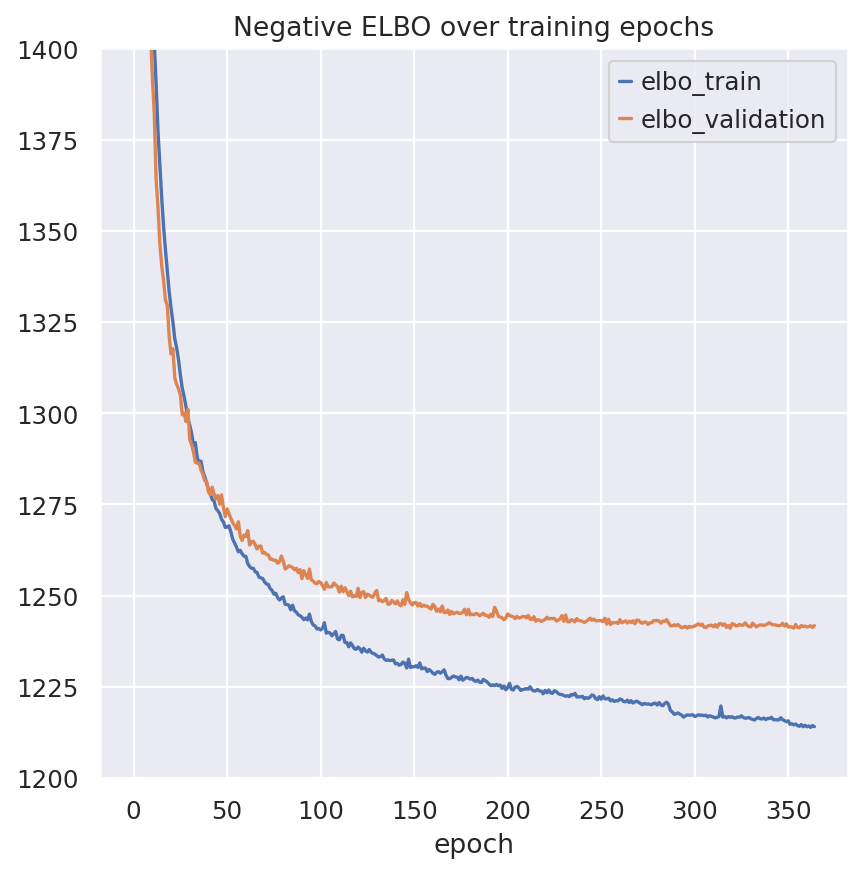

In [13]:
fig, ax = plt.subplots(1, 1)
model.history["elbo_train"].plot(ax=ax, label="train")
model.history["elbo_validation"].plot(ax=ax, label="validation")
ax.set(title="Negative ELBO over training epochs", ylim=(1200, 1400))
ax.legend()

## Analyze outputs

We use Scanpy and muon for clustering and visualization after running totalVI. It's also possible to save totalVI outputs for an R-based workflow.

In [14]:
rna = mdata.mod["rna_subset"]
protein = mdata.mod["protein"]

In [15]:
# arbitrarily store latent in rna modality
TOTALVI_LATENT_KEY = "X_totalVI"
rna.obsm[TOTALVI_LATENT_KEY] = model.get_latent_representation()

In [16]:
rna_denoised, protein_denoised = model.get_normalized_expression(
    n_samples=25, return_mean=True, transform_batch=["PBMC10k", "PBMC5k"]
)
rna.layers["denoised_rna"] = rna_denoised
protein.layers["denoised_protein"] = protein_denoised

protein.layers["protein_foreground_prob"] = (
    100
    * model.get_protein_foreground_probability(
        n_samples=25, return_mean=True, transform_batch=["PBMC10k", "PBMC5k"]
    )
)
parsed_protein_names = [p.split("_")[0] for p in protein.var_names]
protein.var["clean_names"] = parsed_protein_names
mdata.update()

/env/lib/python3.11/site-packages/mudata/_core/mudata.py:491: UserWarning: Cannot join columns with the same name because var_names are intersecting.
  warnings.warn(


Now we can compute clusters and visualize the latent space.

In [17]:
TOTALVI_CLUSTERS_KEY = "leiden_totalVI"

sc.pp.neighbors(rna, use_rep=TOTALVI_LATENT_KEY)
sc.tl.umap(rna)
sc.tl.leiden(rna, key_added=TOTALVI_CLUSTERS_KEY)

In [18]:
mdata.update()

/env/lib/python3.11/site-packages/mudata/_core/mudata.py:491: UserWarning: Cannot join columns with the same name because var_names are intersecting.
  warnings.warn(


We can now use muon plotting functions which can pull data from either modality of the MuData object.

/env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:

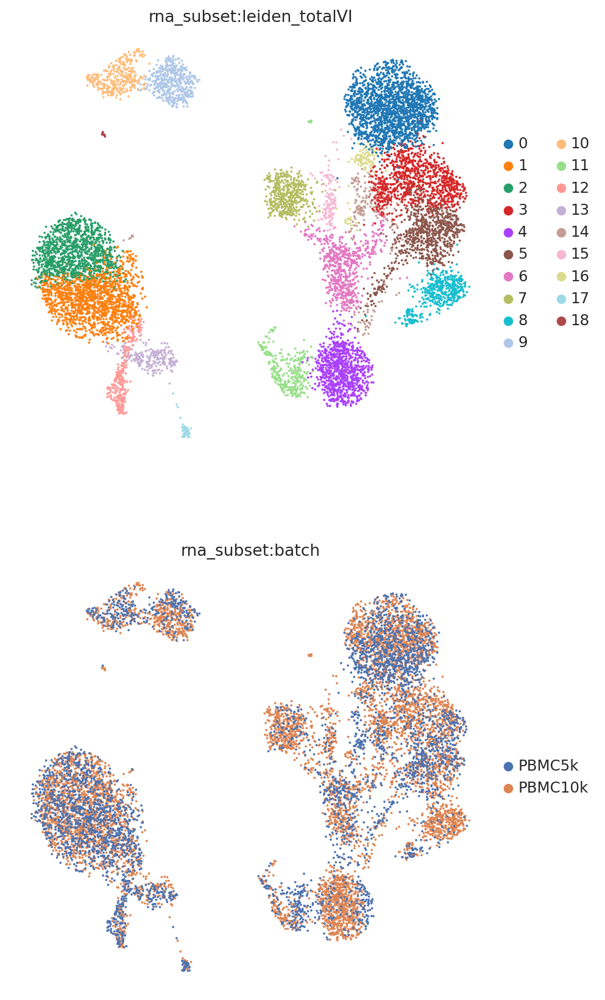

In [19]:
muon.pl.embedding(
    mdata,
    basis="rna_subset:X_umap",
    color=[f"rna_subset:{TOTALVI_CLUSTERS_KEY}", "rna_subset:batch"],
    frameon=False,
    ncols=1,
)

### Visualize denoised protein values

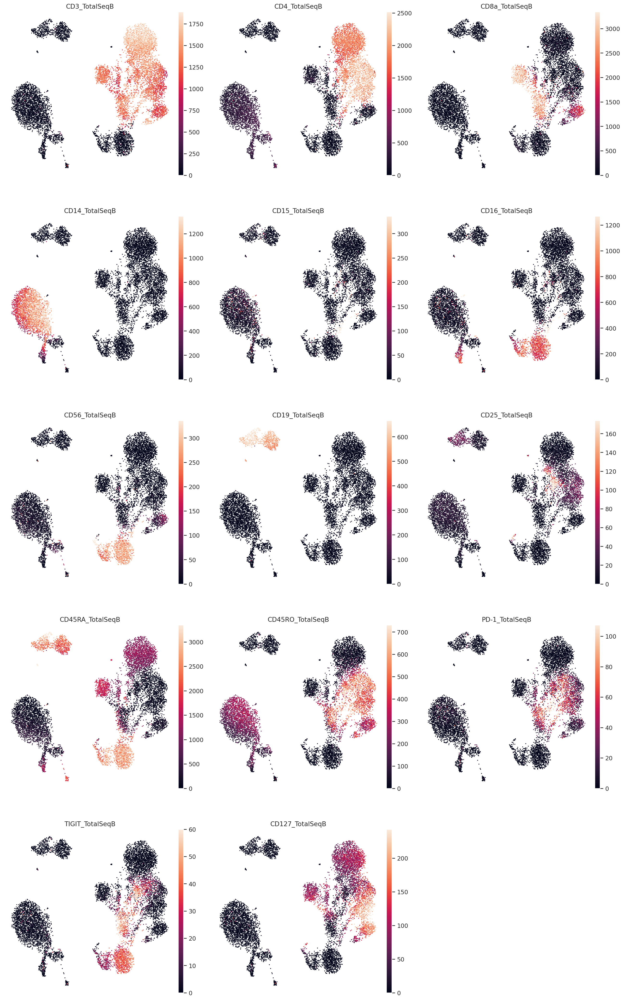

In [20]:
muon.pl.embedding(
    mdata,
    basis="rna_subset:X_umap",
    color=protein.var_names,
    frameon=False,
    ncols=3,
    vmax="p99",
    wspace=0.1,
    layer="denoised_protein",
)

### Visualize probability of foreground

Here we visualize the probability of foreground for each protein and cell (projected on UMAP).
Some proteins are easier to disentangle than others. Some proteins end up being "all background".
For example, CD15 does not appear to be captured well, when looking at the denoised values above we see little localization in the monocytes.

```{note}
While the foreground probability could theoretically be used to identify cell populations, we recommend using the denoised protein expression, which accounts for the foreground/background probability, but preserves the dynamic range of the protein measurements. Consequently, the denoised values are on the same scale as the raw data and it may be desirable to take a transformation like log or square root.
```

By viewing the foreground probability, we can get a feel for the types of cells in our dataset. For example, it's very easy to see a population of monocytes based on the CD14 foregroud probability.

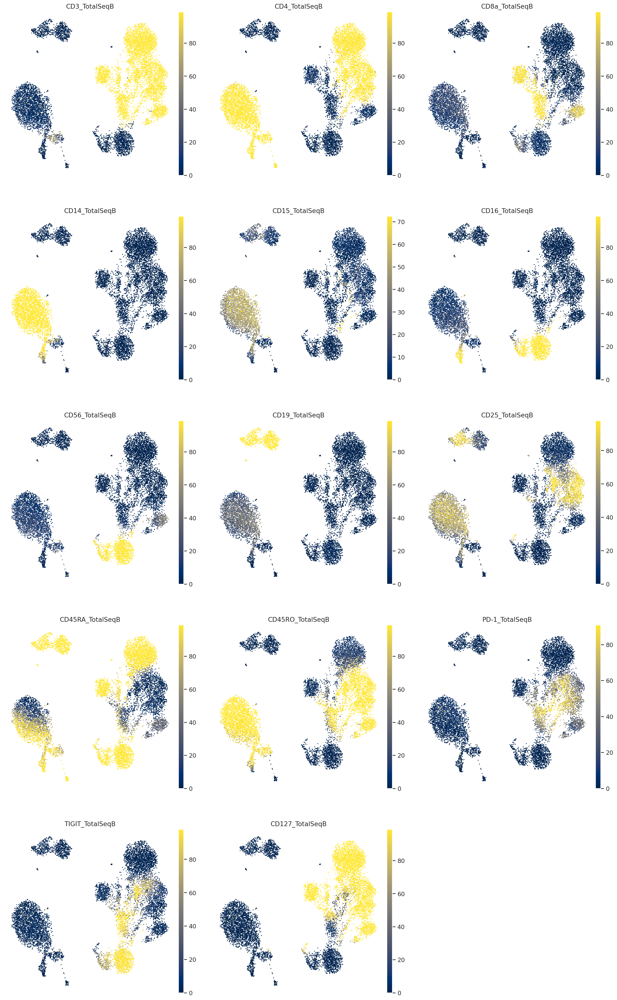

In [21]:
muon.pl.embedding(
    mdata,
    basis="rna_subset:X_umap",
    layer="protein_foreground_prob",
    color=protein.var_names,
    frameon=False,
    ncols=3,
    vmax="p99",
    wspace=0.1,
    color_map="cividis",
)

## Differential expression

Here we do a one-vs-all DE test, where each cluster is tested against all cells not in that cluster. The results for each of the one-vs-all tests is concatenated into one DataFrame object. Inividual tests can be sliced using the "comparison" column. Genes and proteins are included in the same DataFrame.

```{important}
We do not recommend using totalVI denoised values in other differential expression tools, as denoised values are a summary of a random quantity. The totalVI DE test takes into account the full uncertainty of the denoised quantities.
```

In [22]:
de_df = model.differential_expression(
    groupby="rna_subset:leiden_totalVI", delta=0.5, batch_correction=True
)
de_df.head(5)

DE...:   0%|          | 0/19 [00:00<?, ?it/s]

DE...:   5%|▌         | 1/19 [00:00<00:17,  1.05it/s]

DE...:  11%|█         | 2/19 [00:01<00:15,  1.08it/s]

DE...:  16%|█▌        | 3/19 [00:02<00:14,  1.08it/s]

DE...:  21%|██        | 4/19 [00:03<00:13,  1.09it/s]

DE...:  26%|██▋       | 5/19 [00:04<00:12,  1.09it/s]

DE...:  32%|███▏      | 6/19 [00:05<00:11,  1.10it/s]

DE...:  37%|███▋      | 7/19 [00:06<00:10,  1.10it/s]

DE...:  42%|████▏     | 8/19 [00:07<00:10,  1.10it/s]

DE...:  47%|████▋     | 9/19 [00:08<00:09,  1.10it/s]

DE...:  53%|█████▎    | 10/19 [00:09<00:08,  1.10it/s]

DE...:  58%|█████▊    | 11/19 [00:10<00:07,  1.09it/s]

DE...:  63%|██████▎   | 12/19 [00:11<00:06,  1.07it/s]

DE...:  68%|██████▊   | 13/19 [00:11<00:05,  1.08it/s]

DE...:  74%|███████▎  | 14/19 [00:12<00:04,  1.08it/s]

DE...:  79%|███████▉  | 15/19 [00:13<00:03,  1.09it/s]

DE...:  84%|████████▍ | 16/19 [00:14<00:02,  1.10it/s]

DE...:  89%|████████▉ | 17/19 [00:15<00:01,  1.10it/s]

DE...:  95%|█████████▍| 18/19 [00:16<00:00,  1.11it/s]

DE...: 100%|██████████| 19/19 [00:17<00:00,  1.11it/s]

DE...: 100%|██████████| 19/19 [00:17<00:00,  1.09it/s]

,proba_de,proba_not_de,bayes_factor,scale1,scale2,pseudocounts,delta,lfc_mean,lfc_median,lfc_std,...,raw_mean1,raw_mean2,non_zeros_proportion1,non_zeros_proportion2,raw_normalized_mean1,raw_normalized_mean2,is_de_fdr_0.05,comparison,group1,group2
ANKRD55,0.9862,0.0138,4.269190,0.000099,0.000006,0.0,0.5,6.353043,6.681940,2.812859,...,0.127775,0.009220,0.116405,0.008776,1.641991,0.088449,True,0 vs Rest,0,Rest
REG4,0.9812,0.0188,3.954919,0.000009,0.000004,0.0,0.5,5.717385,6.070202,3.558983,...,0.008121,0.004110,0.007580,0.003777,0.086721,0.039889,True,0 vs Rest,0,Rest
MYO1F,0.9776,0.0224,3.776039,0.000035,0.000744,0.0,0.5,-4.554471,-4.926318,2.183192,...,0.013535,1.470562,0.012453,0.589425,0.171044,7.967407,True,0 vs Rest,0,Rest
CA6,0.9760,0.0240,3.705408,0.000010,0.000002,0.0,0.5,5.712860,5.919196,3.640816,...,0.010287,0.002777,0.010287,0.002222,0.109388,0.027540,True,0 vs Rest,0,Rest
NOG,0.9756,0.0244,3.688469,0.000244,0.000016,0.0,0.5,8.877318,9.526344,3.827954,...,0.217109,0.016219,0.178127,0.014219,2.714708,0.207277,True,0 vs Rest,0,Rest


Now we filter the results such that we retain features above a certain Bayes factor (which here is on the natural log scale) and genes with greater than 10% non-zero entries in the cluster of interest.

In [23]:
filtered_pro = {}
filtered_rna = {}
cats = rna.obs[TOTALVI_CLUSTERS_KEY].cat.categories
for i, c in enumerate(cats):
    cid = f"{c} vs Rest"
    cell_type_df = de_df.loc[de_df.comparison == cid]
    cell_type_df = cell_type_df.sort_values("lfc_median", ascending=False)

    cell_type_df = cell_type_df[cell_type_df.lfc_median > 0]

    pro_rows = cell_type_df.index.str.contains("TotalSeqB")
    data_pro = cell_type_df.iloc[pro_rows]
    data_pro = data_pro[data_pro["bayes_factor"] > 0.7]

    data_rna = cell_type_df.iloc[~pro_rows]
    data_rna = data_rna[data_rna["bayes_factor"] > 3]
    data_rna = data_rna[data_rna["non_zeros_proportion1"] > 0.1]

    filtered_pro[c] = data_pro.index.tolist()[:3]
    filtered_rna[c] = data_rna.index.tolist()[:2]

We can also use general scanpy visualization functions

In [24]:
sc.tl.dendrogram(rna, groupby=TOTALVI_CLUSTERS_KEY, use_rep=TOTALVI_LATENT_KEY)
# This is a bit of a hack to be able to use scanpy dendrogram with the protein data
protein.obs[TOTALVI_CLUSTERS_KEY] = rna.obs[TOTALVI_CLUSTERS_KEY]
protein.obsm[TOTALVI_LATENT_KEY] = rna.obsm[TOTALVI_LATENT_KEY]
sc.tl.dendrogram(protein, groupby=TOTALVI_CLUSTERS_KEY, use_rep=TOTALVI_LATENT_KEY)

/env/lib/python3.11/site-packages/scanpy/tools/_dendrogram.py:135: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  mean_df = rep_df.groupby(level=0).mean()
/env/lib/python3.11/site-packages/scanpy/tools/_dendrogram.py:135: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  mean_df = rep_df.groupby(level=0).mean()


/env/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/env/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/env/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


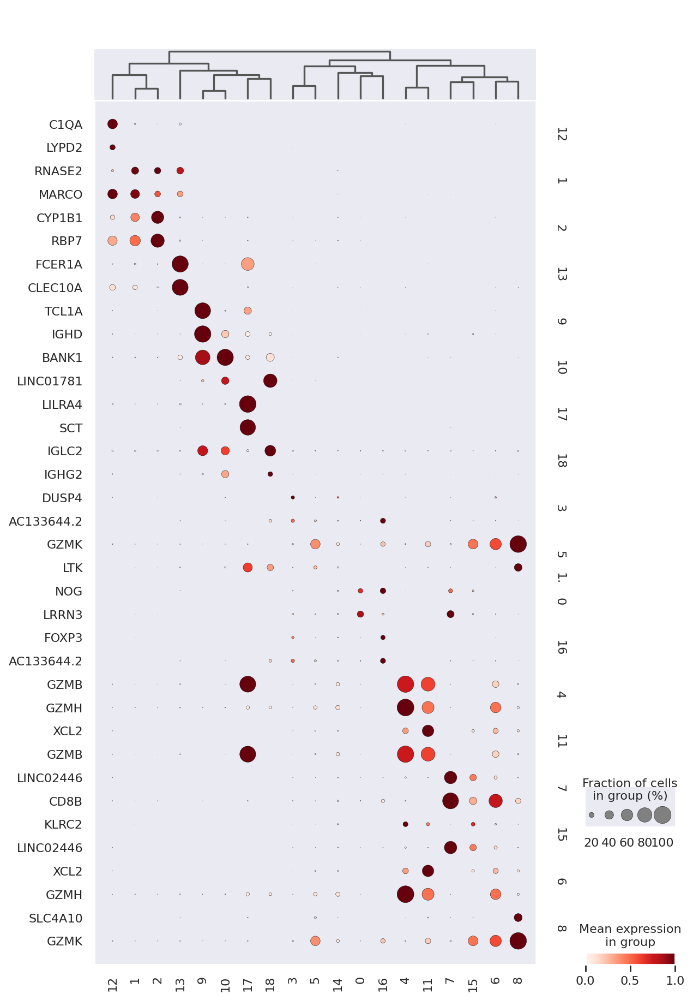

In [25]:
sc.pl.dotplot(
    rna,
    filtered_rna,
    groupby=TOTALVI_CLUSTERS_KEY,
    dendrogram=True,
    standard_scale="var",
    swap_axes=True,
)

Matrix plot displays totalVI denoised protein expression per leiden cluster.

/env/lib/python3.11/site-packages/scanpy/plotting/_matrixplot.py:143: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  values_df = self.obs_tidy.groupby(level=0).mean()
/env/lib/python3.11/site-packages/scanpy/plotting/_baseplot_class.py:893: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  var_names_ordered = [self.var_names[x] for x in var_names_idx_ordered]


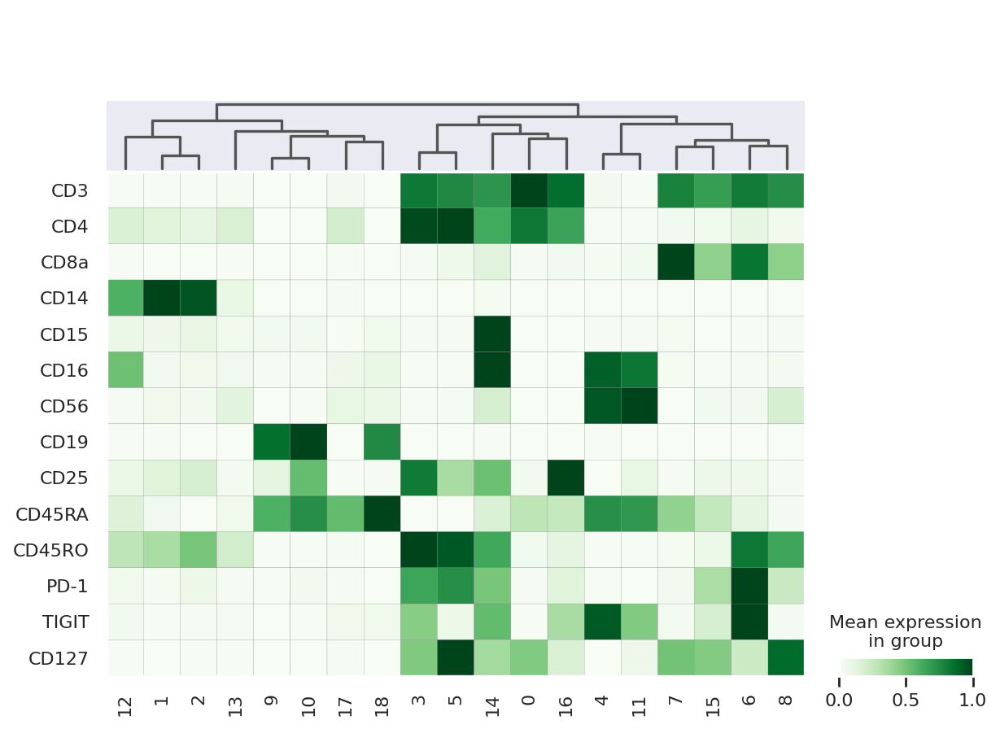

In [26]:
sc.pl.matrixplot(
    protein,
    protein.var["clean_names"],
    groupby=TOTALVI_CLUSTERS_KEY,
    gene_symbols="clean_names",
    dendrogram=True,
    swap_axes=True,
    layer="denoised_protein",
    cmap="Greens",
    standard_scale="var",
)

This is a selection of some of the markers that turned up in the RNA DE test.

/env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


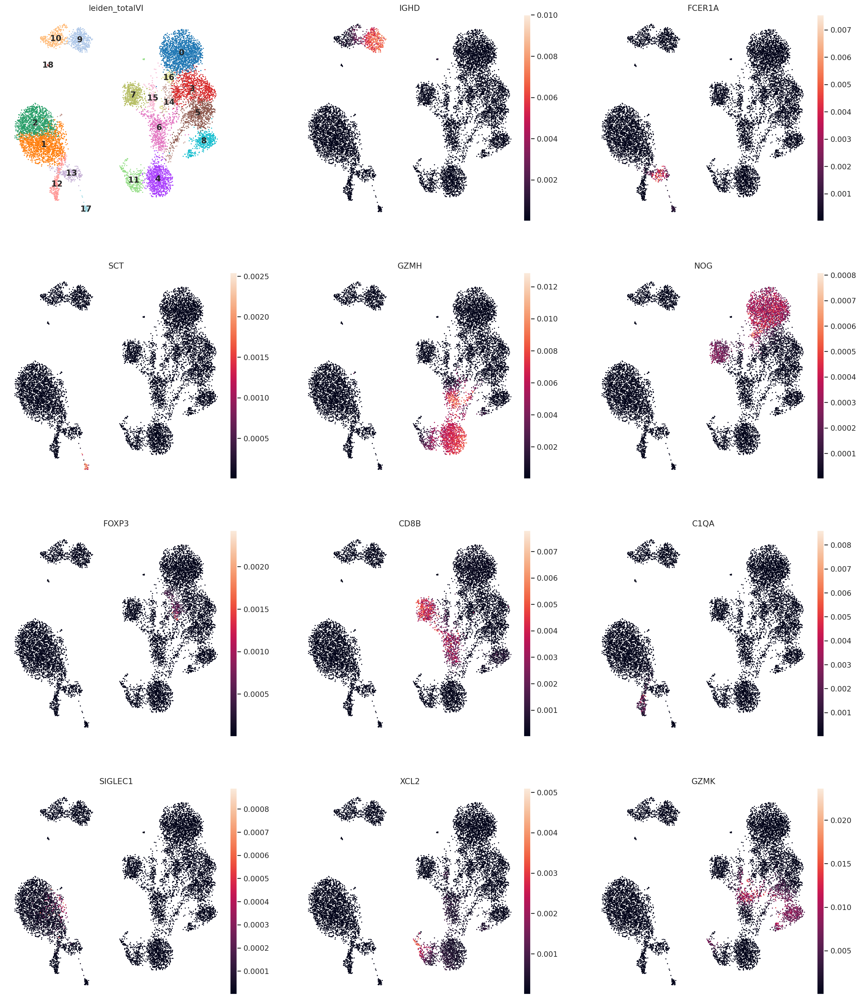

In [27]:
sc.pl.umap(
    rna,
    color=[
        TOTALVI_CLUSTERS_KEY,
        "IGHD",
        "FCER1A",
        "SCT",
        "GZMH",
        "NOG",
        "FOXP3",
        "CD8B",
        "C1QA",
        "SIGLEC1",
        "XCL2",
        "GZMK",
    ],
    legend_loc="on data",
    frameon=False,
    ncols=3,
    layer="denoised_rna",
    wspace=0.2,
)